# W&B Sweep — Actor-Critic (AC)
Corrida de 1500 episodios con la configuracion escogida en la notebook anterior

Los principales hiperparametros escogidos fueron:
orch_freq=15
batch=64
warmup=200

VERSION DE PRUEBA
Para verificar comportanmiento previo a los 15k

## 1. Instalación e Imports

In [ ]:
import os
import random
import numpy as np
import torch
import wandb
import sys
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
# Clonar desde Github:
!git clone https://github.com/valeriaeskenazi/Control-PID-Adaptativo-Inteligente-mediante-Reinforcement-Learning.git
PROJECT_PATH = '/content/Control-PID-Adaptativo-Inteligente-mediante-Reinforcement-Learning/Version_4'
sys.path.append(PROJECT_PATH)

Cloning into 'Control-PID-Adaptativo-Inteligente-mediante-Reinforcement-Learning'...
remote: Enumerating objects: 1657, done.
remote: Counting objects: 100% (217/217), done.
remote: Compressing objects: 100% (147/147), done.
remote: Total 1657 (delta 133), reused 149 (delta 69), pack-reused 1440 (from 1)
Receiving objects: 100% (1657/1657), 37.90 MiB | 14.74 MiB/s, done.
Resolving deltas: 100% (997/997), done.


In [ ]:
from Environment.Simulation_Env.Reactor_CSTR import CSTRSimulator
from Environment.PIDControlEnv_simple import PIDControlEnv_Simple
from Environment.PIDControlEnv_complex import PIDControlEnv_Complex
from Agente.Actor_Critic.train_AC import ACTrainer
from Agente.Actor_Critic.algorithm_AC import ACAgent
from Aux.Plots import SimplePlotter, print_summary

print('Imports completados')
print(f'PyTorch: {torch.__version__}')
print(f'Device: {"CUDA" if torch.cuda.is_available() else "CPU"}')

Imports completados
PyTorch: 2.10.0+cpu
Device: CPU


In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
    print('Not connected to a GPU')
else:
    print(gpu_info)

/bin/bash: line 1: nvidia-smi: command not found


## 2. Login W&B

In [ ]:
!pip install wandb --quiet

In [ ]:
wandb.login()

/usr/local/lib/python3.12/dist-packages/notebook/notebookapp.py:191: SyntaxWarning: invalid escape sequence '\/'
  | |_| | '_ \/ _` / _` |  _/ -_)
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice:wandb: WARNING Invalid choice
wandb: Enter your choice:

 2


wandb: You chose 'Use an existing W&B account'
wandb: Logging into https://api.wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: Create a new API key at: https://wandb.ai/authorize?ref=models
wandb: Store your API key securely and do not share it.
wandb: Paste your API key and hit enter:

 ··········


wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: ve326684 (ve326684-universidad-ort-uruguay) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


True

## 3. Lanzar 1500 epsiodios

Con la configuracion de expert-sweep-1, de AC_ORCH_TEST_4 como punto de partida, pero sin pesos pre entrenados

In [ ]:
# ============ CONFIG RUN PRINCIPAL AC ORCH 15K ============

WANDB_ENTITY  = 've326684-universidad-ort-uruguay'
WANDB_PROJECT = 'Tesis_AC_ORCH_15K_Prueba_3'
RUN_NAME      = 'ac_orch_15k_run-prueba_3'
AC_CTRL_CHECKPOINT = '/content/Control-PID-Adaptativo-Inteligente-mediante-Reinforcement-Learning/Version_4/Entrenamiento/CTRL/AC/agent_ctrl_best.pt'

N_EPISODES                   = 1500
EVAL_FREQUENCY               = 100
LOG_FREQUENCY                = 100
SAVE_FREQUENCY               = 2000
EARLY_STOPPING_PATIENCE      = 50
EARLY_STOPPING_MIN_DELTA_PCT = 0.01
SEED                         = 42
DEVICE                       = 'cuda' if torch.cuda.is_available() else 'cpu'
DT                           = 1.0

MANIPULABLE_RANGES = [(300, 420), (99.5, 104)]

trainer_config = {
    'env_config': {
        'architecture'             : 'jerarquica',
        'env_type'                 : 'simulation',
        'n_manipulable_vars'       : 2,
        'manipulable_ranges'       : MANIPULABLE_RANGES,
        'n_target_vars'            : 1,
        'target_ranges'            : [(0.2, 0.7)],       # acotado a rango físico realista
        'target_setpoints'         : [0.4],
        'target_working_ranges'    : [(0.0, 2.0)],
        'dt_usuario'               : DT,
        'max_steps'                : 120,                # fijo para corrida larga
        'orch_freq'                : 15,                 # ganador del sweep
        'max_time_detector'        : 120,
        'reward_dead_band'         : 0.02,
        'delta_percent_ctrl'       : 0.05,
        'delta_percent_orch'       : 0.05,
        'reward_weights'           : {'error': 1.0, 'tiempo': 0.001, 'overshoot': 0.3, 'energy': 0.001},
        'pid_limits'               : [(0.01, 5.0), (0.001, 1.0), (0.0, 1.0)],
        'agent_orchestrator_config': {'agent_type': 'continuous'},
        'env_type_config'          : {'dt': DT, 'control_limits': (MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1])},
        'stability_config'         : {
            'error_increase_tolerance': 2.0,
            'max_sign_changes_ratio'  : 0.2,
            'max_abrupt_change_ratio' : 0.05,
            'abrupt_change_threshold' : 0.5,
        },
    },

    'ctrl_checkpoint_path': AC_CTRL_CHECKPOINT,
    'agent_ctrl_config': {
        'algorithm'  : 'ac',
        'state_dim'  : 10,
        'action_dim' : 6,
        'n_vars'     : 2,
        'action_type': 'continuous',
        'hidden_dims': (256, 128, 64),           # arquitectura del CTRL entrenado
        'device'     : DEVICE,
    },

    'agent_orch_config': {
        'algorithm'    : 'ac',
        'state_dim'    : 5,
        'action_dim'   : 3,
        'n_vars'       : 2,
        'action_type'  : 'continuous',
        'hidden_dims'  : (64, 32),               # ganador del sweep
        'lr_actor'     : 1e-5,                   # ganador del sweep
        'lr_critic'    : 1e-3,
        'gamma'        : 0.99,
        'entropy_coef' : 0.05,                   # ganador del sweep
        'batch_size'   : 64,                     # ganador del sweep
        'buffer_size'  : 10000,                  # ganador del sweep
        'warmup_steps' : 200,                    # ganador del sweep
        'device'       : DEVICE,
        'seed'         : SEED,
    },

    'n_episodes'                  : N_EPISODES,
    'max_steps_per_episode'       : 120,
    'eval_frequency'              : EVAL_FREQUENCY,
    'log_frequency'               : LOG_FREQUENCY,
    'save_frequency'              : SAVE_FREQUENCY,
    'checkpoint_dir'              : f'checkpoints/{RUN_NAME}',
    'early_stopping_patience'     : EARLY_STOPPING_PATIENCE,
    'early_stopping_min_delta_pct': EARLY_STOPPING_MIN_DELTA_PCT,
    'use_wandb'                   : True,
}

# ============ REPRODUCIBILIDAD ============
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed(SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark     = False

# ============ INIT WANDB ============
wandb.init(
    project = WANDB_PROJECT,
    entity  = WANDB_ENTITY,
    name    = RUN_NAME,
    tags    = ['ac', 'orch', '15k', 'produccion'],
    config  = trainer_config,
)

# ============ ENTRENAR ============
cstr    = CSTRSimulator(dt=DT, control_limits=(MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1]))
trainer = ACTrainer(trainer_config)
trainer.env.proceso.connect_external_process(cstr)
trainer.train()

# ============ GUARDAR PESOS EN W&B ============
import os
checkpoint_path = f'checkpoints/{RUN_NAME}'
if os.path.exists(checkpoint_path):
    artifact = wandb.Artifact(
        name        = f'model_{RUN_NAME}',
        type        = 'model',
        description = 'Pesos AC ORCH, config ganadora sweep, 15k episodios'
    )
    artifact.add_dir(checkpoint_path)
    wandb.log_artifact(artifact)
    print('✓ Pesos guardados en W&B')

# ============ MÉTRICAS FINALES ============
wandb.log({
    'final_eval_reward'      : trainer.best_reward,
    'total_episodes'         : len(trainer.episode_rewards),
    'final_reward_mean10'    : np.mean(trainer.episode_rewards[-10:]),
    'final_energy_mean10'    : np.mean(trainer.episode_energies[-10:]),
    'final_overshoot_mean10' : np.mean(trainer.episode_max_overshoots[-10:]),
}, step=len(trainer.episode_rewards))

wandb.finish()
print(f'Run completado: {RUN_NAME}')


Cargando agente CTRL pre-entrenado desde: /content/Control-PID-Adaptativo-Inteligente-mediante-Reinforcement-Learning/Version_4/Entrenamiento/CTRL/AC/agent_ctrl_best.pt
AC Estocástico creado | role=ctrl | state=10 | action=6 | device=cuda
AC Agent cargado desde: /content/Control-PID-Adaptativo-Inteligente-mediante-Reinforcement-Learning/Version_4/Entrenamiento/CTRL/AC/agent_ctrl_best.pt
AC Estocástico creado | role=orch | state=5 | action=3 | device=cuda

Episodio 0/1500
  Reward: -0.10 | Length: 1
  Actor Loss: 0.0000 | Critic Loss: 0.0000
  Advantage mean: 0.0000
  ORCH Memory: 1

Episodio 100/1500
  Reward: -0.10 | Length: 1
  Actor Loss: -0.3456 | Critic Loss: 0.0727
  Advantage mean: -0.0364
  ORCH Memory: 244


wandb: Adding directory to artifact (checkpoints/ac_orch_15k_run-prueba_3)... Done. 0.0s


Evaluación: Reward promedio = -0.06
AC Agent guardado en: checkpoints/ac_orch_15k_run-prueba_3/agent_ctrl_best.pt
AC Agent guardado en: checkpoints/ac_orch_15k_run-prueba_3/agent_orch_best.pt
Checkpoint guardado: best

Episodio 200/1500
  Reward: -0.02 | Length: 61
  Actor Loss: -0.3896 | Critic Loss: 0.9247
  Advantage mean: -0.0455
  ORCH Memory: 504


wandb: Adding directory to artifact (checkpoints/ac_orch_15k_run-prueba_3)... Done. 0.0s


Evaluación: Reward promedio = -0.05
  Sin mejora: 1/50
AC Agent guardado en: checkpoints/ac_orch_15k_run-prueba_3/agent_ctrl_best.pt
AC Agent guardado en: checkpoints/ac_orch_15k_run-prueba_3/agent_orch_best.pt
Checkpoint guardado: best

Episodio 300/1500
  Reward: -0.04 | Length: 1
  Actor Loss: 0.6043 | Critic Loss: 4.1424
  Advantage mean: 0.2179
  ORCH Memory: 713
Evaluación: Reward promedio = -0.06
  Sin mejora: 2/50

Episodio 400/1500
  Reward: -0.03 | Length: 1
  Actor Loss: 1.3372 | Critic Loss: 1.8602
  Advantage mean: 0.4328
  ORCH Memory: 1007


wandb: Adding directory to artifact (checkpoints/ac_orch_15k_run-prueba_3)... Done. 0.0s


Evaluación: Reward promedio = -0.05
  Sin mejora: 3/50
AC Agent guardado en: checkpoints/ac_orch_15k_run-prueba_3/agent_ctrl_best.pt
AC Agent guardado en: checkpoints/ac_orch_15k_run-prueba_3/agent_orch_best.pt
Checkpoint guardado: best

Episodio 500/1500
  Reward: -0.01 | Length: 120
  Actor Loss: 0.0094 | Critic Loss: 15.3794
  Advantage mean: 0.0459
  ORCH Memory: 1300
Evaluación: Reward promedio = -0.08
  Sin mejora: 4/50

Episodio 600/1500
  Reward: -0.06 | Length: 1
  Actor Loss: -2.3055 | Critic Loss: 33.8888
  Advantage mean: -0.4982
  ORCH Memory: 1572
Evaluación: Reward promedio = -0.06
  Sin mejora: 5/50


wandb: Adding directory to artifact (checkpoints/ac_orch_15k_run-prueba_3)... Done. 0.0s



Episodio 700/1500
  Reward: -0.02 | Length: 120
  Actor Loss: 0.4020 | Critic Loss: 19.4421
  Advantage mean: 0.1237
  ORCH Memory: 1833
Evaluación: Reward promedio = -0.05
  Sin mejora: 6/50
AC Agent guardado en: checkpoints/ac_orch_15k_run-prueba_3/agent_ctrl_best.pt
AC Agent guardado en: checkpoints/ac_orch_15k_run-prueba_3/agent_orch_best.pt
Checkpoint guardado: best

Episodio 800/1500
  Reward: -0.10 | Length: 1
  Actor Loss: -0.6800 | Critic Loss: 13.9241
  Advantage mean: -0.0971
  ORCH Memory: 2115
Evaluación: Reward promedio = -0.06
  Sin mejora: 7/50


wandb: Adding directory to artifact (checkpoints/ac_orch_15k_run-prueba_3)... Done. 0.0s



Episodio 900/1500
  Reward: -0.09 | Length: 1
  Actor Loss: -1.5494 | Critic Loss: 15.7778
  Advantage mean: -0.4501
  ORCH Memory: 2402
Evaluación: Reward promedio = -0.04
  Sin mejora: 8/50
AC Agent guardado en: checkpoints/ac_orch_15k_run-prueba_3/agent_ctrl_best.pt
AC Agent guardado en: checkpoints/ac_orch_15k_run-prueba_3/agent_orch_best.pt
Checkpoint guardado: best

Episodio 1000/1500
  Reward: -0.10 | Length: 1
  Actor Loss: -1.1524 | Critic Loss: 26.5385
  Advantage mean: -0.2376
  ORCH Memory: 2659
Evaluación: Reward promedio = -0.05
  Sin mejora: 9/50

Episodio 1100/1500
  Reward: -0.08 | Length: 1
  Actor Loss: 1.4475 | Critic Loss: 6.5520
  Advantage mean: 0.4813
  ORCH Memory: 2909
Evaluación: Reward promedio = -0.06
  Sin mejora: 10/50

Episodio 1200/1500
  Reward: -0.01 | Length: 120
  Actor Loss: -1.0155 | Critic Loss: 13.7050
  Advantage mean: -0.2143
  ORCH Memory: 3130
Evaluación: Reward promedio = -0.05
  Sin mejora: 11/50

Episodio 1300/1500
  Reward: -0.04 | Leng

wandb: Adding directory to artifact (checkpoints/ac_orch_15k_run-prueba_3)... Done. 0.0s



Episodio 1400/1500
  Reward: -0.00 | Length: 1
  Actor Loss: 0.1324 | Critic Loss: 3.0007
  Advantage mean: 0.1314
  ORCH Memory: 3694
Evaluación: Reward promedio = -0.04
  Sin mejora: 13/50
AC Agent guardado en: checkpoints/ac_orch_15k_run-prueba_3/agent_ctrl_best.pt
AC Agent guardado en: checkpoints/ac_orch_15k_run-prueba_3/agent_orch_best.pt
Checkpoint guardado: best


wandb: Adding directory to artifact (checkpoints/ac_orch_15k_run-prueba_3)... Done. 0.0s


✓ Pesos guardados en W&B


actor_loss,▄▄▄▄▄▄▄▅▄▅▃▅▅▄▄▄▂▄▃▄▅█▄▅▅▄▃▄▁▄▃▃▄▁▂▅▅▅▅▂
critic_loss,▁▁▁▁▁▂▂▁▂▂▃▆▄▄▄▅▃▃▇▂█▇▅▂▃▄▇▄▃▅▂▅▄▄▄▄▂▄▃▃
energy,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
eval_reward,▅▆▅▆▁▆▆▆█▇▄▇▇█
final_energy_mean10,▁
final_eval_reward,▁
final_overshoot_mean10,▁
final_reward_mean10,▁
overshoot,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
reward,▂▁▁▁▆▆▁▆▁▇▃▆▆▂▃█▁▆▃▁▄▁▄█▁▄▄▁▂▄▆▄▅▃▆▇▂▇▁█
+1,...


Run completado: ac_orch_15k_run-prueba_3


## Prueba 4

In [ ]:
# ============ CONFIG RUN PRINCIPAL AC ORCH 15K ============

WANDB_ENTITY  = 've326684-universidad-ort-uruguay'
WANDB_PROJECT = 'Tesis_AC_ORCH_15K_Prueba'
RUN_NAME      = 'ac_orch_15k_run-prueba_4'
AC_CTRL_CHECKPOINT = '/content/Control-PID-Adaptativo-Inteligente-mediante-Reinforcement-Learning/Version_4/Entrenamiento/CTRL/AC/agent_ctrl_best.pt'

N_EPISODES                   = 1500
EVAL_FREQUENCY               = 100
LOG_FREQUENCY                = 100
SAVE_FREQUENCY               = 2000
EARLY_STOPPING_PATIENCE      = 50
EARLY_STOPPING_MIN_DELTA_PCT = 0.01
SEED                         = 42
DEVICE                       = 'cuda' if torch.cuda.is_available() else 'cpu'
DT                           = 1.0

MANIPULABLE_RANGES = [(300, 420), (99.5, 104)]

trainer_config = {
    'env_config': {
        'architecture'             : 'jerarquica',
        'env_type'                 : 'simulation',
        'n_manipulable_vars'       : 2,
        'manipulable_ranges'       : MANIPULABLE_RANGES,
        'n_target_vars'            : 1,
        'target_ranges'            : [(0.2, 0.7)],       # acotado a rango físico realista
        'target_setpoints'         : [0.4],
        'target_working_ranges'    : [(0.0, 2.0)],
        'dt_usuario'               : DT,
        'max_steps'                : 120,                # fijo para corrida larga
        'orch_freq'                : 15,                 # ganador del sweep
        'max_time_detector'        : 120,
        'reward_dead_band'         : 0.02,
        'delta_percent_ctrl'       : 0.05,
        'delta_percent_orch'       : 0.05,
        'reward_weights'           : {'error': 1.0, 'tiempo': 0.001, 'overshoot': 0.3, 'energy': 0.001},
        'pid_limits'               : [(0.01, 5.0), (0.001, 1.0), (0.0, 1.0)],
        'agent_orchestrator_config': {'agent_type': 'continuous'},
        'env_type_config'          : {'dt': DT, 'control_limits': (MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1])},
        'stability_config'         : {
            'error_increase_tolerance': 2.0,
            'max_sign_changes_ratio'  : 0.2,
            'max_abrupt_change_ratio' : 0.05,
            'abrupt_change_threshold' : 0.5,
        },
    },

    'ctrl_checkpoint_path': AC_CTRL_CHECKPOINT,
    'agent_ctrl_config': {
        'algorithm'  : 'ac',
        'state_dim'  : 10,
        'action_dim' : 6,
        'n_vars'     : 2,
        'action_type': 'continuous',
        'hidden_dims': (256, 128, 64),           # arquitectura del CTRL entrenado
        'device'     : DEVICE,
    },

    'agent_orch_config': {
        'algorithm'    : 'ac',
        'state_dim'    : 5,
        'action_dim'   : 3,
        'n_vars'       : 2,
        'action_type'  : 'continuous',
        'hidden_dims'  : (64, 32),               # ganador del sweep
        'lr_actor'     : 1e-5,                   # ganador del sweep
        'lr_critic'    : 1e-3,
        'gamma'        : 0.5,
        'entropy_coef' : 0.05,                   # ganador del sweep
        'batch_size'   : 64,                     # ganador del sweep
        'buffer_size'  : 10000,                  # ganador del sweep
        'warmup_steps' : 200,                    # ganador del sweep
        'device'       : DEVICE,
        'seed'         : SEED,
    },

    'n_episodes'                  : N_EPISODES,
    'max_steps_per_episode'       : 120,
    'eval_frequency'              : EVAL_FREQUENCY,
    'log_frequency'               : LOG_FREQUENCY,
    'save_frequency'              : SAVE_FREQUENCY,
    'checkpoint_dir'              : f'checkpoints/{RUN_NAME}',
    'early_stopping_patience'     : EARLY_STOPPING_PATIENCE,
    'early_stopping_min_delta_pct': EARLY_STOPPING_MIN_DELTA_PCT,
    'use_wandb'                   : True,
}

# ============ REPRODUCIBILIDAD ============
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed(SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark     = False

# ============ INIT WANDB ============
wandb.init(
    project = WANDB_PROJECT,
    entity  = WANDB_ENTITY,
    name    = RUN_NAME,
    tags    = ['ac', 'orch', '15k', 'produccion'],
    config  = trainer_config,
)

# ============ ENTRENAR ============
cstr    = CSTRSimulator(dt=DT, control_limits=(MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1]))
trainer = ACTrainer(trainer_config)
trainer.env.proceso.connect_external_process(cstr)
trainer.train()

# ============ GUARDAR PESOS EN W&B ============
import os
checkpoint_path = f'checkpoints/{RUN_NAME}'
if os.path.exists(checkpoint_path):
    artifact = wandb.Artifact(
        name        = f'model_{RUN_NAME}',
        type        = 'model',
        description = 'Pesos AC ORCH, config ganadora sweep, 15k episodios'
    )
    artifact.add_dir(checkpoint_path)
    wandb.log_artifact(artifact)
    print('✓ Pesos guardados en W&B')

# ============ MÉTRICAS FINALES ============
wandb.log({
    'final_eval_reward'      : trainer.best_reward,
    'total_episodes'         : len(trainer.episode_rewards),
    'final_reward_mean10'    : np.mean(trainer.episode_rewards[-10:]),
    'final_energy_mean10'    : np.mean(trainer.episode_energies[-10:]),
    'final_overshoot_mean10' : np.mean(trainer.episode_max_overshoots[-10:]),
}, step=len(trainer.episode_rewards))

wandb.finish()
print(f'Run completado: {RUN_NAME}')


Cargando agente CTRL pre-entrenado desde: /content/Control-PID-Adaptativo-Inteligente-mediante-Reinforcement-Learning/Version_4/Entrenamiento/CTRL/AC/agent_ctrl_best.pt
AC Estocástico creado | role=ctrl | state=10 | action=6 | device=cuda
AC Agent cargado desde: /content/Control-PID-Adaptativo-Inteligente-mediante-Reinforcement-Learning/Version_4/Entrenamiento/CTRL/AC/agent_ctrl_best.pt
AC Estocástico creado | role=orch | state=5 | action=3 | device=cuda

Episodio 0/1500
  Reward: -0.10 | Length: 1
  Actor Loss: 0.0000 | Critic Loss: 0.0000
  Advantage mean: 0.0000
  ORCH Memory: 1

Episodio 100/1500
  Reward: -0.10 | Length: 1
  Actor Loss: -0.2566 | Critic Loss: 0.0144
  Advantage mean: -0.0119
  ORCH Memory: 244


wandb: Adding directory to artifact (checkpoints/ac_orch_15k_run-prueba_4)... Done. 0.0s


Evaluación: Reward promedio = -0.06
AC Agent guardado en: checkpoints/ac_orch_15k_run-prueba_4/agent_ctrl_best.pt
AC Agent guardado en: checkpoints/ac_orch_15k_run-prueba_4/agent_orch_best.pt
Checkpoint guardado: best

Episodio 200/1500
  Reward: -0.02 | Length: 61
  Actor Loss: -0.2576 | Critic Loss: 0.0046
  Advantage mean: -0.0117
  ORCH Memory: 504


wandb: Adding directory to artifact (checkpoints/ac_orch_15k_run-prueba_4)... Done. 0.0s


Evaluación: Reward promedio = -0.05
  Sin mejora: 1/50
AC Agent guardado en: checkpoints/ac_orch_15k_run-prueba_4/agent_ctrl_best.pt
AC Agent guardado en: checkpoints/ac_orch_15k_run-prueba_4/agent_orch_best.pt
Checkpoint guardado: best

Episodio 300/1500
  Reward: -0.08 | Length: 1
  Actor Loss: -0.1555 | Critic Loss: 0.0082
  Advantage mean: 0.0185
  ORCH Memory: 728
Evaluación: Reward promedio = -0.07
  Sin mejora: 2/50

Episodio 400/1500
  Reward: -0.05 | Length: 1
  Actor Loss: -0.1935 | Critic Loss: 0.0100
  Advantage mean: 0.0061
  ORCH Memory: 997


wandb: Adding directory to artifact (checkpoints/ac_orch_15k_run-prueba_4)... Done. 0.0s


Evaluación: Reward promedio = -0.05
  Sin mejora: 3/50
AC Agent guardado en: checkpoints/ac_orch_15k_run-prueba_4/agent_ctrl_best.pt
AC Agent guardado en: checkpoints/ac_orch_15k_run-prueba_4/agent_orch_best.pt
Checkpoint guardado: best

Episodio 500/1500
  Reward: -0.07 | Length: 1
  Actor Loss: -0.2299 | Critic Loss: 0.0037
  Advantage mean: -0.0008
  ORCH Memory: 1282


wandb: Adding directory to artifact (checkpoints/ac_orch_15k_run-prueba_4)... Done. 0.0s


Evaluación: Reward promedio = -0.05
  Sin mejora: 4/50
AC Agent guardado en: checkpoints/ac_orch_15k_run-prueba_4/agent_ctrl_best.pt
AC Agent guardado en: checkpoints/ac_orch_15k_run-prueba_4/agent_orch_best.pt
Checkpoint guardado: best

Episodio 600/1500
  Reward: -0.03 | Length: 1
  Actor Loss: -0.2468 | Critic Loss: 0.0083
  Advantage mean: -0.0033
  ORCH Memory: 1529


wandb: Adding directory to artifact (checkpoints/ac_orch_15k_run-prueba_4)... Done. 0.0s


Evaluación: Reward promedio = -0.03
AC Agent guardado en: checkpoints/ac_orch_15k_run-prueba_4/agent_ctrl_best.pt
AC Agent guardado en: checkpoints/ac_orch_15k_run-prueba_4/agent_orch_best.pt
Checkpoint guardado: best

Episodio 700/1500
  Reward: -0.04 | Length: 120
  Actor Loss: -0.2588 | Critic Loss: 0.0083
  Advantage mean: -0.0035
  ORCH Memory: 1836
Evaluación: Reward promedio = -0.05
  Sin mejora: 1/50

Episodio 800/1500
  Reward: -0.02 | Length: 1
  Actor Loss: -0.1618 | Critic Loss: 0.0117
  Advantage mean: 0.0225
  ORCH Memory: 2058
Evaluación: Reward promedio = -0.05
  Sin mejora: 2/50

Episodio 900/1500
  Reward: -0.07 | Length: 1
  Actor Loss: -0.1898 | Critic Loss: 0.0037
  Advantage mean: 0.0168
  ORCH Memory: 2333
Evaluación: Reward promedio = -0.06
  Sin mejora: 3/50

Episodio 1000/1500
  Reward: -0.02 | Length: 1
  Actor Loss: -0.2077 | Critic Loss: 0.0064
  Advantage mean: 0.0125
  ORCH Memory: 2612
Evaluación: Reward promedio = -0.05
  Sin mejora: 4/50

Episodio 1100

wandb: Adding directory to artifact (checkpoints/ac_orch_15k_run-prueba_4)... Done. 0.0s


✓ Pesos guardados en W&B


actor_loss,█████▅▃▄▄▄▂▅▄▃▄▄▃▃▃▄▄▄▅▅▄▃▁▂▁▂▅▃▂▄▁▂▃▃▂▁
critic_loss,▁▁▁▄▄▂▂▂▄▄▅▇▄▅▄▇▇▃▅▆▃▆▄▇▃▃▆▅▅▅▄▆▅▄▄█▄▃▅▄
energy,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
eval_reward,▂▃▁▄▅█▃▃▂▄▅▁▅▄
final_energy_mean10,▁
final_eval_reward,▁
final_overshoot_mean10,▁
final_reward_mean10,▁
overshoot,▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
reward,▇▁▂▂▇█▆▁▁▂█▂█▃▁▁▆▃█▃█▄▃▁▆▁▁▂▁▇▁▆▂▇▁▂▆▁██
+1,...


Run completado: ac_orch_15k_run-prueba_4


Mejoro, pruebo si CB tb mejora

In [ ]:
api = wandb.Api()
artifact = api.artifact('ve326684-universidad-ort-uruguay/Tesis_AC_ORCH_15K_Prueba/model_ac_orch_15k_run-prueba_4 :latest')
artifact_dir = artifact.download()

DEVICE             = 'cuda' if torch.cuda.is_available() else 'cpu'
MANIPULABLE_RANGES = [(300, 420), (99.5, 104)]
ORCH_FREQ          = 15
N_DEC_ORCH         = 8
MAX_STEPS          = ORCH_FREQ * N_DEC_ORCH   # 120

eval_config = {
    'env_config': {
        'architecture'             : 'jerarquica',
        'env_type'                 : 'simulation',
        'n_manipulable_vars'       : 2,
        'manipulable_ranges'       : MANIPULABLE_RANGES,
        'n_target_vars'            : 1,
        'target_ranges'            : [(0.0, 1.0)],
        'target_setpoints'         : [0.4],
        'target_working_ranges'    : [(0.0, 2.0)],
        'dt_usuario'               : 1.0,
        'max_steps'                : MAX_STEPS,
        'orch_freq'                : ORCH_FREQ,
        'max_time_detector'        : 120,
        'reward_dead_band'         : 0.02,
        'delta_percent_ctrl'       : 0.05,
        'delta_percent_orch'       : 0.05,
        'reward_weights'           : {'error': 1.0, 'tiempo': 0.001, 'overshoot': 0.3, 'energy': 0.001},
        'pid_limits'               : [(0.01, 5.0), (0.001, 1.0), (0.0, 1.0)],
        'agent_orchestrator_config': {'agent_type': 'continuous'},
        'env_type_config'          : {'dt': 1.0, 'control_limits': (MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1])},
        'stability_config'         : {
            'error_increase_tolerance': 2.0,
            'max_sign_changes_ratio'  : 0.2,
            'max_abrupt_change_ratio' : 0.05,
            'abrupt_change_threshold' : 0.5,
        },
    },
    'ctrl_checkpoint_path': f'{artifact_dir}/agent_ctrl_best.pt',
    'agent_ctrl_config': {
        'algorithm'  : 'ac',
        'state_dim'  : 10,
        'action_dim' : 6,
        'n_vars'     : 2,
        'action_type': 'continuous',
        'hidden_dims': (256, 128, 64),
        'device'     : DEVICE,
    },
    'agent_orch_config': {
        'algorithm'    : 'ac',
        'state_dim'    : 5,
        'action_dim'   : 3,
        'n_vars'       : 2,
        'action_type'  : 'continuous',
        'hidden_dims'  : (64, 32),
        'lr_actor'     : 1e-05,
        'lr_critic'    : 1e-03,
        'gamma'        : 0.5,
        'entropy_coef' : 0.05,
        'batch_size'   : 64,
        'buffer_size'  : 10000,
        'warmup_steps' : 200,
        'device'       : DEVICE,
        'seed'         : 42,
    },
    'n_episodes'                  : 1,
    'max_steps_per_episode'       : MAX_STEPS,
    'eval_frequency'              : 9999,
    'log_frequency'               : 1,
    'save_frequency'              : 9999,
    'checkpoint_dir'              : 'checkpoints/eval_tmp',
    'early_stopping_patience'     : 9999,
    'early_stopping_min_delta_pct': 0.01,
    'use_wandb'                   : False,
}

cstr = CSTRSimulator(dt=1.0, control_limits=(MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1]))
trainer_eval = ACTrainer(eval_config)
trainer_eval.env.proceso.connect_external_process(cstr)
trainer_eval.agent_orch.load(f'{artifact_dir}/agent_orch_best.pt')
print('Agentes cargados')
print(f'orch_freq={ORCH_FREQ} | max_steps={MAX_STEPS} | decisiones ORCH/ep={N_DEC_ORCH}')

wandb:   2 of 2 files downloaded.  


Cargando agente CTRL pre-entrenado desde: /content/artifacts/model_ac_orch_15k_run-prueba_4:v4/agent_ctrl_best.pt
AC Estocástico creado | role=ctrl | state=10 | action=6 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-prueba_4:v4/agent_ctrl_best.pt
AC Estocástico creado | role=orch | state=5 | action=3 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-prueba_4:v4/agent_orch_best.pt
Agentes cargados
orch_freq=15 | max_steps=120 | decisiones ORCH/ep=8


In [ ]:
# ============ EVALUACIÓN CON DISTINTOS Cb ============
def evaluar_cb(trainer, cb_sp, max_steps=None):
    if max_steps is None:
        max_steps = trainer.env.max_steps

    obs, _ = trainer.env.reset()
    trainer.env.target_setpoints = [cb_sp]
    trainer.env._update_errors()

    cstr   = trainer.env.proceso.external_process
    print(f'\nSP_Cb={cb_sp} | Estado inicial: Cb={cstr.state[1]:.3f} | T={cstr.state[3]:.1f}K | V={cstr.state[4]:.2f}m³')

    cb_traj, T_traj, V_traj = [cstr.state[1]], [cstr.state[3]], [cstr.state[4]]
    SP_T_traj, SP_V_traj    = [], []   # trayectoria de SPs que pide el ORCH

    state_ctrl = obs['ctrl']
    state_orch = obs['orch']
    done       = False
    step       = 0

    while not done and step < max_steps:
        action_orch = trainer.agent_orch.select_action(state_orch, training=False)
        action_ctrl = trainer.agent_ctrl.select_action(state_ctrl, training=False)
        action      = {'ctrl': action_ctrl, 'orch': action_orch}

        next_obs, reward, terminated, truncated, info = trainer.env.step(action)
        done = terminated or truncated

        # Registrar SPs solo cuando el ORCH actuó
        if info.get('orch_acted', False):
            SP_T_traj.append(trainer.env.new_SP[0])
            SP_V_traj.append(trainer.env.new_SP[1])
            print(f'  Step {step:3d} | ORCH actúa → SP_T={trainer.env.new_SP[0]:.1f}K  SP_V={trainer.env.new_SP[1]:.2f}m³ | Cb={cstr.state[1]:.4f}')

        cb_traj.append(cstr.state[1])
        T_traj.append(cstr.state[3])
        V_traj.append(cstr.state[4])

        state_ctrl = next_obs['ctrl']
        state_orch = next_obs['orch']
        step      += 1

    cb_final = cb_traj[-1]
    print(f'  → Cb_final={cb_final:.4f} | Error={abs(cb_final - cb_sp):.4f}')
    return np.array(cb_traj), np.array(T_traj), np.array(V_traj), SP_T_traj, SP_V_traj



SP_Cb=0.2 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=415.3K  SP_V=101.75m³ | Cb=0.7758
  Step  15 | ORCH actúa → SP_T=415.3K  SP_V=101.74m³ | Cb=0.7763
  Step  30 | ORCH actúa → SP_T=415.3K  SP_V=101.74m³ | Cb=0.7767
  Step  45 | ORCH actúa → SP_T=415.3K  SP_V=101.73m³ | Cb=0.7763
  Step  60 | ORCH actúa → SP_T=415.3K  SP_V=101.72m³ | Cb=0.7767
  Step  75 | ORCH actúa → SP_T=415.3K  SP_V=101.71m³ | Cb=0.7765
  Step  90 | ORCH actúa → SP_T=415.3K  SP_V=101.70m³ | Cb=0.7767
  Step 105 | ORCH actúa → SP_T=415.4K  SP_V=101.69m³ | Cb=0.7765
  → Cb_final=0.7762 | Error=0.5762

SP_Cb=0.3 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=385.5K  SP_V=102.99m³ | Cb=0.8557
  Step  15 | ORCH actúa → SP_T=385.5K  SP_V=102.98m³ | Cb=0.8557
  Step  30 | ORCH actúa → SP_T=385.5K  SP_V=102.97m³ | Cb=0.8557
  Step  45 | ORCH actúa → SP_T=385.5K  SP_V=102.96m³ | Cb=0.8557
  Step  60 | ORCH actúa → SP_T=385.6K  SP_V=102.95m³ | Cb=0.8

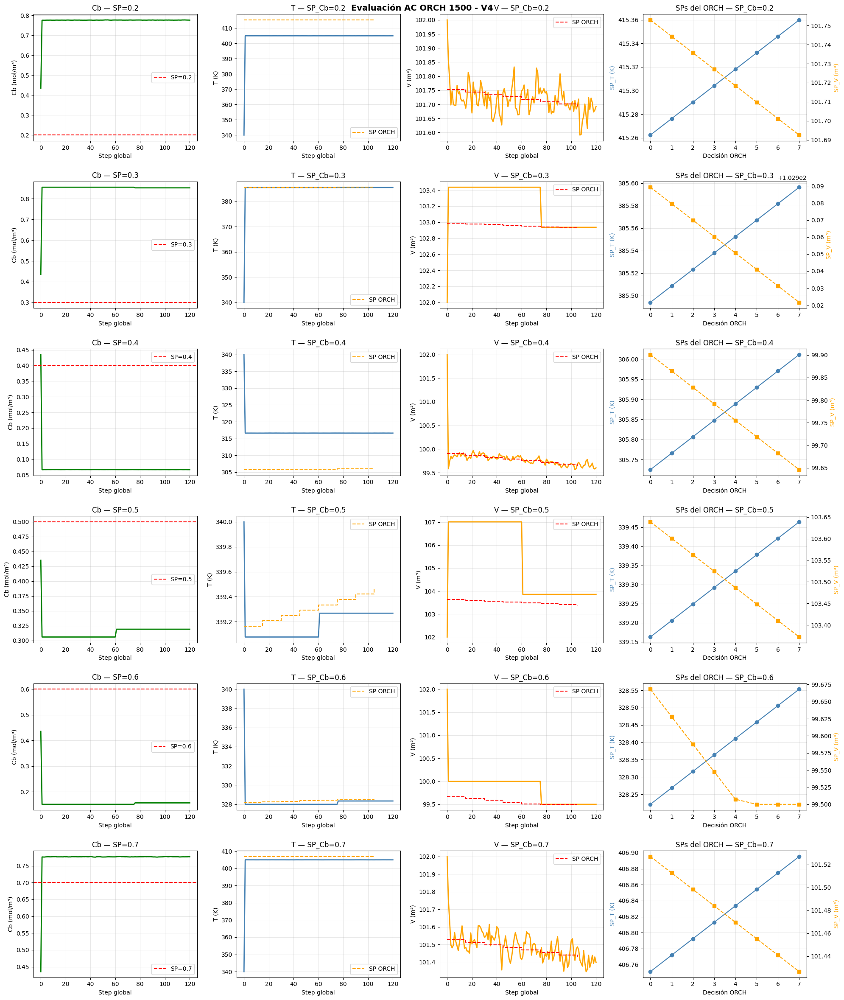

In [ ]:
# ============ GRILLA DE Cb Y GRAFICOS ============
Cb_setpoints = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7]

fig, axes = plt.subplots(len(Cb_setpoints), 4, figsize=(20, 4 * len(Cb_setpoints)))

for i, cb_sp in enumerate(Cb_setpoints):
    cb_traj, T_traj, V_traj, SP_T, SP_V = evaluar_cb(trainer_eval, cb_sp)
    steps = np.arange(len(cb_traj))

    # Cb
    axes[i, 0].plot(steps, cb_traj, color='green', linewidth=2)
    axes[i, 0].axhline(cb_sp, color='red', linestyle='--', linewidth=1.5, label=f'SP={cb_sp}')
    axes[i, 0].set_title(f'Cb — SP={cb_sp}')
    axes[i, 0].set_ylabel('Cb (mol/m³)')
    axes[i, 0].legend(); axes[i, 0].grid(True, alpha=0.3)

    # T con los SPs que pidió el ORCH marcados
    axes[i, 1].plot(steps, T_traj, color='steelblue', linewidth=2)
    if SP_T:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_T))]
        axes[i, 1].step(sp_steps, SP_T, color='orange', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 1].legend()
    axes[i, 1].set_title(f'T — SP_Cb={cb_sp}')
    axes[i, 1].set_ylabel('T (K)'); axes[i, 1].grid(True, alpha=0.3)

    # V con los SPs que pidió el ORCH marcados
    axes[i, 2].plot(steps, V_traj, color='orange', linewidth=2)
    if SP_V:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_V))]
        axes[i, 2].step(sp_steps, SP_V, color='red', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 2].legend()
    axes[i, 2].set_title(f'V — SP_Cb={cb_sp}')
    axes[i, 2].set_ylabel('V (m³)'); axes[i, 2].grid(True, alpha=0.3)

    # SPs del ORCH a lo largo del episodio
    if SP_T and SP_V:
        dec_idx = np.arange(len(SP_T))
        axes[i, 3].plot(dec_idx, SP_T, 'o-', color='steelblue', label='SP_T')
        ax2 = axes[i, 3].twinx()
        ax2.plot(dec_idx, SP_V, 's--', color='orange', label='SP_V')
        axes[i, 3].set_title(f'SPs del ORCH — SP_Cb={cb_sp}')
        axes[i, 3].set_xlabel('Decisión ORCH')
        axes[i, 3].set_ylabel('SP_T (K)', color='steelblue')
        ax2.set_ylabel('SP_V (m³)', color='orange')
        axes[i, 3].grid(True, alpha=0.3)

    for ax in axes[i, :3]:
        ax.set_xlabel('Step global')

plt.suptitle('Evaluación AC ORCH 1500 - V4', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('eval_ac_orch__1500_prueba_4', dpi=150, bbox_inches='tight')
plt.show()

## Prueba 5 (corrida en otra notebook con GPU)

In [ ]:
api = wandb.Api()
artifact = api.artifact('ve326684-universidad-ort-uruguay/Tesis_AC_ORCH_15K_Prueba/model_ac_orch_15k_run-prueba_5:latest')
artifact_dir = artifact.download()

DEVICE             = 'cuda' if torch.cuda.is_available() else 'cpu'
MANIPULABLE_RANGES = [(300, 420), (99.5, 104)]
ORCH_FREQ          = 15
N_DEC_ORCH         = 8
MAX_STEPS          = ORCH_FREQ * N_DEC_ORCH   # 120

eval_config = {
    'env_config': {
        'architecture'             : 'jerarquica',
        'env_type'                 : 'simulation',
        'n_manipulable_vars'       : 2,
        'manipulable_ranges'       : MANIPULABLE_RANGES,
        'n_target_vars'            : 1,
        'target_ranges'            : [(0.0, 1.0)],
        'target_setpoints'         : [0.4],
        'target_working_ranges'    : [(0.0, 2.0)],
        'dt_usuario'               : 1.0,
        'max_steps'                : MAX_STEPS,
        'orch_freq'                : ORCH_FREQ,
        'max_time_detector'        : 120,
        'reward_dead_band'         : 0.02,
        'delta_percent_ctrl'       : 0.05,
        'delta_percent_orch'       : 0.05,
        'reward_weights'           : {'error': 1.0, 'tiempo': 0.001, 'overshoot': 0.3, 'energy': 0.001},
        'pid_limits'               : [(0.01, 5.0), (0.001, 1.0), (0.0, 1.0)],
        'agent_orchestrator_config': {'agent_type': 'continuous'},
        'env_type_config'          : {'dt': 1.0, 'control_limits': (MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1])},
        'stability_config'         : {
            'error_increase_tolerance': 2.0,
            'max_sign_changes_ratio'  : 0.2,
            'max_abrupt_change_ratio' : 0.05,
            'abrupt_change_threshold' : 0.5,
        },
    },
    'ctrl_checkpoint_path': f'{artifact_dir}/agent_ctrl_best.pt',
    'agent_ctrl_config': {
        'algorithm'  : 'ac',
        'state_dim'  : 10,
        'action_dim' : 6,
        'n_vars'     : 2,
        'action_type': 'continuous',
        'hidden_dims': (256, 128, 64),
        'device'     : DEVICE,
    },
    'agent_orch_config': {
        'algorithm'    : 'ac',
        'state_dim'    : 5,
        'action_dim'   : 3,
        'n_vars'       : 2,
        'action_type'  : 'continuous',
        'hidden_dims'  : (64, 32),
        'lr_actor'     : 1e-05,
        'lr_critic'    : 1e-03,
        'gamma'        : 0.5,
        'entropy_coef' : 0.05,
        'batch_size'   : 64,
        'buffer_size'  : 10000,
        'warmup_steps' : 200,
        'device'       : DEVICE,
        'seed'         : 42,
    },
    'n_episodes'                  : 1,
    'max_steps_per_episode'       : MAX_STEPS,
    'eval_frequency'              : 9999,
    'log_frequency'               : 1,
    'save_frequency'              : 9999,
    'checkpoint_dir'              : 'checkpoints/eval_tmp',
    'early_stopping_patience'     : 9999,
    'early_stopping_min_delta_pct': 0.01,
    'use_wandb'                   : False,
}

cstr = CSTRSimulator(dt=1.0, control_limits=(MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1]))
trainer_eval = ACTrainer(eval_config)
trainer_eval.env.proceso.connect_external_process(cstr)
trainer_eval.agent_orch.load(f'{artifact_dir}/agent_orch_best.pt')
print('Agentes cargados')
print(f'orch_freq={ORCH_FREQ} | max_steps={MAX_STEPS} | decisiones ORCH/ep={N_DEC_ORCH}')

wandb:   2 of 2 files downloaded.  


Cargando agente CTRL pre-entrenado desde: /content/artifacts/model_ac_orch_15k_run-prueba_5:v4/agent_ctrl_best.pt
AC Estocástico creado | role=ctrl | state=10 | action=6 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-prueba_5:v4/agent_ctrl_best.pt
AC Estocástico creado | role=orch | state=5 | action=3 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-prueba_5:v4/agent_orch_best.pt
Agentes cargados
orch_freq=15 | max_steps=120 | decisiones ORCH/ep=8



SP_Cb=0.2 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=348.2K  SP_V=102.20m³ | Cb=0.4690
  Step  15 | ORCH actúa → SP_T=348.2K  SP_V=102.16m³ | Cb=0.4697
  Step  30 | ORCH actúa → SP_T=348.2K  SP_V=102.13m³ | Cb=0.4697
  Step  45 | ORCH actúa → SP_T=348.2K  SP_V=102.09m³ | Cb=0.4697
  Step  60 | ORCH actúa → SP_T=348.2K  SP_V=102.06m³ | Cb=0.4697
  Step  75 | ORCH actúa → SP_T=348.2K  SP_V=102.02m³ | Cb=0.4697
  Step  90 | ORCH actúa → SP_T=348.2K  SP_V=101.99m³ | Cb=0.4697
  Step 105 | ORCH actúa → SP_T=348.3K  SP_V=101.95m³ | Cb=0.4697
  → Cb_final=0.4697 | Error=0.2697

SP_Cb=0.3 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=377.3K  SP_V=100.58m³ | Cb=0.8307
  Step  15 | ORCH actúa → SP_T=377.3K  SP_V=100.54m³ | Cb=0.8307
  Step  30 | ORCH actúa → SP_T=377.3K  SP_V=100.50m³ | Cb=0.8307
  Step  45 | ORCH actúa → SP_T=377.4K  SP_V=100.46m³ | Cb=0.8307
  Step  60 | ORCH actúa → SP_T=377.4K  SP_V=100.43m³ | Cb=0.8

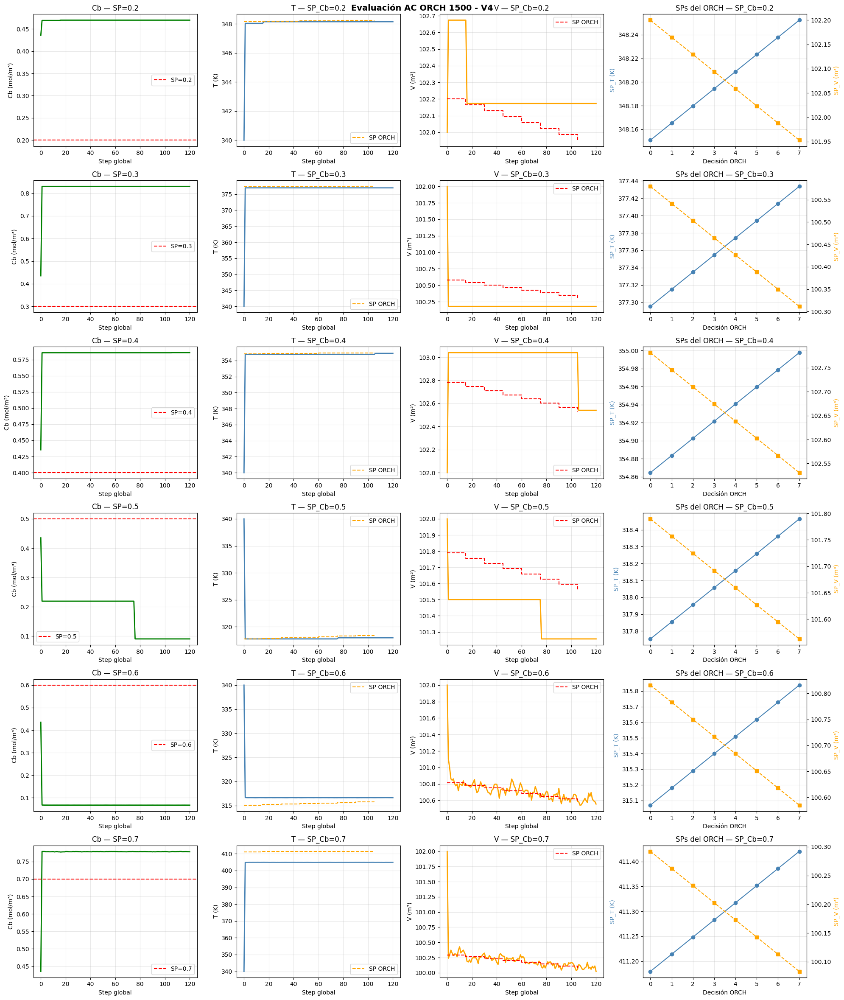

In [ ]:
# ============ GRILLA DE Cb Y GRAFICOS ============
Cb_setpoints = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7]

fig, axes = plt.subplots(len(Cb_setpoints), 4, figsize=(20, 4 * len(Cb_setpoints)))

for i, cb_sp in enumerate(Cb_setpoints):
    cb_traj, T_traj, V_traj, SP_T, SP_V = evaluar_cb(trainer_eval, cb_sp)
    steps = np.arange(len(cb_traj))

    # Cb
    axes[i, 0].plot(steps, cb_traj, color='green', linewidth=2)
    axes[i, 0].axhline(cb_sp, color='red', linestyle='--', linewidth=1.5, label=f'SP={cb_sp}')
    axes[i, 0].set_title(f'Cb — SP={cb_sp}')
    axes[i, 0].set_ylabel('Cb (mol/m³)')
    axes[i, 0].legend(); axes[i, 0].grid(True, alpha=0.3)

    # T con los SPs que pidió el ORCH marcados
    axes[i, 1].plot(steps, T_traj, color='steelblue', linewidth=2)
    if SP_T:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_T))]
        axes[i, 1].step(sp_steps, SP_T, color='orange', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 1].legend()
    axes[i, 1].set_title(f'T — SP_Cb={cb_sp}')
    axes[i, 1].set_ylabel('T (K)'); axes[i, 1].grid(True, alpha=0.3)

    # V con los SPs que pidió el ORCH marcados
    axes[i, 2].plot(steps, V_traj, color='orange', linewidth=2)
    if SP_V:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_V))]
        axes[i, 2].step(sp_steps, SP_V, color='red', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 2].legend()
    axes[i, 2].set_title(f'V — SP_Cb={cb_sp}')
    axes[i, 2].set_ylabel('V (m³)'); axes[i, 2].grid(True, alpha=0.3)

    # SPs del ORCH a lo largo del episodio
    if SP_T and SP_V:
        dec_idx = np.arange(len(SP_T))
        axes[i, 3].plot(dec_idx, SP_T, 'o-', color='steelblue', label='SP_T')
        ax2 = axes[i, 3].twinx()
        ax2.plot(dec_idx, SP_V, 's--', color='orange', label='SP_V')
        axes[i, 3].set_title(f'SPs del ORCH — SP_Cb={cb_sp}')
        axes[i, 3].set_xlabel('Decisión ORCH')
        axes[i, 3].set_ylabel('SP_T (K)', color='steelblue')
        ax2.set_ylabel('SP_V (m³)', color='orange')
        axes[i, 3].grid(True, alpha=0.3)

    for ax in axes[i, :3]:
        ax.set_xlabel('Step global')

plt.suptitle('Evaluación AC ORCH 1500 - V4', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('eval_ac_orch__1500_prueba_4', dpi=150, bbox_inches='tight')
plt.show()

## Preueba 6
Corrida en notebook con GPU

In [ ]:
api = wandb.Api()
artifact = api.artifact('ve326684-universidad-ort-uruguay/Tesis_AC_ORCH_15K_Prueba/model_ac_orch_15k_run-prueba_6:latest')
artifact_dir = artifact.download()

DEVICE             = 'cuda' if torch.cuda.is_available() else 'cpu'
MANIPULABLE_RANGES = [(300, 420), (99.5, 104)]
ORCH_FREQ          = 15
N_DEC_ORCH         = 8
MAX_STEPS          = ORCH_FREQ * N_DEC_ORCH   # 120

eval_config = {
    'env_config': {
        'architecture'             : 'jerarquica',
        'env_type'                 : 'simulation',
        'n_manipulable_vars'       : 2,
        'manipulable_ranges'       : MANIPULABLE_RANGES,
        'n_target_vars'            : 1,
        'target_ranges'            : [(0.0, 1.0)],
        'target_setpoints'         : [0.4],
        'target_working_ranges'    : [(0.0, 2.0)],
        'dt_usuario'               : 1.0,
        'max_steps'                : MAX_STEPS,
        'orch_freq'                : ORCH_FREQ,
        'max_time_detector'        : 120,
        'reward_dead_band'         : 0.02,
        'delta_percent_ctrl'       : 0.05,
        'delta_percent_orch'       : 0.05,
        'reward_weights'           : {'error': 1.0, 'tiempo': 0.001, 'overshoot': 0.3, 'energy': 0.001},
        'pid_limits'               : [(0.01, 5.0), (0.001, 1.0), (0.0, 1.0)],
        'agent_orchestrator_config': {'agent_type': 'continuous'},
        'env_type_config'          : {'dt': 1.0, 'control_limits': (MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1])},
        'stability_config'         : {
            'error_increase_tolerance': 2.0,
            'max_sign_changes_ratio'  : 0.2,
            'max_abrupt_change_ratio' : 0.05,
            'abrupt_change_threshold' : 0.5,
        },
    },
    'ctrl_checkpoint_path': f'{artifact_dir}/agent_ctrl_best.pt',
    'agent_ctrl_config': {
        'algorithm'  : 'ac',
        'state_dim'  : 10,
        'action_dim' : 6,
        'n_vars'     : 2,
        'action_type': 'continuous',
        'hidden_dims': (256, 128, 64),
        'device'     : DEVICE,
    },
    'agent_orch_config': {
        'algorithm'    : 'ac',
        'state_dim'    : 7,
        'action_dim'   : 2,
        'n_vars'       : 2,
        'action_type'  : 'continuous',
        'hidden_dims'  : (64, 32),
        'lr_actor'     : 1e-05,
        'lr_critic'    : 1e-03,
        'gamma'        : 0.9,
        'entropy_coef' : 0.05,
        'batch_size'   : 64,
        'buffer_size'  : 10000,
        'warmup_steps' : 200,
        'device'       : DEVICE,
        'seed'         : 42,
    },
    'n_episodes'                  : 1,
    'max_steps_per_episode'       : MAX_STEPS,
    'eval_frequency'              : 9999,
    'log_frequency'               : 1,
    'save_frequency'              : 9999,
    'checkpoint_dir'              : 'checkpoints/eval_tmp',
    'early_stopping_patience'     : 9999,
    'early_stopping_min_delta_pct': 0.01,
    'use_wandb'                   : False,
}

cstr = CSTRSimulator(dt=1.0, control_limits=(MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1]))
trainer_eval = ACTrainer(eval_config)
trainer_eval.env.proceso.connect_external_process(cstr)
trainer_eval.agent_orch.load(f'{artifact_dir}/agent_orch_best.pt')
print('Agentes cargados')
print(f'orch_freq={ORCH_FREQ} | max_steps={MAX_STEPS} | decisiones ORCH/ep={N_DEC_ORCH}')

wandb:   2 of 2 files downloaded.  


Cargando agente CTRL pre-entrenado desde: /content/artifacts/model_ac_orch_15k_run-prueba_6:v0/agent_ctrl_best.pt
AC Estocástico creado | role=ctrl | state=10 | action=6 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-prueba_6:v0/agent_ctrl_best.pt
AC Estocástico creado | role=orch | state=7 | action=2 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-prueba_6:v0/agent_orch_best.pt
Agentes cargados
orch_freq=15 | max_steps=120 | decisiones ORCH/ep=8



SP_Cb=0.2 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=359.8K  SP_V=102.02m³ | Cb=0.6612
  Step  15 | ORCH actúa → SP_T=359.8K  SP_V=102.03m³ | Cb=0.6612
  Step  30 | ORCH actúa → SP_T=359.8K  SP_V=102.03m³ | Cb=0.6612
  Step  45 | ORCH actúa → SP_T=359.8K  SP_V=102.03m³ | Cb=0.6612
  Step  60 | ORCH actúa → SP_T=359.8K  SP_V=102.03m³ | Cb=0.6612
  Step  75 | ORCH actúa → SP_T=359.8K  SP_V=102.04m³ | Cb=0.6612
  Step  90 | ORCH actúa → SP_T=359.9K  SP_V=102.04m³ | Cb=0.6612
  Step 105 | ORCH actúa → SP_T=359.9K  SP_V=102.04m³ | Cb=0.6612
  → Cb_final=0.6612 | Error=0.4612

SP_Cb=0.3 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=305.3K  SP_V=101.96m³ | Cb=0.0682
  Step  15 | ORCH actúa → SP_T=305.3K  SP_V=101.96m³ | Cb=0.0681
  Step  30 | ORCH actúa → SP_T=305.3K  SP_V=101.96m³ | Cb=0.0682
  Step  45 | ORCH actúa → SP_T=305.3K  SP_V=101.96m³ | Cb=0.0682
  Step  60 | ORCH actúa → SP_T=305.3K  SP_V=101.95m³ | Cb=0.0

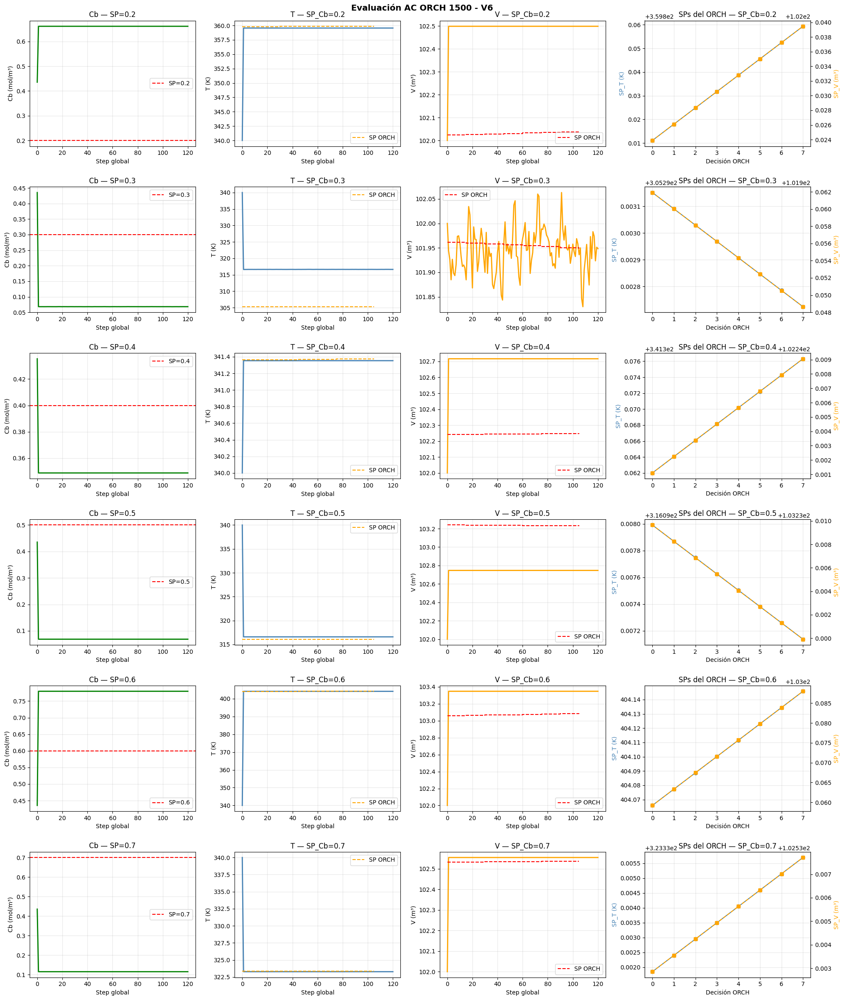

In [ ]:
# ============ GRILLA DE Cb Y GRAFICOS ============
Cb_setpoints = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7]

fig, axes = plt.subplots(len(Cb_setpoints), 4, figsize=(20, 4 * len(Cb_setpoints)))

for i, cb_sp in enumerate(Cb_setpoints):
    cb_traj, T_traj, V_traj, SP_T, SP_V = evaluar_cb(trainer_eval, cb_sp)
    steps = np.arange(len(cb_traj))

    # Cb
    axes[i, 0].plot(steps, cb_traj, color='green', linewidth=2)
    axes[i, 0].axhline(cb_sp, color='red', linestyle='--', linewidth=1.5, label=f'SP={cb_sp}')
    axes[i, 0].set_title(f'Cb — SP={cb_sp}')
    axes[i, 0].set_ylabel('Cb (mol/m³)')
    axes[i, 0].legend(); axes[i, 0].grid(True, alpha=0.3)

    # T con los SPs que pidió el ORCH marcados
    axes[i, 1].plot(steps, T_traj, color='steelblue', linewidth=2)
    if SP_T:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_T))]
        axes[i, 1].step(sp_steps, SP_T, color='orange', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 1].legend()
    axes[i, 1].set_title(f'T — SP_Cb={cb_sp}')
    axes[i, 1].set_ylabel('T (K)'); axes[i, 1].grid(True, alpha=0.3)

    # V con los SPs que pidió el ORCH marcados
    axes[i, 2].plot(steps, V_traj, color='orange', linewidth=2)
    if SP_V:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_V))]
        axes[i, 2].step(sp_steps, SP_V, color='red', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 2].legend()
    axes[i, 2].set_title(f'V — SP_Cb={cb_sp}')
    axes[i, 2].set_ylabel('V (m³)'); axes[i, 2].grid(True, alpha=0.3)

    # SPs del ORCH a lo largo del episodio
    if SP_T and SP_V:
        dec_idx = np.arange(len(SP_T))
        axes[i, 3].plot(dec_idx, SP_T, 'o-', color='steelblue', label='SP_T')
        ax2 = axes[i, 3].twinx()
        ax2.plot(dec_idx, SP_V, 's--', color='orange', label='SP_V')
        axes[i, 3].set_title(f'SPs del ORCH — SP_Cb={cb_sp}')
        axes[i, 3].set_xlabel('Decisión ORCH')
        axes[i, 3].set_ylabel('SP_T (K)', color='steelblue')
        ax2.set_ylabel('SP_V (m³)', color='orange')
        axes[i, 3].grid(True, alpha=0.3)

    for ax in axes[i, :3]:
        ax.set_xlabel('Step global')

plt.suptitle('Evaluación AC ORCH 1500 - V6', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('eval_ac_orch__1500_prueba_6', dpi=150, bbox_inches='tight')
plt.show()

## Prueba 7
Corrida en notebook con gpu

In [ ]:
api = wandb.Api()
artifact = api.artifact('ve326684-universidad-ort-uruguay/Tesis_AC_ORCH_15K_Prueba/model_ac_orch_15k_run-prueba_7:latest')
artifact_dir = artifact.download()

DEVICE             = 'cuda' if torch.cuda.is_available() else 'cpu'
MANIPULABLE_RANGES = [(300, 420), (99.5, 104)]
ORCH_FREQ          = 15
N_DEC_ORCH         = 8
MAX_STEPS          = ORCH_FREQ * N_DEC_ORCH   # 120

eval_config = {
    'env_config': {
        'architecture'             : 'jerarquica',
        'env_type'                 : 'simulation',
        'n_manipulable_vars'       : 2,
        'manipulable_ranges'       : MANIPULABLE_RANGES,
        'n_target_vars'            : 1,
        'target_ranges'            : [(0.0, 1.0)],
        'target_setpoints'         : [0.4],
        'target_working_ranges'    : [(0.0, 2.0)],
        'dt_usuario'               : 1.0,
        'max_steps'                : MAX_STEPS,
        'orch_freq'                : ORCH_FREQ,
        'max_time_detector'        : 120,
        'reward_dead_band'         : 0.02,
        'delta_percent_ctrl'       : 0.05,
        'delta_percent_orch'       : 0.05,
        'reward_weights'           : {'error': 1.0, 'tiempo': 0.001, 'overshoot': 0.3, 'energy': 0.001},
        'pid_limits'               : [(0.01, 5.0), (0.001, 1.0), (0.0, 1.0)],
        'agent_orchestrator_config': {'agent_type': 'continuous'},
        'env_type_config'          : {'dt': 1.0, 'control_limits': (MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1])},
        'stability_config'         : {
            'error_increase_tolerance': 2.0,
            'max_sign_changes_ratio'  : 0.2,
            'max_abrupt_change_ratio' : 0.05,
            'abrupt_change_threshold' : 0.5,
        },
    },
    'ctrl_checkpoint_path': f'{artifact_dir}/agent_ctrl_best.pt',
    'agent_ctrl_config': {
        'algorithm'  : 'ac',
        'state_dim'  : 10,
        'action_dim' : 6,
        'n_vars'     : 2,
        'action_type': 'continuous',
        'hidden_dims': (256, 128, 64),
        'device'     : DEVICE,
    },
    'agent_orch_config': {
        'algorithm'    : 'ac',
        'state_dim'    : 7,
        'action_dim'   : 2,
        'n_vars'       : 2,
        'action_type'  : 'continuous',
        'hidden_dims'  : (64, 32),
        'lr_actor'     : 1e-05,
        'lr_critic'    : 1e-03,
        'gamma'        : 0.9,
        'entropy_coef' : 0.05,
        'batch_size'   : 64,
        'buffer_size'  : 10000,
        'warmup_steps' : 200,
        'device'       : DEVICE,
        'seed'         : 42,
    },
    'n_episodes'                  : 1,
    'max_steps_per_episode'       : MAX_STEPS,
    'eval_frequency'              : 9999,
    'log_frequency'               : 1,
    'save_frequency'              : 9999,
    'checkpoint_dir'              : 'checkpoints/eval_tmp',
    'early_stopping_patience'     : 9999,
    'early_stopping_min_delta_pct': 0.01,
    'use_wandb'                   : False,
}

cstr = CSTRSimulator(dt=1.0, control_limits=(MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1]))
trainer_eval = ACTrainer(eval_config)
trainer_eval.env.proceso.connect_external_process(cstr)
trainer_eval.agent_orch.load(f'{artifact_dir}/agent_orch_best.pt')
print('Agentes cargados')
print(f'orch_freq={ORCH_FREQ} | max_steps={MAX_STEPS} | decisiones ORCH/ep={N_DEC_ORCH}')

wandb:   2 of 2 files downloaded.  


Cargando agente CTRL pre-entrenado desde: /content/artifacts/model_ac_orch_15k_run-prueba_7:v1/agent_ctrl_best.pt
AC Estocástico creado | role=ctrl | state=10 | action=6 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-prueba_7:v1/agent_ctrl_best.pt
AC Estocástico creado | role=orch | state=7 | action=2 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-prueba_7:v1/agent_orch_best.pt
Agentes cargados
orch_freq=15 | max_steps=120 | decisiones ORCH/ep=8



SP_Cb=0.2 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=383.6K  SP_V=103.02m³ | Cb=0.8503
  Step  15 | ORCH actúa → SP_T=383.6K  SP_V=103.02m³ | Cb=0.8503
  Step  30 | ORCH actúa → SP_T=383.6K  SP_V=103.01m³ | Cb=0.8503
  Step  45 | ORCH actúa → SP_T=383.7K  SP_V=103.01m³ | Cb=0.8503
  Step  60 | ORCH actúa → SP_T=383.7K  SP_V=103.00m³ | Cb=0.8503
  Step  75 | ORCH actúa → SP_T=383.8K  SP_V=103.00m³ | Cb=0.8503
  Step  90 | ORCH actúa → SP_T=383.8K  SP_V=103.00m³ | Cb=0.8503
  Step 105 | ORCH actúa → SP_T=383.8K  SP_V=102.99m³ | Cb=0.8503
  → Cb_final=0.8503 | Error=0.6503

SP_Cb=0.3 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=328.6K  SP_V=101.88m³ | Cb=0.1591
  Step  15 | ORCH actúa → SP_T=328.7K  SP_V=101.88m³ | Cb=0.1591
  Step  30 | ORCH actúa → SP_T=328.7K  SP_V=101.88m³ | Cb=0.1591
  Step  45 | ORCH actúa → SP_T=328.7K  SP_V=101.88m³ | Cb=0.1591
  Step  60 | ORCH actúa → SP_T=328.7K  SP_V=101.88m³ | Cb=0.1

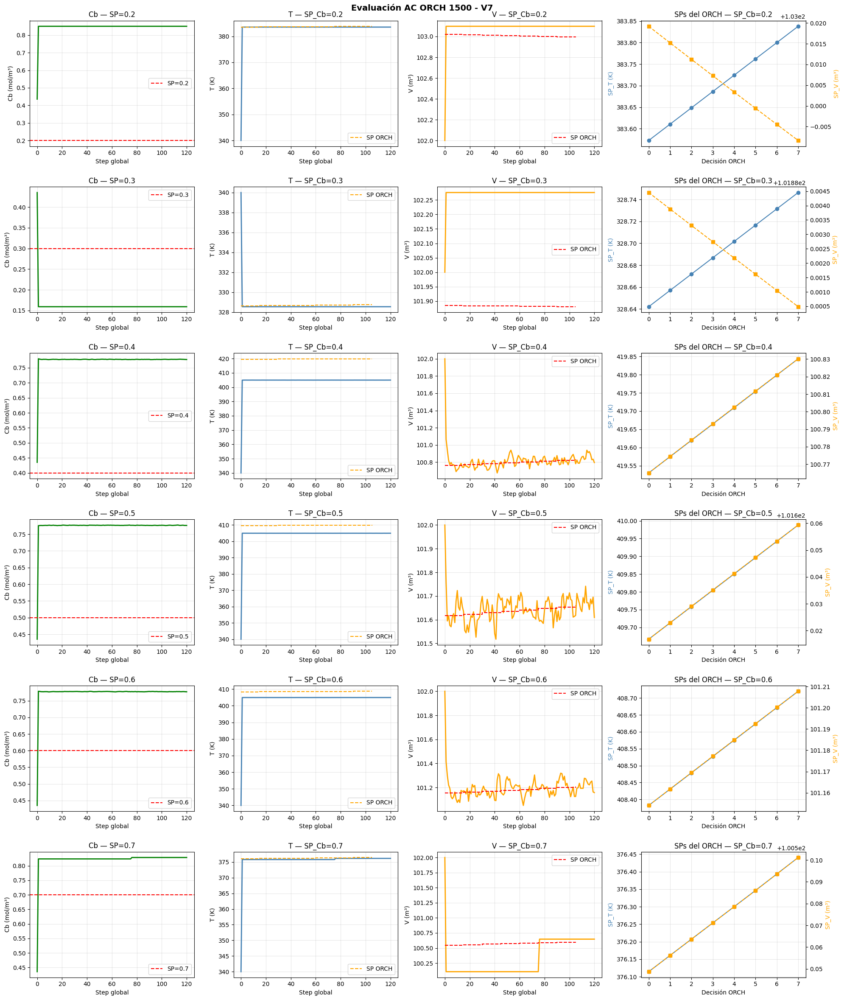

In [ ]:
# ============ GRILLA DE Cb Y GRAFICOS ============
Cb_setpoints = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7]

fig, axes = plt.subplots(len(Cb_setpoints), 4, figsize=(20, 4 * len(Cb_setpoints)))

for i, cb_sp in enumerate(Cb_setpoints):
    cb_traj, T_traj, V_traj, SP_T, SP_V = evaluar_cb(trainer_eval, cb_sp)
    steps = np.arange(len(cb_traj))

    # Cb
    axes[i, 0].plot(steps, cb_traj, color='green', linewidth=2)
    axes[i, 0].axhline(cb_sp, color='red', linestyle='--', linewidth=1.5, label=f'SP={cb_sp}')
    axes[i, 0].set_title(f'Cb — SP={cb_sp}')
    axes[i, 0].set_ylabel('Cb (mol/m³)')
    axes[i, 0].legend(); axes[i, 0].grid(True, alpha=0.3)

    # T con los SPs que pidió el ORCH marcados
    axes[i, 1].plot(steps, T_traj, color='steelblue', linewidth=2)
    if SP_T:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_T))]
        axes[i, 1].step(sp_steps, SP_T, color='orange', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 1].legend()
    axes[i, 1].set_title(f'T — SP_Cb={cb_sp}')
    axes[i, 1].set_ylabel('T (K)'); axes[i, 1].grid(True, alpha=0.3)

    # V con los SPs que pidió el ORCH marcados
    axes[i, 2].plot(steps, V_traj, color='orange', linewidth=2)
    if SP_V:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_V))]
        axes[i, 2].step(sp_steps, SP_V, color='red', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 2].legend()
    axes[i, 2].set_title(f'V — SP_Cb={cb_sp}')
    axes[i, 2].set_ylabel('V (m³)'); axes[i, 2].grid(True, alpha=0.3)

    # SPs del ORCH a lo largo del episodio
    if SP_T and SP_V:
        dec_idx = np.arange(len(SP_T))
        axes[i, 3].plot(dec_idx, SP_T, 'o-', color='steelblue', label='SP_T')
        ax2 = axes[i, 3].twinx()
        ax2.plot(dec_idx, SP_V, 's--', color='orange', label='SP_V')
        axes[i, 3].set_title(f'SPs del ORCH — SP_Cb={cb_sp}')
        axes[i, 3].set_xlabel('Decisión ORCH')
        axes[i, 3].set_ylabel('SP_T (K)', color='steelblue')
        ax2.set_ylabel('SP_V (m³)', color='orange')
        axes[i, 3].grid(True, alpha=0.3)

    for ax in axes[i, :3]:
        ax.set_xlabel('Step global')

plt.suptitle('Evaluación AC ORCH 1500 - V7', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('eval_ac_orch__1500_prueba_7', dpi=150, bbox_inches='tight')
plt.show()

## Diagnostico de exploracion del orch

In [ ]:
# ============ INSTANCIAR TRAINER PARA DIAGNÓSTICO ============
import torch
import random
import numpy as np

SEED = 42
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
DT = 1.0
MANIPULABLE_RANGES = [(300, 420), (99.5, 104)]

AC_CTRL_CHECKPOINT = '/content/artifacts/model_ac_orch_15k_run-prueba_7:v1/agent_ctrl_best.pt'
ORCH_CHECKPOINT    = '/content/artifacts/model_ac_orch_15k_run-prueba_7:v1/agent_orch_best.pt'

trainer_config = {
    'env_config': {
        'architecture'             : 'jerarquica',
        'env_type'                 : 'simulation',
        'n_manipulable_vars'       : 2,
        'manipulable_ranges'       : MANIPULABLE_RANGES,
        'n_target_vars'            : 1,
        'target_ranges'            : [(0.2, 0.7)],
        'target_setpoints'         : [0.4],
        'target_working_ranges'    : [(0.0, 2.0)],
        'dt_usuario'               : DT,
        'max_steps'                : 120,
        'orch_freq'                : 15,
        'max_time_detector'        : 120,
        'reward_dead_band'         : 0.02,
        'delta_percent_ctrl'       : 0.05,
        'delta_percent_orch'       : 0.05,
        'reward_weights'           : {'error': 1.0, 'tiempo': 0.001, 'overshoot': 0.3, 'energy': 0.001},
        'pid_limits'               : [(0.01, 5.0), (0.001, 1.0), (0.0, 1.0)],
        'agent_orchestrator_config': {'agent_type': 'continuous'},
        'env_type_config'          : {'dt': DT, 'control_limits': (MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1])},
        'stability_config'         : {
            'error_increase_tolerance': 2.0,
            'max_sign_changes_ratio'  : 0.2,
            'max_abrupt_change_ratio' : 0.05,
            'abrupt_change_threshold' : 0.5,
        },
    },
    'ctrl_checkpoint_path': AC_CTRL_CHECKPOINT,
    'agent_ctrl_config': {
        'algorithm'  : 'ac',
        'state_dim'  : 10,
        'action_dim' : 6,
        'n_vars'     : 2,
        'action_type': 'continuous',
        'hidden_dims': (256, 128, 64),
        'device'     : DEVICE,
    },
    'agent_orch_config': {
        'algorithm'    : 'ac',
        'state_dim'    : 7,
        'action_dim'   : 2,
        'n_vars'       : 2,
        'action_type'  : 'continuous',
        'hidden_dims'  : (64, 32),
        'lr_actor'     : 1e-5,
        'lr_critic'    : 1e-3,
        'gamma'        : 0.9,
        'entropy_coef' : 0.05,
        'batch_size'   : 64,
        'buffer_size'  : 10000,
        'warmup_steps' : 200,
        'device'       : DEVICE,
        'seed'         : SEED,
    },
    'n_episodes'                  : 1,
    'max_steps_per_episode'       : 120,
    'checkpoint_dir'              : 'checkpoints/diagnostico',
    'use_wandb'                   : False,
}

random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)

trainer = ACTrainer(trainer_config)
cstr = CSTRSimulator(dt=DT, control_limits=(MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1]))
trainer.env.proceso.connect_external_process(cstr)
trainer.agent_orch.load(ORCH_CHECKPOINT)
print("✓ Trainer listo para diagnóstico")

Cargando agente CTRL pre-entrenado desde: /content/artifacts/model_ac_orch_15k_run-prueba_7:v1/agent_ctrl_best.pt
AC Estocástico creado | role=ctrl | state=10 | action=6 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-prueba_7:v1/agent_ctrl_best.pt
AC Estocástico creado | role=orch | state=7 | action=2 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-prueba_7:v1/agent_orch_best.pt
✓ Trainer listo para diagnóstico


In [ ]:
# ============ DIAGNÓSTICO DE EXPLORACIÓN DEL ORCH ============
import numpy as np

print("="*60)
print("DIAGNÓSTICO: ¿El orch está explorando?")
print("="*60)

n_episodios_test = 3

for ep in range(n_episodios_test):
    print(f"\n--- Episodio {ep+1} ---")
    obs, _ = trainer.env.reset()
    state_orch = obs['orch']
    state_ctrl = obs['ctrl']

    actions_log = []

    for step in range(trainer.env.max_steps):
        action_orch = trainer.agent_orch.select_action(state_orch, training=True)
        action_ctrl = trainer.agent_ctrl.select_action(state_ctrl, training=False)

        next_obs, reward, terminated, truncated, info = trainer.env.step(
            {'ctrl': action_ctrl, 'orch': action_orch}
        )

        if info.get('orch_acted', False):
            sp_t = trainer.env.new_SP[0]
            sp_v = trainer.env.new_SP[1]
            cb = trainer.env.target_pvs[0]
            sp_cb = trainer.env.target_setpoints[0]
            print(f"  Step {step:3d} | action=[{action_orch[0]:+.3f}, {action_orch[1]:+.3f}] | "
                  f"SP_T={sp_t:.1f}K  SP_V={sp_v:.2f}m³ | Cb={cb:.4f}  SP_Cb={sp_cb:.2f}")
            actions_log.append(action_orch.copy())

        state_orch = next_obs['orch']
        state_ctrl = next_obs['ctrl']

        if terminated or truncated:
            break

    if actions_log:
        actions_arr = np.array(actions_log)
        print(f"\n  Estadísticas de acciones (T):")
        print(f"    min={actions_arr[:,0].min():.3f}  max={actions_arr[:,0].max():.3f}  "
              f"std={actions_arr[:,0].std():.3f}")
        print(f"  Estadísticas de acciones (V):")
        print(f"    min={actions_arr[:,1].min():.3f}  max={actions_arr[:,1].max():.3f}  "
              f"std={actions_arr[:,1].std():.3f}")

print("\n" + "="*60)
print("Si std ≈ 0 → no explora. Si std > 0.1 → está explorando.")
print("="*60)

DIAGNÓSTICO: ¿El orch está explorando?

--- Episodio 1 ---
  Step   0 | action=[-1.000, +0.837] | SP_T=320.8K  SP_V=103.00m³ | Cb=0.0962  SP_Cb=0.65

  Estadísticas de acciones (T):
    min=-1.000  max=-1.000  std=0.000
  Estadísticas de acciones (V):
    min=0.837  max=0.837  std=0.000

--- Episodio 2 ---
  Step   0 | action=[-0.231, -0.244] | SP_T=309.0K  SP_V=101.34m³ | Cb=0.0681  SP_Cb=0.31

  Estadísticas de acciones (T):
    min=-0.231  max=-0.231  std=0.000
  Estadísticas de acciones (V):
    min=-0.244  max=-0.244  std=0.000

--- Episodio 3 ---
  Step   0 | action=[+0.407, +0.659] | SP_T=363.1K  SP_V=99.77m³ | Cb=0.6948  SP_Cb=0.52
  Step  15 | action=[-0.159, -0.968] | SP_T=362.1K  SP_V=99.55m³ | Cb=0.6882  SP_Cb=0.52
  Step  30 | action=[+0.123, -0.114] | SP_T=362.9K  SP_V=99.52m³ | Cb=0.6922  SP_Cb=0.52
  Step  45 | action=[+1.000, -0.134] | SP_T=368.9K  SP_V=99.50m³ | Cb=0.7574  SP_Cb=0.52

  Estadísticas de acciones (T):
    min=-0.159  max=1.000  std=0.429
  Estadísticas 

## Prueba 8

In [ ]:
api = wandb.Api()
artifact = api.artifact('ve326684-universidad-ort-uruguay/Tesis_AC_ORCH_15K_Prueba/model_ac_orch_15k_run-prueba_8:latest')
artifact_dir = artifact.download()

DEVICE             = 'cuda' if torch.cuda.is_available() else 'cpu'
MANIPULABLE_RANGES = [(300, 420), (99.5, 104)]
ORCH_FREQ          = 15
N_DEC_ORCH         = 8
MAX_STEPS          = ORCH_FREQ * N_DEC_ORCH   # 120

eval_config = {
    'env_config': {
        'architecture'             : 'jerarquica',
        'env_type'                 : 'simulation',
        'n_manipulable_vars'       : 2,
        'manipulable_ranges'       : MANIPULABLE_RANGES,
        'n_target_vars'            : 1,
        'target_ranges'            : [(0.1, 0.9)],
        'target_setpoints'         : [0.4],
        'target_working_ranges'    : [(0.0, 2.0)],
        'dt_usuario'               : 1.0,
        'max_steps'                : MAX_STEPS,
        'orch_freq'                : ORCH_FREQ,
        'max_time_detector'        : 120,
        'reward_dead_band'         : 0.02,
        'delta_percent_ctrl'       : 0.05,
        'delta_percent_orch'       : 0.05,
        'reward_weights'           : {'error': 1.0, 'tiempo': 0.001, 'overshoot': 0.3, 'energy': 0.001},
        'pid_limits'               : [(0.01, 5.0), (0.001, 1.0), (0.0, 1.0)],
        'agent_orchestrator_config': {'agent_type': 'continuous'},
        'env_type_config'          : {'dt': 1.0, 'control_limits': (MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1])},
        'stability_config'         : {
            'error_increase_tolerance': 2.0,
            'max_sign_changes_ratio'  : 0.2,
            'max_abrupt_change_ratio' : 0.05,
            'abrupt_change_threshold' : 0.5,
        },
    },
    'ctrl_checkpoint_path': f'{artifact_dir}/agent_ctrl_best.pt',
    'agent_ctrl_config': {
        'algorithm'  : 'ac',
        'state_dim'  : 10,
        'action_dim' : 6,
        'n_vars'     : 2,
        'action_type': 'continuous',
        'hidden_dims': (256, 128, 64),
        'device'     : DEVICE,
    },
    'agent_orch_config': {
        'algorithm'    : 'ac',
        'state_dim'    : 7,
        'action_dim'   : 2,
        'n_vars'       : 2,
        'action_type'  : 'continuous',
        'hidden_dims'  : (64, 32),
        'lr_actor'     : 1e-05,
        'lr_critic'    : 1e-03,
        'gamma'        : 0.9,
        'entropy_coef' : 0.05,
        'batch_size'   : 64,
        'buffer_size'  : 10000,
        'warmup_steps' : 200,
        'device'       : DEVICE,
        'seed'         : 42,
    },
    'n_episodes'                  : 1,
    'max_steps_per_episode'       : MAX_STEPS,
    'eval_frequency'              : 9999,
    'log_frequency'               : 1,
    'save_frequency'              : 9999,
    'checkpoint_dir'              : 'checkpoints/eval_tmp',
    'early_stopping_patience'     : 9999,
    'early_stopping_min_delta_pct': 0.01,
    'use_wandb'                   : False,
}

cstr = CSTRSimulator(dt=1.0, control_limits=(MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1]))
trainer_eval = ACTrainer(eval_config)
trainer_eval.env.proceso.connect_external_process(cstr)
trainer_eval.agent_orch.load(f'{artifact_dir}/agent_orch_best.pt')
print('Agentes cargados')
print(f'orch_freq={ORCH_FREQ} | max_steps={MAX_STEPS} | decisiones ORCH/ep={N_DEC_ORCH}')

wandb:   2 of 2 files downloaded.  


Cargando agente CTRL pre-entrenado desde: /content/artifacts/model_ac_orch_15k_run-prueba_8:v4/agent_ctrl_best.pt
AC Estocástico creado | role=ctrl | state=10 | action=6 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-prueba_8:v4/agent_ctrl_best.pt
AC Estocástico creado | role=orch | state=7 | action=2 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-prueba_8:v4/agent_orch_best.pt
Agentes cargados
orch_freq=15 | max_steps=120 | decisiones ORCH/ep=8



SP_Cb=0.2 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=409.7K  SP_V=102.49m³ | Cb=0.7739
  Step  15 | ORCH actúa → SP_T=404.3K  SP_V=102.58m³ | Cb=0.7780
  Step  30 | ORCH actúa → SP_T=398.8K  SP_V=102.66m³ | Cb=0.8082
  Step  45 | ORCH actúa → SP_T=393.4K  SP_V=102.75m³ | Cb=0.8327
  Step  60 | ORCH actúa → SP_T=387.9K  SP_V=102.84m³ | Cb=0.8477
  Step  75 | ORCH actúa → SP_T=382.5K  SP_V=102.92m³ | Cb=0.8470
  Step  90 | ORCH actúa → SP_T=377.1K  SP_V=103.00m³ | Cb=0.8287
  Step 105 | ORCH actúa → SP_T=371.8K  SP_V=103.09m³ | Cb=0.7989
  → Cb_final=0.7989 | Error=0.5989

SP_Cb=0.3 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=409.3K  SP_V=102.53m³ | Cb=0.7732
  Step  15 | ORCH actúa → SP_T=403.8K  SP_V=102.62m³ | Cb=0.7794
  Step  30 | ORCH actúa → SP_T=398.3K  SP_V=102.71m³ | Cb=0.8102
  Step  45 | ORCH actúa → SP_T=392.8K  SP_V=102.79m³ | Cb=0.8353
  Step  60 | ORCH actúa → SP_T=387.4K  SP_V=102.88m³ | Cb=0.8

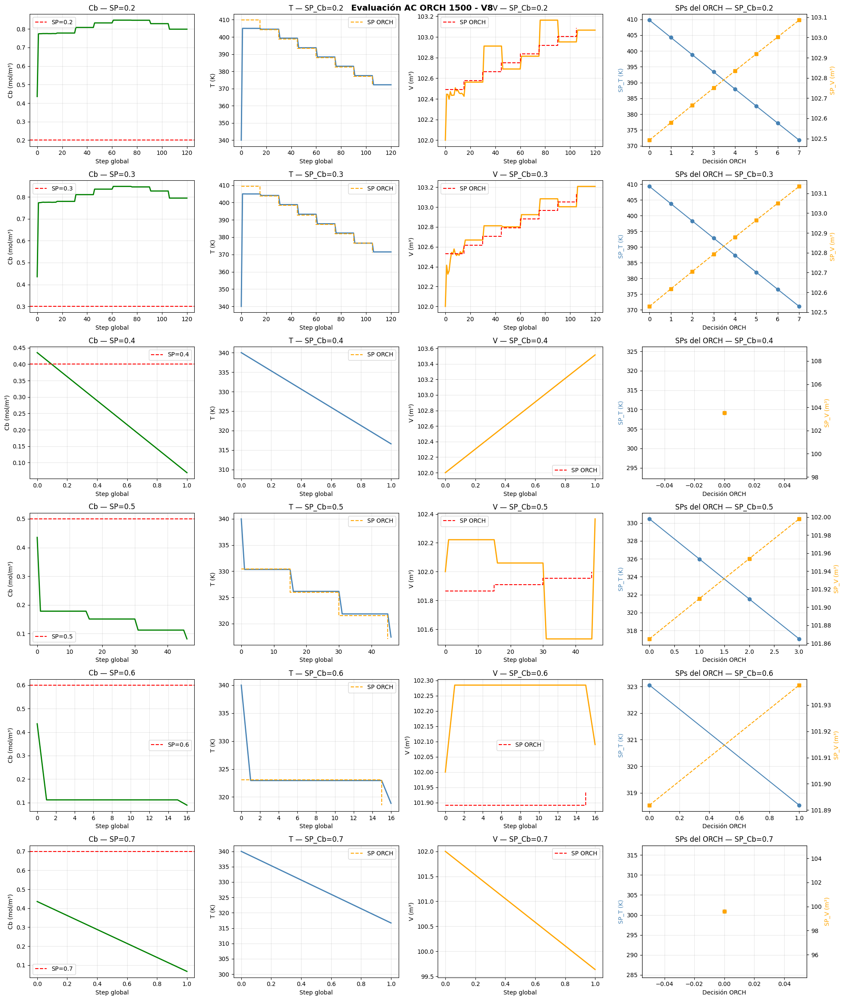

In [ ]:
# ============ GRILLA DE Cb Y GRAFICOS ============
Cb_setpoints = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7]

fig, axes = plt.subplots(len(Cb_setpoints), 4, figsize=(20, 4 * len(Cb_setpoints)))

for i, cb_sp in enumerate(Cb_setpoints):
    cb_traj, T_traj, V_traj, SP_T, SP_V = evaluar_cb(trainer_eval, cb_sp)
    steps = np.arange(len(cb_traj))

    # Cb
    axes[i, 0].plot(steps, cb_traj, color='green', linewidth=2)
    axes[i, 0].axhline(cb_sp, color='red', linestyle='--', linewidth=1.5, label=f'SP={cb_sp}')
    axes[i, 0].set_title(f'Cb — SP={cb_sp}')
    axes[i, 0].set_ylabel('Cb (mol/m³)')
    axes[i, 0].legend(); axes[i, 0].grid(True, alpha=0.3)

    # T con los SPs que pidió el ORCH marcados
    axes[i, 1].plot(steps, T_traj, color='steelblue', linewidth=2)
    if SP_T:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_T))]
        axes[i, 1].step(sp_steps, SP_T, color='orange', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 1].legend()
    axes[i, 1].set_title(f'T — SP_Cb={cb_sp}')
    axes[i, 1].set_ylabel('T (K)'); axes[i, 1].grid(True, alpha=0.3)

    # V con los SPs que pidió el ORCH marcados
    axes[i, 2].plot(steps, V_traj, color='orange', linewidth=2)
    if SP_V:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_V))]
        axes[i, 2].step(sp_steps, SP_V, color='red', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 2].legend()
    axes[i, 2].set_title(f'V — SP_Cb={cb_sp}')
    axes[i, 2].set_ylabel('V (m³)'); axes[i, 2].grid(True, alpha=0.3)

    # SPs del ORCH a lo largo del episodio
    if SP_T and SP_V:
        dec_idx = np.arange(len(SP_T))
        axes[i, 3].plot(dec_idx, SP_T, 'o-', color='steelblue', label='SP_T')
        ax2 = axes[i, 3].twinx()
        ax2.plot(dec_idx, SP_V, 's--', color='orange', label='SP_V')
        axes[i, 3].set_title(f'SPs del ORCH — SP_Cb={cb_sp}')
        axes[i, 3].set_xlabel('Decisión ORCH')
        axes[i, 3].set_ylabel('SP_T (K)', color='steelblue')
        ax2.set_ylabel('SP_V (m³)', color='orange')
        axes[i, 3].grid(True, alpha=0.3)

    for ax in axes[i, :3]:
        ax.set_xlabel('Step global')

plt.suptitle('Evaluación AC ORCH 1500 - V8', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('eval_ac_orch__1500_prueba_8', dpi=150, bbox_inches='tight')
plt.show()

## Prueba de corrida de 15 k

En realidad hizo early stopping en 5000. Corrida en la notebook con gpu

In [ ]:
api = wandb.Api()
artifact = api.artifact('ve326684-universidad-ort-uruguay/Tesis_AC_ORCH_15K_V4/model_ac_orch_15k_run-v4:latest')
artifact_dir = artifact.download()

DEVICE             = 'cuda' if torch.cuda.is_available() else 'cpu'
MANIPULABLE_RANGES = [(300, 420), (99.5, 104)]
ORCH_FREQ          = 15
N_DEC_ORCH         = 8
MAX_STEPS          = ORCH_FREQ * N_DEC_ORCH   # 120

eval_config = {
    'env_config': {
        'architecture'             : 'jerarquica',
        'env_type'                 : 'simulation',
        'n_manipulable_vars'       : 2,
        'manipulable_ranges'       : MANIPULABLE_RANGES,
        'n_target_vars'            : 1,
        'target_ranges'            : [(0.1, 0.9)],
        'target_setpoints'         : [0.4],
        'target_working_ranges'    : [(0.0, 2.0)],
        'dt_usuario'               : 1.0,
        'max_steps'                : MAX_STEPS,
        'orch_freq'                : ORCH_FREQ,
        'max_time_detector'        : 120,
        'reward_dead_band'         : 0.02,
        'delta_percent_ctrl'       : 0.05,
        'delta_percent_orch'       : 0.05,
        'reward_weights'           : {'error': 1.0, 'tiempo': 0.001, 'overshoot': 0.3, 'energy': 0.001},
        'pid_limits'               : [(0.01, 5.0), (0.001, 1.0), (0.0, 1.0)],
        'agent_orchestrator_config': {'agent_type': 'continuous'},
        'env_type_config'          : {'dt': 1.0, 'control_limits': (MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1])},
        'stability_config'         : {
            'error_increase_tolerance': 2.0,
            'max_sign_changes_ratio'  : 0.2,
            'max_abrupt_change_ratio' : 0.05,
            'abrupt_change_threshold' : 0.5,
        },
    },
    'ctrl_checkpoint_path': f'{artifact_dir}/agent_ctrl_best.pt',
    'agent_ctrl_config': {
        'algorithm'  : 'ac',
        'state_dim'  : 10,
        'action_dim' : 6,
        'n_vars'     : 2,
        'action_type': 'continuous',
        'hidden_dims': (256, 128, 64),
        'device'     : DEVICE,
    },
    'agent_orch_config': {
        'algorithm'    : 'ac',
        'state_dim'    : 7,
        'action_dim'   : 2,
        'n_vars'       : 2,
        'action_type'  : 'continuous',
        'hidden_dims'  : (64, 32),
        'lr_actor'     : 1e-05,
        'lr_critic'    : 1e-03,
        'gamma'        : 0.9,
        'entropy_coef' : 0.05,
        'batch_size'   : 64,
        'buffer_size'  : 10000,
        'warmup_steps' : 200,
        'device'       : DEVICE,
        'seed'         : 42,
    },
    'n_episodes'                  : 1,
    'max_steps_per_episode'       : MAX_STEPS,
    'eval_frequency'              : 9999,
    'log_frequency'               : 1,
    'save_frequency'              : 9999,
    'checkpoint_dir'              : 'checkpoints/eval_tmp',
    'early_stopping_patience'     : 9999,
    'early_stopping_min_delta_pct': 0.01,
    'use_wandb'                   : False,
}

cstr = CSTRSimulator(dt=1.0, control_limits=(MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1]))
trainer_eval = ACTrainer(eval_config)
trainer_eval.env.proceso.connect_external_process(cstr)
trainer_eval.agent_orch.load(f'{artifact_dir}/agent_orch_best.pt')
print('Agentes cargados')
print(f'orch_freq={ORCH_FREQ} | max_steps={MAX_STEPS} | decisiones ORCH/ep={N_DEC_ORCH}')

wandb:   6 of 6 files downloaded.  


Cargando agente CTRL pre-entrenado desde: /content/artifacts/model_ac_orch_15k_run-v4:v6/agent_ctrl_best.pt
AC Estocástico creado | role=ctrl | state=10 | action=6 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-v4:v6/agent_ctrl_best.pt
AC Estocástico creado | role=orch | state=7 | action=2 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-v4:v6/agent_orch_best.pt
Agentes cargados
orch_freq=15 | max_steps=120 | decisiones ORCH/ep=8



SP_Cb=0.2 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=376.1K  SP_V=100.50m³ | Cb=0.8229
  Step  15 | ORCH actúa → SP_T=371.0K  SP_V=100.57m³ | Cb=0.7874
  Step  30 | ORCH actúa → SP_T=365.9K  SP_V=100.64m³ | Cb=0.7392
  Step  45 | ORCH actúa → SP_T=360.8K  SP_V=100.71m³ | Cb=0.6741
  Step  60 | ORCH actúa → SP_T=355.8K  SP_V=100.78m³ | Cb=0.6047
  Step  75 | ORCH actúa → SP_T=350.8K  SP_V=100.84m³ | Cb=0.5159
  Step  90 | ORCH actúa → SP_T=345.9K  SP_V=100.91m³ | Cb=0.4389
  Step 105 | ORCH actúa → SP_T=341.0K  SP_V=100.97m³ | Cb=0.3422
  → Cb_final=0.3422 | Error=0.1422

SP_Cb=0.3 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=346.5K  SP_V=102.88m³ | Cb=0.4433
  Step  15 | ORCH actúa → SP_T=341.3K  SP_V=102.95m³ | Cb=0.3657
  Step  30 | ORCH actúa → SP_T=336.6K  SP_V=103.02m³ | Cb=0.2929
  Step  45 | ORCH actúa → SP_T=332.2K  SP_V=103.07m³ | Cb=0.2294
  Step  60 | ORCH actúa → SP_T=327.8K  SP_V=103.12m³ | Cb=0.1

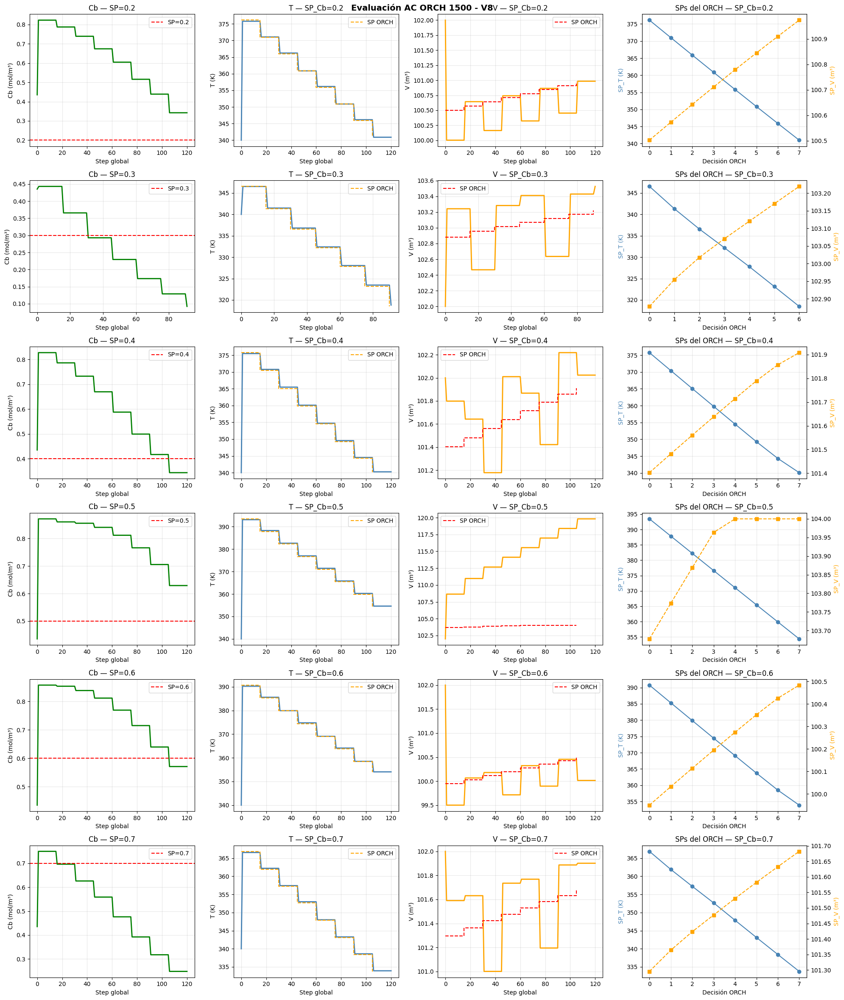

In [ ]:
# ============ GRILLA DE Cb Y GRAFICOS ============
Cb_setpoints = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7]

fig, axes = plt.subplots(len(Cb_setpoints), 4, figsize=(20, 4 * len(Cb_setpoints)))

for i, cb_sp in enumerate(Cb_setpoints):
    cb_traj, T_traj, V_traj, SP_T, SP_V = evaluar_cb(trainer_eval, cb_sp)
    steps = np.arange(len(cb_traj))

    # Cb
    axes[i, 0].plot(steps, cb_traj, color='green', linewidth=2)
    axes[i, 0].axhline(cb_sp, color='red', linestyle='--', linewidth=1.5, label=f'SP={cb_sp}')
    axes[i, 0].set_title(f'Cb — SP={cb_sp}')
    axes[i, 0].set_ylabel('Cb (mol/m³)')
    axes[i, 0].legend(); axes[i, 0].grid(True, alpha=0.3)

    # T con los SPs que pidió el ORCH marcados
    axes[i, 1].plot(steps, T_traj, color='steelblue', linewidth=2)
    if SP_T:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_T))]
        axes[i, 1].step(sp_steps, SP_T, color='orange', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 1].legend()
    axes[i, 1].set_title(f'T — SP_Cb={cb_sp}')
    axes[i, 1].set_ylabel('T (K)'); axes[i, 1].grid(True, alpha=0.3)

    # V con los SPs que pidió el ORCH marcados
    axes[i, 2].plot(steps, V_traj, color='orange', linewidth=2)
    if SP_V:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_V))]
        axes[i, 2].step(sp_steps, SP_V, color='red', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 2].legend()
    axes[i, 2].set_title(f'V — SP_Cb={cb_sp}')
    axes[i, 2].set_ylabel('V (m³)'); axes[i, 2].grid(True, alpha=0.3)

    # SPs del ORCH a lo largo del episodio
    if SP_T and SP_V:
        dec_idx = np.arange(len(SP_T))
        axes[i, 3].plot(dec_idx, SP_T, 'o-', color='steelblue', label='SP_T')
        ax2 = axes[i, 3].twinx()
        ax2.plot(dec_idx, SP_V, 's--', color='orange', label='SP_V')
        axes[i, 3].set_title(f'SPs del ORCH — SP_Cb={cb_sp}')
        axes[i, 3].set_xlabel('Decisión ORCH')
        axes[i, 3].set_ylabel('SP_T (K)', color='steelblue')
        ax2.set_ylabel('SP_V (m³)', color='orange')
        axes[i, 3].grid(True, alpha=0.3)

    for ax in axes[i, :3]:
        ax.set_xlabel('Step global')

plt.suptitle('Evaluación AC ORCH 1500 - V8', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('eval_ac_orch__1500_prueba_8', dpi=150, bbox_inches='tight')
plt.show()

## Corrida de 15 k reales

In [ ]:
api = wandb.Api()
artifact = api.artifact('ve326684-universidad-ort-uruguay/Tesis_AC_ORCH_15K_V5/model_ac_orch_15k_run-v5:latest')
artifact_dir = artifact.download()

DEVICE             = 'cuda' if torch.cuda.is_available() else 'cpu'
MANIPULABLE_RANGES = [(300, 420), (99.5, 104)]
ORCH_FREQ          = 15
N_DEC_ORCH         = 8
MAX_STEPS          = ORCH_FREQ * N_DEC_ORCH   # 120

eval_config = {
    'env_config': {
        'architecture'             : 'jerarquica',
        'env_type'                 : 'simulation',
        'n_manipulable_vars'       : 2,
        'manipulable_ranges'       : MANIPULABLE_RANGES,
        'n_target_vars'            : 1,
        'target_ranges'            : [(0.1, 0.9)],
        'target_setpoints'         : [0.4],
        'target_working_ranges'    : [(0.0, 2.0)],
        'dt_usuario'               : 1.0,
        'max_steps'                : MAX_STEPS,
        'orch_freq'                : ORCH_FREQ,
        'max_time_detector'        : 120,
        'reward_dead_band'         : 0.02,
        'delta_percent_ctrl'       : 0.05,
        'delta_percent_orch'       : 0.05,
        'reward_weights'           : {'error': 1.0, 'tiempo': 0.001, 'overshoot': 0.3, 'energy': 0.001},
        'pid_limits'               : [(0.01, 5.0), (0.001, 1.0), (0.0, 1.0)],
        'agent_orchestrator_config': {'agent_type': 'continuous'},
        'env_type_config'          : {'dt': 1.0, 'control_limits': (MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1])},
        'stability_config'         : {
            'error_increase_tolerance': 2.0,
            'max_sign_changes_ratio'  : 0.2,
            'max_abrupt_change_ratio' : 0.05,
            'abrupt_change_threshold' : 0.5,
        },
    },
    'ctrl_checkpoint_path': f'{artifact_dir}/agent_ctrl_best.pt',
    'agent_ctrl_config': {
        'algorithm'  : 'ac',
        'state_dim'  : 10,
        'action_dim' : 6,
        'n_vars'     : 2,
        'action_type': 'continuous',
        'hidden_dims': (256, 128, 64),
        'device'     : DEVICE,
    },
    'agent_orch_config': {
        'algorithm'    : 'ac',
        'state_dim'    : 7,
        'action_dim'   : 2,
        'n_vars'       : 2,
        'action_type'  : 'continuous',
        'hidden_dims'  : (64, 32),
        'lr_actor'     : 1e-05,
        'lr_critic'    : 1e-03,
        'gamma'        : 0.9,
        'entropy_coef' : 0.05,
        'batch_size'   : 64,
        'buffer_size'  : 10000,
        'warmup_steps' : 200,
        'device'       : DEVICE,
        'seed'         : 42,
    },
    'n_episodes'                  : 1,
    'max_steps_per_episode'       : MAX_STEPS,
    'eval_frequency'              : 9999,
    'log_frequency'               : 1,
    'save_frequency'              : 9999,
    'checkpoint_dir'              : 'checkpoints/eval_tmp',
    'early_stopping_patience'     : 9999,
    'early_stopping_min_delta_pct': 0.01,
    'use_wandb'                   : False,
}

cstr = CSTRSimulator(dt=1.0, control_limits=(MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1]))
trainer_eval = ACTrainer(eval_config)
trainer_eval.env.proceso.connect_external_process(cstr)
trainer_eval.agent_orch.load(f'{artifact_dir}/agent_orch_best.pt')
print('Agentes cargados')
print(f'orch_freq={ORCH_FREQ} | max_steps={MAX_STEPS} | decisiones ORCH/ep={N_DEC_ORCH}')

wandb:   16 of 16 files downloaded.  


Cargando agente CTRL pre-entrenado desde: /content/artifacts/model_ac_orch_15k_run-v5:v14/agent_ctrl_best.pt
AC Estocástico creado | role=ctrl | state=10 | action=6 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-v5:v14/agent_ctrl_best.pt
AC Estocástico creado | role=orch | state=7 | action=2 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-v5:v14/agent_orch_best.pt
Agentes cargados
orch_freq=15 | max_steps=120 | decisiones ORCH/ep=8



SP_Cb=0.2 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=300.1K  SP_V=99.50m³ | Cb=0.0285
  → Cb_final=0.0285 | Error=0.1715

SP_Cb=0.3 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=403.4K  SP_V=99.85m³ | Cb=0.8063
  Step  15 | ORCH actúa → SP_T=397.4K  SP_V=99.62m³ | Cb=0.8182
  Step  30 | ORCH actúa → SP_T=391.4K  SP_V=99.50m³ | Cb=0.8391
  Step  45 | ORCH actúa → SP_T=385.4K  SP_V=99.50m³ | Cb=0.8485
  Step  60 | ORCH actúa → SP_T=379.4K  SP_V=99.50m³ | Cb=0.8337
  Step  75 | ORCH actúa → SP_T=373.4K  SP_V=99.50m³ | Cb=0.8005
  Step  90 | ORCH actúa → SP_T=367.4K  SP_V=99.50m³ | Cb=0.7475
  Step 105 | ORCH actúa → SP_T=361.4K  SP_V=99.50m³ | Cb=0.6755
  → Cb_final=0.6755 | Error=0.3755

SP_Cb=0.4 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=412.3K  SP_V=100.56m³ | Cb=0.7801
  Step  15 | ORCH actúa → SP_T=406.3K  SP_V=100.34m³ | Cb=0.7787
  Step  30 | ORCH actúa → SP_T=400.3K 

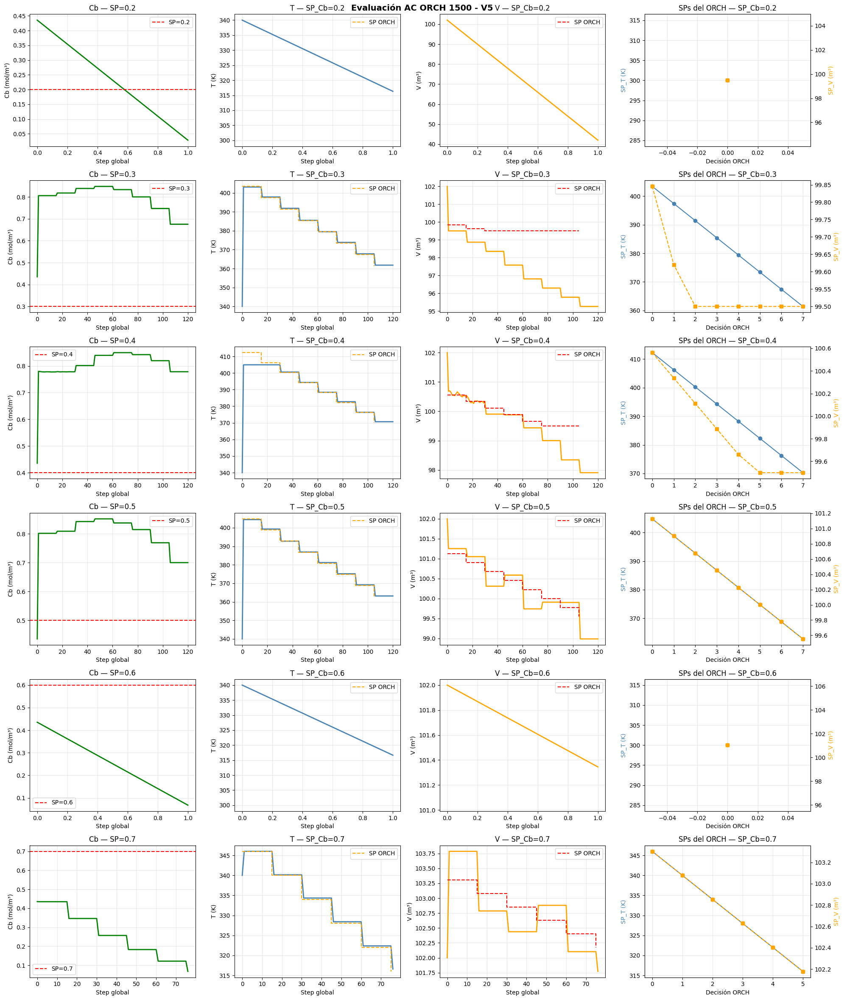

In [ ]:
# ============ GRILLA DE Cb Y GRAFICOS ============
Cb_setpoints = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7]

fig, axes = plt.subplots(len(Cb_setpoints), 4, figsize=(20, 4 * len(Cb_setpoints)))

for i, cb_sp in enumerate(Cb_setpoints):
    cb_traj, T_traj, V_traj, SP_T, SP_V = evaluar_cb(trainer_eval, cb_sp)
    steps = np.arange(len(cb_traj))

    # Cb
    axes[i, 0].plot(steps, cb_traj, color='green', linewidth=2)
    axes[i, 0].axhline(cb_sp, color='red', linestyle='--', linewidth=1.5, label=f'SP={cb_sp}')
    axes[i, 0].set_title(f'Cb — SP={cb_sp}')
    axes[i, 0].set_ylabel('Cb (mol/m³)')
    axes[i, 0].legend(); axes[i, 0].grid(True, alpha=0.3)

    # T con los SPs que pidió el ORCH marcados
    axes[i, 1].plot(steps, T_traj, color='steelblue', linewidth=2)
    if SP_T:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_T))]
        axes[i, 1].step(sp_steps, SP_T, color='orange', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 1].legend()
    axes[i, 1].set_title(f'T — SP_Cb={cb_sp}')
    axes[i, 1].set_ylabel('T (K)'); axes[i, 1].grid(True, alpha=0.3)

    # V con los SPs que pidió el ORCH marcados
    axes[i, 2].plot(steps, V_traj, color='orange', linewidth=2)
    if SP_V:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_V))]
        axes[i, 2].step(sp_steps, SP_V, color='red', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 2].legend()
    axes[i, 2].set_title(f'V — SP_Cb={cb_sp}')
    axes[i, 2].set_ylabel('V (m³)'); axes[i, 2].grid(True, alpha=0.3)

    # SPs del ORCH a lo largo del episodio
    if SP_T and SP_V:
        dec_idx = np.arange(len(SP_T))
        axes[i, 3].plot(dec_idx, SP_T, 'o-', color='steelblue', label='SP_T')
        ax2 = axes[i, 3].twinx()
        ax2.plot(dec_idx, SP_V, 's--', color='orange', label='SP_V')
        axes[i, 3].set_title(f'SPs del ORCH — SP_Cb={cb_sp}')
        axes[i, 3].set_xlabel('Decisión ORCH')
        axes[i, 3].set_ylabel('SP_T (K)', color='steelblue')
        ax2.set_ylabel('SP_V (m³)', color='orange')
        axes[i, 3].grid(True, alpha=0.3)

    for ax in axes[i, :3]:
        ax.set_xlabel('Step global')

plt.suptitle('Evaluación AC ORCH 1500 - V5', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('eval_ac_orch__15000_V5', dpi=150, bbox_inches='tight')
plt.show()

## Corrida con 0,15 entropy

In [ ]:
api = wandb.Api()
artifact = api.artifact('ve326684-universidad-ort-uruguay/Tesis_AC_ORCH_15K_V6/model_ac_orch_15k_run-v6:latest')
artifact_dir = artifact.download()

DEVICE             = 'cuda' if torch.cuda.is_available() else 'cpu'
MANIPULABLE_RANGES = [(300, 420), (99.5, 104)]
ORCH_FREQ          = 15
N_DEC_ORCH         = 8
MAX_STEPS          = ORCH_FREQ * N_DEC_ORCH   # 120

eval_config = {
    'env_config': {
        'architecture'             : 'jerarquica',
        'env_type'                 : 'simulation',
        'n_manipulable_vars'       : 2,
        'manipulable_ranges'       : MANIPULABLE_RANGES,
        'n_target_vars'            : 1,
        'target_ranges'            : [(0.1, 0.9)],
        'target_setpoints'         : [0.4],
        'target_working_ranges'    : [(0.0, 2.0)],
        'dt_usuario'               : 1.0,
        'max_steps'                : MAX_STEPS,
        'orch_freq'                : ORCH_FREQ,
        'max_time_detector'        : 120,
        'reward_dead_band'         : 0.02,
        'delta_percent_ctrl'       : 0.05,
        'delta_percent_orch'       : 0.05,
        'reward_weights'           : {'error': 1.0, 'tiempo': 0.001, 'overshoot': 0.3, 'energy': 0.001},
        'pid_limits'               : [(0.01, 5.0), (0.001, 1.0), (0.0, 1.0)],
        'agent_orchestrator_config': {'agent_type': 'continuous'},
        'env_type_config'          : {'dt': 1.0, 'control_limits': (MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1])},
        'stability_config'         : {
            'error_increase_tolerance': 2.0,
            'max_sign_changes_ratio'  : 0.2,
            'max_abrupt_change_ratio' : 0.05,
            'abrupt_change_threshold' : 0.5,
        },
    },
    'ctrl_checkpoint_path': f'{artifact_dir}/agent_ctrl_best.pt',
    'agent_ctrl_config': {
        'algorithm'  : 'ac',
        'state_dim'  : 10,
        'action_dim' : 6,
        'n_vars'     : 2,
        'action_type': 'continuous',
        'hidden_dims': (256, 128, 64),
        'device'     : DEVICE,
    },
    'agent_orch_config': {
        'algorithm'    : 'ac',
        'state_dim'    : 7,
        'action_dim'   : 2,
        'n_vars'       : 2,
        'action_type'  : 'continuous',
        'hidden_dims'  : (64, 32),
        'lr_actor'     : 1e-05,
        'lr_critic'    : 1e-03,
        'gamma'        : 0.9,
        'entropy_coef' : 0.15,
        'batch_size'   : 64,
        'buffer_size'  : 10000,
        'warmup_steps' : 200,
        'device'       : DEVICE,
        'seed'         : 42,
    },
    'n_episodes'                  : 1,
    'max_steps_per_episode'       : MAX_STEPS,
    'eval_frequency'              : 9999,
    'log_frequency'               : 1,
    'save_frequency'              : 9999,
    'checkpoint_dir'              : 'checkpoints/eval_tmp',
    'early_stopping_patience'     : 9999,
    'early_stopping_min_delta_pct': 0.01,
    'use_wandb'                   : False,
}

cstr = CSTRSimulator(dt=1.0, control_limits=(MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1]))
trainer_eval = ACTrainer(eval_config)
trainer_eval.env.proceso.connect_external_process(cstr)
trainer_eval.agent_orch.load(f'{artifact_dir}/agent_orch_best.pt')
print('Agentes cargados')
print(f'orch_freq={ORCH_FREQ} | max_steps={MAX_STEPS} | decisiones ORCH/ep={N_DEC_ORCH}')

wandb:   2 of 2 files downloaded.  


Cargando agente CTRL pre-entrenado desde: /content/artifacts/model_ac_orch_15k_run-v6:v2/agent_ctrl_best.pt
AC Estocástico creado | role=ctrl | state=10 | action=6 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-v6:v2/agent_ctrl_best.pt
AC Estocástico creado | role=orch | state=7 | action=2 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-v6:v2/agent_orch_best.pt
Agentes cargados
orch_freq=15 | max_steps=120 | decisiones ORCH/ep=8



SP_Cb=0.2 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=318.3K  SP_V=101.36m³ | Cb=0.0905
  → Cb_final=0.0905 | Error=0.1095

SP_Cb=0.3 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=402.6K  SP_V=101.33m³ | Cb=0.8184
  Step  15 | ORCH actúa → SP_T=397.3K  SP_V=101.45m³ | Cb=0.8202
  Step  30 | ORCH actúa → SP_T=392.0K  SP_V=101.57m³ | Cb=0.8380
  Step  45 | ORCH actúa → SP_T=386.8K  SP_V=101.69m³ | Cb=0.8516
  Step  60 | ORCH actúa → SP_T=381.5K  SP_V=101.81m³ | Cb=0.8429
  Step  75 | ORCH actúa → SP_T=376.3K  SP_V=101.93m³ | Cb=0.8262
  Step  90 | ORCH actúa → SP_T=371.1K  SP_V=102.05m³ | Cb=0.7912
  Step 105 | ORCH actúa → SP_T=365.9K  SP_V=102.17m³ | Cb=0.7414
  → Cb_final=0.7414 | Error=0.4414

SP_Cb=0.4 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=369.7K  SP_V=103.27m³ | Cb=0.7773
  Step  15 | ORCH actúa → SP_T=364.4K  SP_V=103.40m³ | Cb=0.7262
  Step  30 | ORCH actúa → SP_

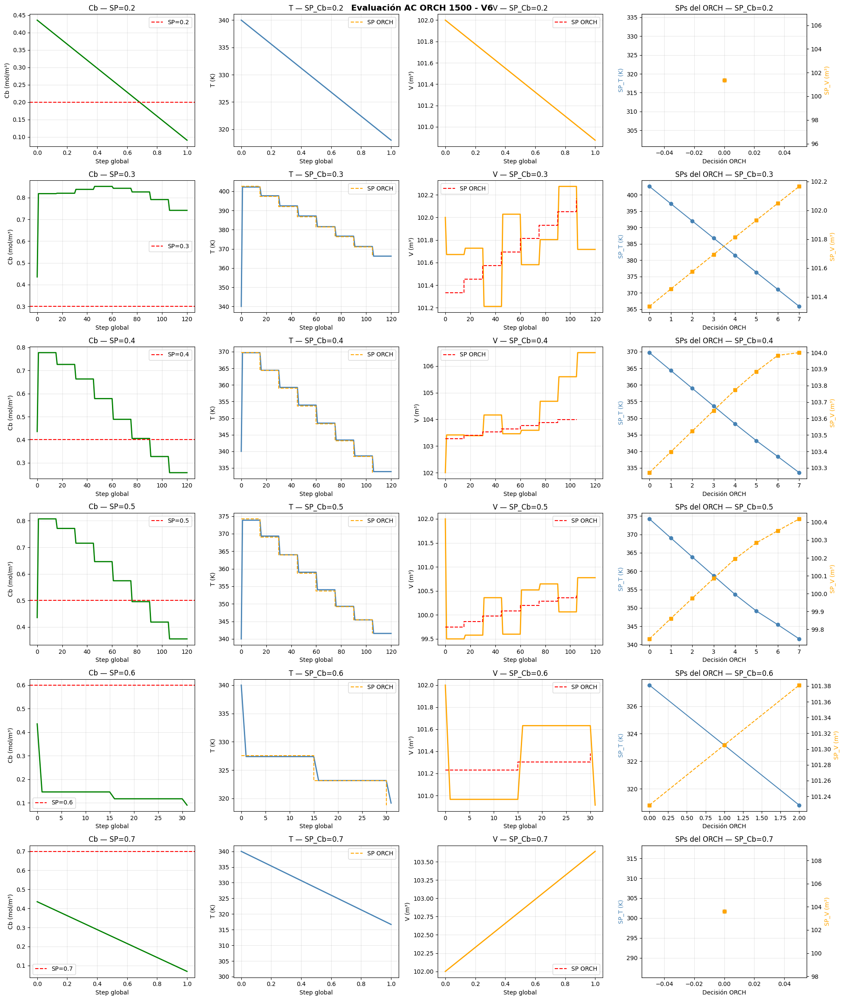

In [ ]:
# ============ GRILLA DE Cb Y GRAFICOS ============
Cb_setpoints = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7]

fig, axes = plt.subplots(len(Cb_setpoints), 4, figsize=(20, 4 * len(Cb_setpoints)))

for i, cb_sp in enumerate(Cb_setpoints):
    cb_traj, T_traj, V_traj, SP_T, SP_V = evaluar_cb(trainer_eval, cb_sp)
    steps = np.arange(len(cb_traj))

    # Cb
    axes[i, 0].plot(steps, cb_traj, color='green', linewidth=2)
    axes[i, 0].axhline(cb_sp, color='red', linestyle='--', linewidth=1.5, label=f'SP={cb_sp}')
    axes[i, 0].set_title(f'Cb — SP={cb_sp}')
    axes[i, 0].set_ylabel('Cb (mol/m³)')
    axes[i, 0].legend(); axes[i, 0].grid(True, alpha=0.3)

    # T con los SPs que pidió el ORCH marcados
    axes[i, 1].plot(steps, T_traj, color='steelblue', linewidth=2)
    if SP_T:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_T))]
        axes[i, 1].step(sp_steps, SP_T, color='orange', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 1].legend()
    axes[i, 1].set_title(f'T — SP_Cb={cb_sp}')
    axes[i, 1].set_ylabel('T (K)'); axes[i, 1].grid(True, alpha=0.3)

    # V con los SPs que pidió el ORCH marcados
    axes[i, 2].plot(steps, V_traj, color='orange', linewidth=2)
    if SP_V:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_V))]
        axes[i, 2].step(sp_steps, SP_V, color='red', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 2].legend()
    axes[i, 2].set_title(f'V — SP_Cb={cb_sp}')
    axes[i, 2].set_ylabel('V (m³)'); axes[i, 2].grid(True, alpha=0.3)

    # SPs del ORCH a lo largo del episodio
    if SP_T and SP_V:
        dec_idx = np.arange(len(SP_T))
        axes[i, 3].plot(dec_idx, SP_T, 'o-', color='steelblue', label='SP_T')
        ax2 = axes[i, 3].twinx()
        ax2.plot(dec_idx, SP_V, 's--', color='orange', label='SP_V')
        axes[i, 3].set_title(f'SPs del ORCH — SP_Cb={cb_sp}')
        axes[i, 3].set_xlabel('Decisión ORCH')
        axes[i, 3].set_ylabel('SP_T (K)', color='steelblue')
        ax2.set_ylabel('SP_V (m³)', color='orange')
        axes[i, 3].grid(True, alpha=0.3)

    for ax in axes[i, :3]:
        ax.set_xlabel('Step global')

plt.suptitle('Evaluación AC ORCH 1500 - V6', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('eval_ac_orch__15000_V6', dpi=150, bbox_inches='tight')
plt.show()

## Con fix en complex y 10000 episodios

In [ ]:
api = wandb.Api()
artifact = api.artifact('ve326684-universidad-ort-uruguay/Tesis_AC_ORCH_15K_V7/model_ac_orch_15k_run-v7:latest')
artifact_dir = artifact.download()

DEVICE             = 'cuda' if torch.cuda.is_available() else 'cpu'
MANIPULABLE_RANGES = [(300, 420), (99.5, 104)]
ORCH_FREQ          = 15
N_DEC_ORCH         = 8
MAX_STEPS          = ORCH_FREQ * N_DEC_ORCH   # 120

eval_config = {
    'env_config': {
        'architecture'             : 'jerarquica',
        'env_type'                 : 'simulation',
        'n_manipulable_vars'       : 2,
        'manipulable_ranges'       : MANIPULABLE_RANGES,
        'n_target_vars'            : 1,
        'target_ranges'            : [(0.1, 0.9)],
        'target_setpoints'         : [0.4],
        'target_working_ranges'    : [(0.0, 2.0)],
        'dt_usuario'               : 1.0,
        'max_steps'                : MAX_STEPS,
        'orch_freq'                : ORCH_FREQ,
        'max_time_detector'        : 120,
        'reward_dead_band'         : 0.02,
        'delta_percent_ctrl'       : 0.05,
        'delta_percent_orch'       : 0.05,
        'reward_weights'           : {'error': 1.0, 'tiempo': 0.001, 'overshoot': 0.3, 'energy': 0.001},
        'pid_limits'               : [(0.01, 5.0), (0.001, 1.0), (0.0, 1.0)],
        'agent_orchestrator_config': {'agent_type': 'continuous'},
        'env_type_config'          : {'dt': 1.0, 'control_limits': (MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1])},
        'stability_config'         : {
            'error_increase_tolerance': 2.0,
            'max_sign_changes_ratio'  : 0.2,
            'max_abrupt_change_ratio' : 0.05,
            'abrupt_change_threshold' : 0.5,
        },
    },
    'ctrl_checkpoint_path': f'{artifact_dir}/agent_ctrl_best.pt',
    'agent_ctrl_config': {
        'algorithm'  : 'ac',
        'state_dim'  : 10,
        'action_dim' : 6,
        'n_vars'     : 2,
        'action_type': 'continuous',
        'hidden_dims': (256, 128, 64),
        'device'     : DEVICE,
    },
    'agent_orch_config': {
        'algorithm'    : 'ac',
        'state_dim'    : 7,
        'action_dim'   : 2,
        'n_vars'       : 2,
        'action_type'  : 'continuous',
        'hidden_dims'  : (64, 32),
        'lr_actor'     : 1e-05,
        'lr_critic'    : 1e-03,
        'gamma'        : 0.9,
        'entropy_coef' : 0.15,
        'batch_size'   : 64,
        'buffer_size'  : 10000,
        'warmup_steps' : 200,
        'device'       : DEVICE,
        'seed'         : 42,
    },
    'n_episodes'                  : 1,
    'max_steps_per_episode'       : MAX_STEPS,
    'eval_frequency'              : 9999,
    'log_frequency'               : 1,
    'save_frequency'              : 9999,
    'checkpoint_dir'              : 'checkpoints/eval_tmp',
    'early_stopping_patience'     : 9999,
    'early_stopping_min_delta_pct': 0.01,
    'use_wandb'                   : False,
}

cstr = CSTRSimulator(dt=1.0, control_limits=(MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1]))
trainer_eval = ACTrainer(eval_config)
trainer_eval.env.proceso.connect_external_process(cstr)
trainer_eval.agent_orch.load(f'{artifact_dir}/agent_orch_best.pt')
print('Agentes cargados')
print(f'orch_freq={ORCH_FREQ} | max_steps={MAX_STEPS} | decisiones ORCH/ep={N_DEC_ORCH}')

wandb:   12 of 12 files downloaded.  


Cargando agente CTRL pre-entrenado desde: /content/artifacts/model_ac_orch_15k_run-v7:v10/agent_ctrl_best.pt
AC Estocástico creado | role=ctrl | state=10 | action=6 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-v7:v10/agent_ctrl_best.pt
AC Estocástico creado | role=orch | state=7 | action=2 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-v7:v10/agent_orch_best.pt
Agentes cargados
orch_freq=15 | max_steps=120 | decisiones ORCH/ep=8



SP_Cb=0.2 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=324.6K  SP_V=102.01m³ | Cb=0.1253
  Step  15 | ORCH actúa → SP_T=318.6K  SP_V=101.82m³ | Cb=0.0920
  → Cb_final=0.0920 | Error=0.1080

SP_Cb=0.3 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=403.1K  SP_V=101.94m³ | Cb=0.8118
  Step  15 | ORCH actúa → SP_T=397.1K  SP_V=101.72m³ | Cb=0.8160
  Step  30 | ORCH actúa → SP_T=391.1K  SP_V=101.50m³ | Cb=0.8496
  Step  45 | ORCH actúa → SP_T=385.1K  SP_V=101.27m³ | Cb=0.8476
  Step  60 | ORCH actúa → SP_T=379.1K  SP_V=101.05m³ | Cb=0.8364
  Step  75 | ORCH actúa → SP_T=373.1K  SP_V=100.83m³ | Cb=0.8049
  Step  90 | ORCH actúa → SP_T=367.1K  SP_V=100.61m³ | Cb=0.7507
  Step 105 | ORCH actúa → SP_T=361.1K  SP_V=100.39m³ | Cb=0.6861
  → Cb_final=0.6861 | Error=0.3861

SP_Cb=0.4 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=312.8K  SP_V=99.56m³ | Cb=0.0653
  → Cb_final=0.0653 | Error=0.

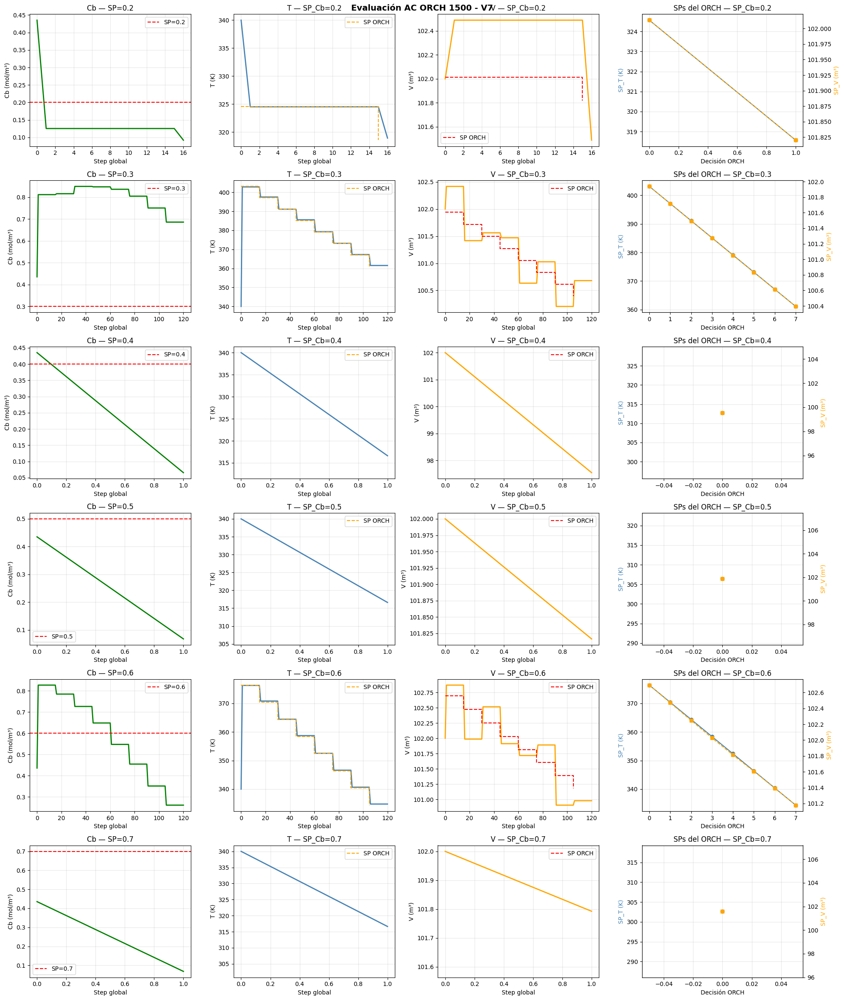

In [ ]:
# ============ GRILLA DE Cb Y GRAFICOS ============
Cb_setpoints = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7]

fig, axes = plt.subplots(len(Cb_setpoints), 4, figsize=(20, 4 * len(Cb_setpoints)))

for i, cb_sp in enumerate(Cb_setpoints):
    cb_traj, T_traj, V_traj, SP_T, SP_V = evaluar_cb(trainer_eval, cb_sp)
    steps = np.arange(len(cb_traj))

    # Cb
    axes[i, 0].plot(steps, cb_traj, color='green', linewidth=2)
    axes[i, 0].axhline(cb_sp, color='red', linestyle='--', linewidth=1.5, label=f'SP={cb_sp}')
    axes[i, 0].set_title(f'Cb — SP={cb_sp}')
    axes[i, 0].set_ylabel('Cb (mol/m³)')
    axes[i, 0].legend(); axes[i, 0].grid(True, alpha=0.3)

    # T con los SPs que pidió el ORCH marcados
    axes[i, 1].plot(steps, T_traj, color='steelblue', linewidth=2)
    if SP_T:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_T))]
        axes[i, 1].step(sp_steps, SP_T, color='orange', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 1].legend()
    axes[i, 1].set_title(f'T — SP_Cb={cb_sp}')
    axes[i, 1].set_ylabel('T (K)'); axes[i, 1].grid(True, alpha=0.3)

    # V con los SPs que pidió el ORCH marcados
    axes[i, 2].plot(steps, V_traj, color='orange', linewidth=2)
    if SP_V:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_V))]
        axes[i, 2].step(sp_steps, SP_V, color='red', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 2].legend()
    axes[i, 2].set_title(f'V — SP_Cb={cb_sp}')
    axes[i, 2].set_ylabel('V (m³)'); axes[i, 2].grid(True, alpha=0.3)

    # SPs del ORCH a lo largo del episodio
    if SP_T and SP_V:
        dec_idx = np.arange(len(SP_T))
        axes[i, 3].plot(dec_idx, SP_T, 'o-', color='steelblue', label='SP_T')
        ax2 = axes[i, 3].twinx()
        ax2.plot(dec_idx, SP_V, 's--', color='orange', label='SP_V')
        axes[i, 3].set_title(f'SPs del ORCH — SP_Cb={cb_sp}')
        axes[i, 3].set_xlabel('Decisión ORCH')
        axes[i, 3].set_ylabel('SP_T (K)', color='steelblue')
        ax2.set_ylabel('SP_V (m³)', color='orange')
        axes[i, 3].grid(True, alpha=0.3)

    for ax in axes[i, :3]:
        ax.set_xlabel('Step global')

plt.suptitle('Evaluación AC ORCH 1500 - V7', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('eval_ac_orch__15000_V7', dpi=150, bbox_inches='tight')
plt.show()

## Prueba con max_steps=200

In [ ]:
api = wandb.Api()
artifact = api.artifact('ve326684-universidad-ort-uruguay/Tesis_AC_ORCH_15K_V8/model_ac_orch_15k_run-v8:latest')
artifact_dir = artifact.download()

DEVICE             = 'cuda' if torch.cuda.is_available() else 'cpu'
MANIPULABLE_RANGES = [(300, 420), (99.5, 104)]
ORCH_FREQ          = 15
N_DEC_ORCH         = 8
MAX_STEPS          = ORCH_FREQ * N_DEC_ORCH   # 120

eval_config = {
    'env_config': {
        'architecture'             : 'jerarquica',
        'env_type'                 : 'simulation',
        'n_manipulable_vars'       : 2,
        'manipulable_ranges'       : MANIPULABLE_RANGES,
        'n_target_vars'            : 1,
        'target_ranges'            : [(0.1, 0.9)],
        'target_setpoints'         : [0.4],
        'target_working_ranges'    : [(0.0, 2.0)],
        'dt_usuario'               : 1.0,
        'max_steps'                : MAX_STEPS,
        'orch_freq'                : ORCH_FREQ,
        'max_time_detector'        : 200,
        'reward_dead_band'         : 0.02,
        'delta_percent_ctrl'       : 0.05,
        'delta_percent_orch'       : 0.05,
        'reward_weights'           : {'error': 1.0, 'tiempo': 0.001, 'overshoot': 0.3, 'energy': 0.001},
        'pid_limits'               : [(0.01, 5.0), (0.001, 1.0), (0.0, 1.0)],
        'agent_orchestrator_config': {'agent_type': 'continuous'},
        'env_type_config'          : {'dt': 1.0, 'control_limits': (MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1])},
        'stability_config'         : {
            'error_increase_tolerance': 2.0,
            'max_sign_changes_ratio'  : 0.2,
            'max_abrupt_change_ratio' : 0.05,
            'abrupt_change_threshold' : 0.5,
        },
    },
    'ctrl_checkpoint_path': f'{artifact_dir}/agent_ctrl_best.pt',
    'agent_ctrl_config': {
        'algorithm'  : 'ac',
        'state_dim'  : 10,
        'action_dim' : 6,
        'n_vars'     : 2,
        'action_type': 'continuous',
        'hidden_dims': (256, 128, 64),
        'device'     : DEVICE,
    },
    'agent_orch_config': {
        'algorithm'    : 'ac',
        'state_dim'    : 7,
        'action_dim'   : 2,
        'n_vars'       : 2,
        'action_type'  : 'continuous',
        'hidden_dims'  : (64, 32),
        'lr_actor'     : 2e-05,
        'lr_critic'    : 1e-03,
        'gamma'        : 0.9,
        'entropy_coef' : 0.15,
        'batch_size'   : 64,
        'buffer_size'  : 10000,
        'warmup_steps' : 200,
        'device'       : DEVICE,
        'seed'         : 42,
    },
    'n_episodes'                  : 1,
    'max_steps_per_episode'       : MAX_STEPS,
    'eval_frequency'              : 9999,
    'log_frequency'               : 1,
    'save_frequency'              : 9999,
    'checkpoint_dir'              : 'checkpoints/eval_tmp',
    'early_stopping_patience'     : 9999,
    'early_stopping_min_delta_pct': 0.01,
    'use_wandb'                   : False,
}

cstr = CSTRSimulator(dt=1.0, control_limits=(MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1]))
trainer_eval = ACTrainer(eval_config)
trainer_eval.env.proceso.connect_external_process(cstr)
trainer_eval.agent_orch.load(f'{artifact_dir}/agent_orch_best.pt')
print('Agentes cargados')
print(f'orch_freq={ORCH_FREQ} | max_steps={MAX_STEPS} | decisiones ORCH/ep={N_DEC_ORCH}')

wandb:   4 of 4 files downloaded.  


Cargando agente CTRL pre-entrenado desde: /content/artifacts/model_ac_orch_15k_run-v8:v4/agent_ctrl_best.pt
AC Estocástico creado | role=ctrl | state=10 | action=6 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-v8:v4/agent_ctrl_best.pt
AC Estocástico creado | role=orch | state=7 | action=2 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-v8:v4/agent_orch_best.pt
Agentes cargados
orch_freq=15 | max_steps=120 | decisiones ORCH/ep=8



SP_Cb=0.2 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=332.6K  SP_V=101.96m³ | Cb=0.2039
  Step  15 | ORCH actúa → SP_T=327.5K  SP_V=101.88m³ | Cb=0.1690
  Step  30 | ORCH actúa → SP_T=322.4K  SP_V=101.80m³ | Cb=0.1211
  Step  45 | ORCH actúa → SP_T=317.1K  SP_V=101.71m³ | Cb=0.0836
  → Cb_final=0.0836 | Error=0.1164

SP_Cb=0.3 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=333.1K  SP_V=100.14m³ | Cb=0.2050
  Step  15 | ORCH actúa → SP_T=327.9K  SP_V=100.05m³ | Cb=0.1701
  Step  30 | ORCH actúa → SP_T=322.4K  SP_V=99.95m³ | Cb=0.1212
  Step  45 | ORCH actúa → SP_T=317.0K  SP_V=99.86m³ | Cb=0.0809
  → Cb_final=0.0809 | Error=0.2191

SP_Cb=0.4 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=321.9K  SP_V=102.41m³ | Cb=0.1084
  Step  15 | ORCH actúa → SP_T=316.2K  SP_V=102.30m³ | Cb=0.0775
  → Cb_final=0.0775 | Error=0.3225

SP_Cb=0.5 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³

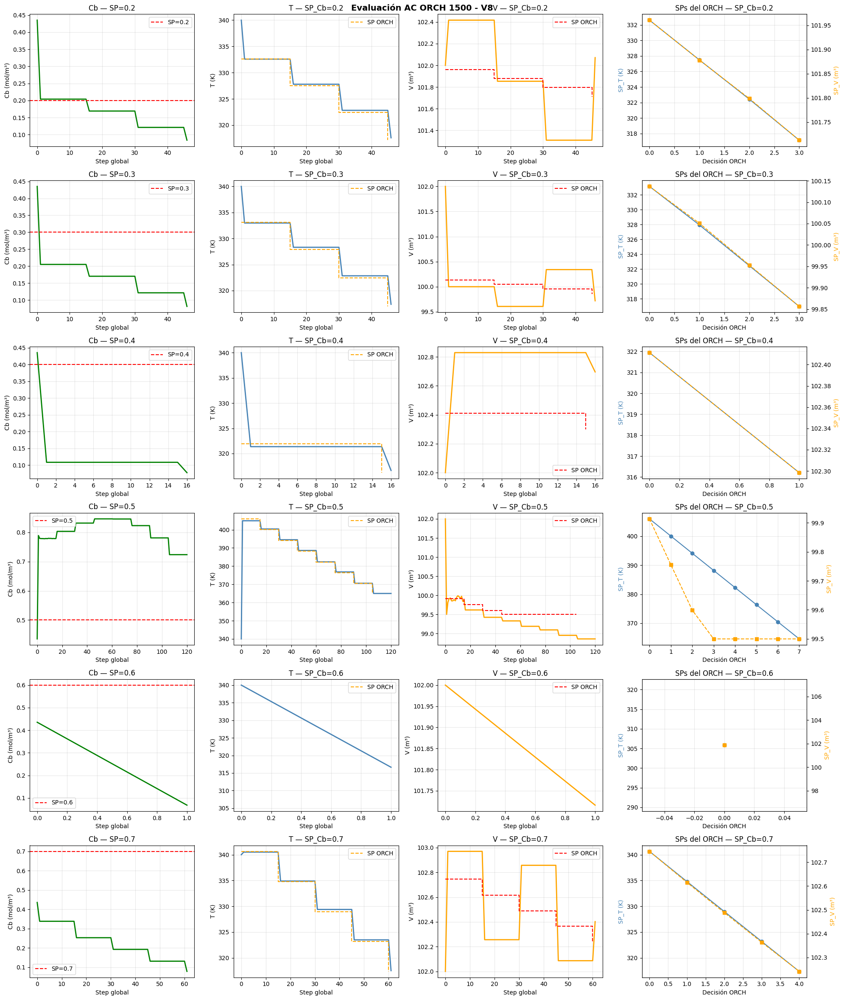

In [ ]:
# ============ GRILLA DE Cb Y GRAFICOS ============
Cb_setpoints = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7]

fig, axes = plt.subplots(len(Cb_setpoints), 4, figsize=(20, 4 * len(Cb_setpoints)))

for i, cb_sp in enumerate(Cb_setpoints):
    cb_traj, T_traj, V_traj, SP_T, SP_V = evaluar_cb(trainer_eval, cb_sp)
    steps = np.arange(len(cb_traj))

    # Cb
    axes[i, 0].plot(steps, cb_traj, color='green', linewidth=2)
    axes[i, 0].axhline(cb_sp, color='red', linestyle='--', linewidth=1.5, label=f'SP={cb_sp}')
    axes[i, 0].set_title(f'Cb — SP={cb_sp}')
    axes[i, 0].set_ylabel('Cb (mol/m³)')
    axes[i, 0].legend(); axes[i, 0].grid(True, alpha=0.3)

    # T con los SPs que pidió el ORCH marcados
    axes[i, 1].plot(steps, T_traj, color='steelblue', linewidth=2)
    if SP_T:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_T))]
        axes[i, 1].step(sp_steps, SP_T, color='orange', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 1].legend()
    axes[i, 1].set_title(f'T — SP_Cb={cb_sp}')
    axes[i, 1].set_ylabel('T (K)'); axes[i, 1].grid(True, alpha=0.3)

    # V con los SPs que pidió el ORCH marcados
    axes[i, 2].plot(steps, V_traj, color='orange', linewidth=2)
    if SP_V:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_V))]
        axes[i, 2].step(sp_steps, SP_V, color='red', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 2].legend()
    axes[i, 2].set_title(f'V — SP_Cb={cb_sp}')
    axes[i, 2].set_ylabel('V (m³)'); axes[i, 2].grid(True, alpha=0.3)

    # SPs del ORCH a lo largo del episodio
    if SP_T and SP_V:
        dec_idx = np.arange(len(SP_T))
        axes[i, 3].plot(dec_idx, SP_T, 'o-', color='steelblue', label='SP_T')
        ax2 = axes[i, 3].twinx()
        ax2.plot(dec_idx, SP_V, 's--', color='orange', label='SP_V')
        axes[i, 3].set_title(f'SPs del ORCH — SP_Cb={cb_sp}')
        axes[i, 3].set_xlabel('Decisión ORCH')
        axes[i, 3].set_ylabel('SP_T (K)', color='steelblue')
        ax2.set_ylabel('SP_V (m³)', color='orange')
        axes[i, 3].grid(True, alpha=0.3)

    for ax in axes[i, :3]:
        ax.set_xlabel('Step global')

plt.suptitle('Evaluación AC ORCH 1500 - V8', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('eval_ac_orch__15000_V8', dpi=150, bbox_inches='tight')
plt.show()

In [ ]:
from Aux.PIDComponents_Reward import RewardCalculator

rc = RewardCalculator(
    weights={'error': 1.0, 'tiempo': 0.001, 'overshoot': 0.3, 'energy': 0.001},
    ranges=[(0.1, 0.9)],
    dead_band=0.02,
    max_time=120.0
)

# Caso fallo — Cb=0.07, SP=0.7
r_fallo = rc.calculate(
    errors=[0.63], tiempos_respuesta=[0.0], overshoots=[0.0],
    energy_step=0.0, pvs=[0.07], setpoints=[0.7],
    terminated=True, truncated=False
)

# Caso cerca — Cb=0.35, SP=0.4
r_cerca = rc.calculate(
    errors=[0.05], tiempos_respuesta=[0.0], overshoots=[0.0],
    energy_step=0.0, pvs=[0.35], setpoints=[0.4],
    terminated=False, truncated=True
)

print(f"Reward fallo (Cb=0.07, SP=0.7): {r_fallo:.4f}")
print(f"Reward cerca (Cb=0.35, SP=0.4): {r_cerca:.4f}")

Reward fallo (Cb=0.07, SP=0.7): -1.1812
Reward cerca (Cb=0.35, SP=0.4): -0.0562


In [ ]:
from Aux.PIDComponents_Reward import RewardCalculator

rc = RewardCalculator(
    weights={'error': 1.0, 'tiempo': 0.001, 'overshoot': 0.3, 'energy': 0.001},
    ranges=[(0.1, 0.9)],
    dead_band=0.02,
    max_time=120.0
)

orch_freq = 15

# Caso fallo — terminated=True, un solo step
r_fallo_raw = rc.calculate(
    errors=[0.63], tiempos_respuesta=[0.0], overshoots=[0.0],
    energy_step=0.0, pvs=[0.07], setpoints=[0.7],
    terminated=True, truncated=False
)
r_fallo_orch_viejo = r_fallo_raw / orch_freq
r_fallo_orch_nuevo = r_fallo_raw  # sin dividir

# Caso cerca — truncated=True, 8 steps
r_cerca_raw = rc.calculate(
    errors=[0.05], tiempos_respuesta=[0.0], overshoots=[0.0],
    energy_step=0.0, pvs=[0.35], setpoints=[0.4],
    terminated=False, truncated=True
)
r_cerca_orch = r_cerca_raw / orch_freq

print(f"Reward fallo — raw: {r_fallo_raw:.4f}")
print(f"Reward fallo — lo que veía el orch (viejo): {r_fallo_orch_viejo:.4f}")
print(f"Reward fallo — lo que verá el orch (nuevo): {r_fallo_orch_nuevo:.4f}")
print(f"Reward cerca — lo que ve el orch: {r_cerca_orch:.4f}")
print(f"\nRatio fallo/cerca (viejo): {abs(r_fallo_orch_viejo/r_cerca_orch):.1f}x")
print(f"Ratio fallo/cerca (nuevo): {abs(r_fallo_orch_nuevo/r_cerca_orch):.1f}x")

Reward fallo — raw: -1.1812
Reward fallo — lo que veía el orch (viejo): -0.0788
Reward fallo — lo que verá el orch (nuevo): -1.1812
Reward cerca — lo que ve el orch: -0.0037

Ratio fallo/cerca (viejo): 21.0x
Ratio fallo/cerca (nuevo): 315.0x


## Con fix en rewar dentro de step()

In [ ]:
api = wandb.Api()
artifact = api.artifact('ve326684-universidad-ort-uruguay/Tesis_AC_ORCH_15K_V9/model_ac_orch_15k_run-v9:latest')
artifact_dir = artifact.download()

DEVICE             = 'cuda' if torch.cuda.is_available() else 'cpu'
MANIPULABLE_RANGES = [(300, 420), (99.5, 104)]
ORCH_FREQ          = 15
N_DEC_ORCH         = 8
MAX_STEPS          = 200

eval_config = {
    'env_config': {
        'architecture'             : 'jerarquica',
        'env_type'                 : 'simulation',
        'n_manipulable_vars'       : 2,
        'manipulable_ranges'       : MANIPULABLE_RANGES,
        'n_target_vars'            : 1,
        'target_ranges'            : [(0.1, 0.9)],
        'target_setpoints'         : [0.4],
        'target_working_ranges'    : [(0.0, 2.0)],
        'dt_usuario'               : 1.0,
        'max_steps'                : MAX_STEPS,
        'orch_freq'                : ORCH_FREQ,
        'max_time_detector'        : 200,
        'reward_dead_band'         : 0.02,
        'delta_percent_ctrl'       : 0.05,
        'delta_percent_orch'       : 0.05,
        'reward_weights'           : {'error': 1.0, 'tiempo': 0.001, 'overshoot': 0.3, 'energy': 0.001},
        'pid_limits'               : [(0.01, 5.0), (0.001, 1.0), (0.0, 1.0)],
        'agent_orchestrator_config': {'agent_type': 'continuous'},
        'env_type_config'          : {'dt': 1.0, 'control_limits': (MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1])},
        'stability_config'         : {
            'error_increase_tolerance': 2.0,
            'max_sign_changes_ratio'  : 0.2,
            'max_abrupt_change_ratio' : 0.05,
            'abrupt_change_threshold' : 0.5,
        },
    },
    'ctrl_checkpoint_path': f'{artifact_dir}/agent_ctrl_best.pt',
    'agent_ctrl_config': {
        'algorithm'  : 'ac',
        'state_dim'  : 10,
        'action_dim' : 6,
        'n_vars'     : 2,
        'action_type': 'continuous',
        'hidden_dims': (256, 128, 64),
        'device'     : DEVICE,
    },
    'agent_orch_config': {
        'algorithm'    : 'ac',
        'state_dim'    : 7,
        'action_dim'   : 2,
        'n_vars'       : 2,
        'action_type'  : 'continuous',
        'hidden_dims'  : (64, 32),
        'lr_actor'     : 2e-05,
        'lr_critic'    : 1e-03,
        'gamma'        : 0.9,
        'entropy_coef' : 0.15,
        'batch_size'   : 64,
        'buffer_size'  : 10000,
        'warmup_steps' : 200,
        'device'       : DEVICE,
        'seed'         : 42,
    },
    'n_episodes'                  : 1,
    'max_steps_per_episode'       : MAX_STEPS,
    'eval_frequency'              : 9999,
    'log_frequency'               : 1,
    'save_frequency'              : 9999,
    'checkpoint_dir'              : 'checkpoints/eval_tmp',
    'early_stopping_patience'     : 9999,
    'early_stopping_min_delta_pct': 0.01,
    'use_wandb'                   : False,
}

cstr = CSTRSimulator(dt=1.0, control_limits=(MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1]))
trainer_eval = ACTrainer(eval_config)
trainer_eval.env.proceso.connect_external_process(cstr)
trainer_eval.agent_orch.load(f'{artifact_dir}/agent_orch_best.pt')
print('Agentes cargados')
print(f'orch_freq={ORCH_FREQ} | max_steps={MAX_STEPS} | decisiones ORCH/ep={N_DEC_ORCH}')

wandb:   4 of 4 files downloaded.  


Cargando agente CTRL pre-entrenado desde: /content/artifacts/model_ac_orch_15k_run-v9:v7/agent_ctrl_best.pt
AC Estocástico creado | role=ctrl | state=10 | action=6 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-v9:v7/agent_ctrl_best.pt
AC Estocástico creado | role=orch | state=7 | action=2 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-v9:v7/agent_orch_best.pt
Agentes cargados
orch_freq=15 | max_steps=200 | decisiones ORCH/ep=8



SP_Cb=0.2 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=398.7K  SP_V=102.24m³ | Cb=0.8374
  Step  15 | ORCH actúa → SP_T=392.7K  SP_V=102.04m³ | Cb=0.8353
  Step  30 | ORCH actúa → SP_T=386.7K  SP_V=101.84m³ | Cb=0.8470
  Step  45 | ORCH actúa → SP_T=380.7K  SP_V=101.65m³ | Cb=0.8425
  Step  60 | ORCH actúa → SP_T=374.7K  SP_V=101.45m³ | Cb=0.8124
  Step  75 | ORCH actúa → SP_T=368.7K  SP_V=101.25m³ | Cb=0.7691
  Step  90 | ORCH actúa → SP_T=362.7K  SP_V=101.06m³ | Cb=0.7008
  Step 105 | ORCH actúa → SP_T=356.7K  SP_V=100.87m³ | Cb=0.6180
  Step 120 | ORCH actúa → SP_T=350.7K  SP_V=100.68m³ | Cb=0.5254
  Step 135 | ORCH actúa → SP_T=344.7K  SP_V=100.49m³ | Cb=0.4230
  Step 150 | ORCH actúa → SP_T=338.7K  SP_V=100.31m³ | Cb=0.3207
  Step 165 | ORCH actúa → SP_T=332.7K  SP_V=100.14m³ | Cb=0.2343
  Step 180 | ORCH actúa → SP_T=327.2K  SP_V=100.03m³ | Cb=0.1678
  Step 195 | ORCH actúa → SP_T=329.5K  SP_V=100.05m³ | Cb=0.1693
  → Cb_final=0.1693 | Error=

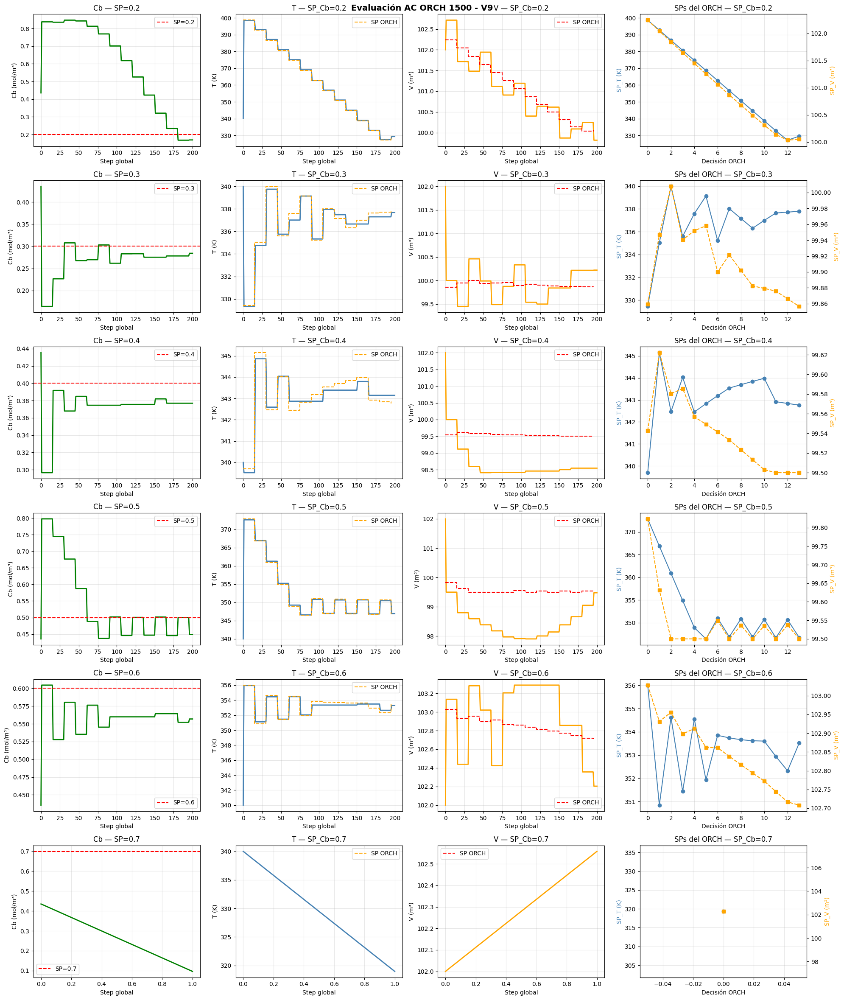

In [ ]:
# ============ GRILLA DE Cb Y GRAFICOS ============
Cb_setpoints = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7]

fig, axes = plt.subplots(len(Cb_setpoints), 4, figsize=(20, 4 * len(Cb_setpoints)))

for i, cb_sp in enumerate(Cb_setpoints):
    cb_traj, T_traj, V_traj, SP_T, SP_V = evaluar_cb(trainer_eval, cb_sp)
    steps = np.arange(len(cb_traj))

    # Cb
    axes[i, 0].plot(steps, cb_traj, color='green', linewidth=2)
    axes[i, 0].axhline(cb_sp, color='red', linestyle='--', linewidth=1.5, label=f'SP={cb_sp}')
    axes[i, 0].set_title(f'Cb — SP={cb_sp}')
    axes[i, 0].set_ylabel('Cb (mol/m³)')
    axes[i, 0].legend(); axes[i, 0].grid(True, alpha=0.3)

    # T con los SPs que pidió el ORCH marcados
    axes[i, 1].plot(steps, T_traj, color='steelblue', linewidth=2)
    if SP_T:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_T))]
        axes[i, 1].step(sp_steps, SP_T, color='orange', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 1].legend()
    axes[i, 1].set_title(f'T — SP_Cb={cb_sp}')
    axes[i, 1].set_ylabel('T (K)'); axes[i, 1].grid(True, alpha=0.3)

    # V con los SPs que pidió el ORCH marcados
    axes[i, 2].plot(steps, V_traj, color='orange', linewidth=2)
    if SP_V:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_V))]
        axes[i, 2].step(sp_steps, SP_V, color='red', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 2].legend()
    axes[i, 2].set_title(f'V — SP_Cb={cb_sp}')
    axes[i, 2].set_ylabel('V (m³)'); axes[i, 2].grid(True, alpha=0.3)

    # SPs del ORCH a lo largo del episodio
    if SP_T and SP_V:
        dec_idx = np.arange(len(SP_T))
        axes[i, 3].plot(dec_idx, SP_T, 'o-', color='steelblue', label='SP_T')
        ax2 = axes[i, 3].twinx()
        ax2.plot(dec_idx, SP_V, 's--', color='orange', label='SP_V')
        axes[i, 3].set_title(f'SPs del ORCH — SP_Cb={cb_sp}')
        axes[i, 3].set_xlabel('Decisión ORCH')
        axes[i, 3].set_ylabel('SP_T (K)', color='steelblue')
        ax2.set_ylabel('SP_V (m³)', color='orange')
        axes[i, 3].grid(True, alpha=0.3)

    for ax in axes[i, :3]:
        ax.set_xlabel('Step global')

plt.suptitle('Evaluación AC ORCH 1500 - V9', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('eval_ac_orch__15000_V9', dpi=150, bbox_inches='tight')
plt.show()

In [ ]:
api = wandb.Api()
artifact = api.artifact('ve326684-universidad-ort-uruguay/Tesis_AC_ORCH_15K_V9/model_ac_orch_15k_run-v9:latest')
artifact_dir = artifact.download()

DEVICE             = 'cuda' if torch.cuda.is_available() else 'cpu'
MANIPULABLE_RANGES = [(300, 420), (99.5, 104)]
ORCH_FREQ          = 15
N_DEC_ORCH         = 8
MAX_STEPS          = 200

eval_config = {
    'env_config': {
        'architecture'             : 'jerarquica',
        'env_type'                 : 'simulation',
        'n_manipulable_vars'       : 2,
        'manipulable_ranges'       : MANIPULABLE_RANGES,
        'n_target_vars'            : 1,
        'target_ranges'            : [(0.1, 0.9)],
        'target_setpoints'         : [0.4],
        'target_working_ranges'    : [(0.0, 2.0)],
        'dt_usuario'               : 1.0,
        'max_steps'                : MAX_STEPS,
        'orch_freq'                : ORCH_FREQ,
        'max_time_detector'        : 200,
        'reward_dead_band'         : 0.02,
        'delta_percent_ctrl'       : 0.05,
        'delta_percent_orch'       : 0.05,
        'reward_weights'           : {'error': 1.0, 'tiempo': 0.001, 'overshoot': 0.3, 'energy': 0.001},
        'pid_limits'               : [(0.01, 5.0), (0.001, 1.0), (0.0, 1.0)],
        'agent_orchestrator_config': {'agent_type': 'continuous'},
        'env_type_config'          : {'dt': 1.0, 'control_limits': (MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1])},
        'stability_config'         : {
            'error_increase_tolerance': 2.0,
            'max_sign_changes_ratio'  : 0.2,
            'max_abrupt_change_ratio' : 0.05,
            'abrupt_change_threshold' : 0.5,
        },
    },
    'ctrl_checkpoint_path': f'{artifact_dir}/agent_ctrl_best.pt',
    'agent_ctrl_config': {
        'algorithm'  : 'ac',
        'state_dim'  : 10,
        'action_dim' : 6,
        'n_vars'     : 2,
        'action_type': 'continuous',
        'hidden_dims': (256, 128, 64),
        'device'     : DEVICE,
    },
    'agent_orch_config': {
        'algorithm'    : 'ac',
        'state_dim'    : 7,
        'action_dim'   : 2,
        'n_vars'       : 2,
        'action_type'  : 'continuous',
        'hidden_dims'  : (64, 32),
        'lr_actor'     : 2e-05,
        'lr_critic'    : 1e-03,
        'gamma'        : 0.9,
        'entropy_coef' : 0.15,
        'batch_size'   : 64,
        'buffer_size'  : 10000,
        'warmup_steps' : 200,
        'device'       : DEVICE,
        'seed'         : 42,
    },
    'n_episodes'                  : 1,
    'max_steps_per_episode'       : MAX_STEPS,
    'eval_frequency'              : 9999,
    'log_frequency'               : 1,
    'save_frequency'              : 9999,
    'checkpoint_dir'              : 'checkpoints/eval_tmp',
    'early_stopping_patience'     : 9999,
    'early_stopping_min_delta_pct': 0.01,
    'use_wandb'                   : False,
}

cstr = CSTRSimulator(dt=1.0, control_limits=(MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1]))
trainer_eval = ACTrainer(eval_config)
trainer_eval.env.proceso.connect_external_process(cstr)
trainer_eval.agent_orch.load(f'{artifact_dir}/agent_orch_best.pt')
print('Agentes cargados')
print(f'orch_freq={ORCH_FREQ} | max_steps={MAX_STEPS} | decisiones ORCH/ep={N_DEC_ORCH}')

wandb:   10 of 10 files downloaded.  


Cargando agente CTRL pre-entrenado desde: /content/artifacts/model_ac_orch_15k_run-v9:v12/agent_ctrl_best.pt
AC Estocástico creado | role=ctrl | state=10 | action=6 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-v9:v12/agent_ctrl_best.pt
AC Estocástico creado | role=orch | state=7 | action=2 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-v9:v12/agent_orch_best.pt
Agentes cargados
orch_freq=15 | max_steps=200 | decisiones ORCH/ep=8



SP_Cb=0.2 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=334.5K  SP_V=102.16m³ | Cb=0.2390
  Step  15 | ORCH actúa → SP_T=328.5K  SP_V=101.94m³ | Cb=0.1827
  Step  30 | ORCH actúa → SP_T=326.0K  SP_V=101.73m³ | Cb=0.1476
  Step  45 | ORCH actúa → SP_T=331.8K  SP_V=101.62m³ | Cb=0.1887
  Step  60 | ORCH actúa → SP_T=327.9K  SP_V=101.42m³ | Cb=0.1673
  Step  75 | ORCH actúa → SP_T=332.4K  SP_V=101.26m³ | Cb=0.1982
  Step  90 | ORCH actúa → SP_T=327.1K  SP_V=101.05m³ | Cb=0.1639
  Step 105 | ORCH actúa → SP_T=332.5K  SP_V=100.93m³ | Cb=0.1969
  Step 120 | ORCH actúa → SP_T=327.6K  SP_V=100.72m³ | Cb=0.1659
  Step 135 | ORCH actúa → SP_T=333.1K  SP_V=100.62m³ | Cb=0.2055
  Step 150 | ORCH actúa → SP_T=327.4K  SP_V=100.41m³ | Cb=0.1665
  Step 165 | ORCH actúa → SP_T=333.1K  SP_V=100.33m³ | Cb=0.2018
  Step 180 | ORCH actúa → SP_T=327.8K  SP_V=100.12m³ | Cb=0.1699
  Step 195 | ORCH actúa → SP_T=333.3K  SP_V=100.03m³ | Cb=0.2073
  → Cb_final=0.2073 | Error=

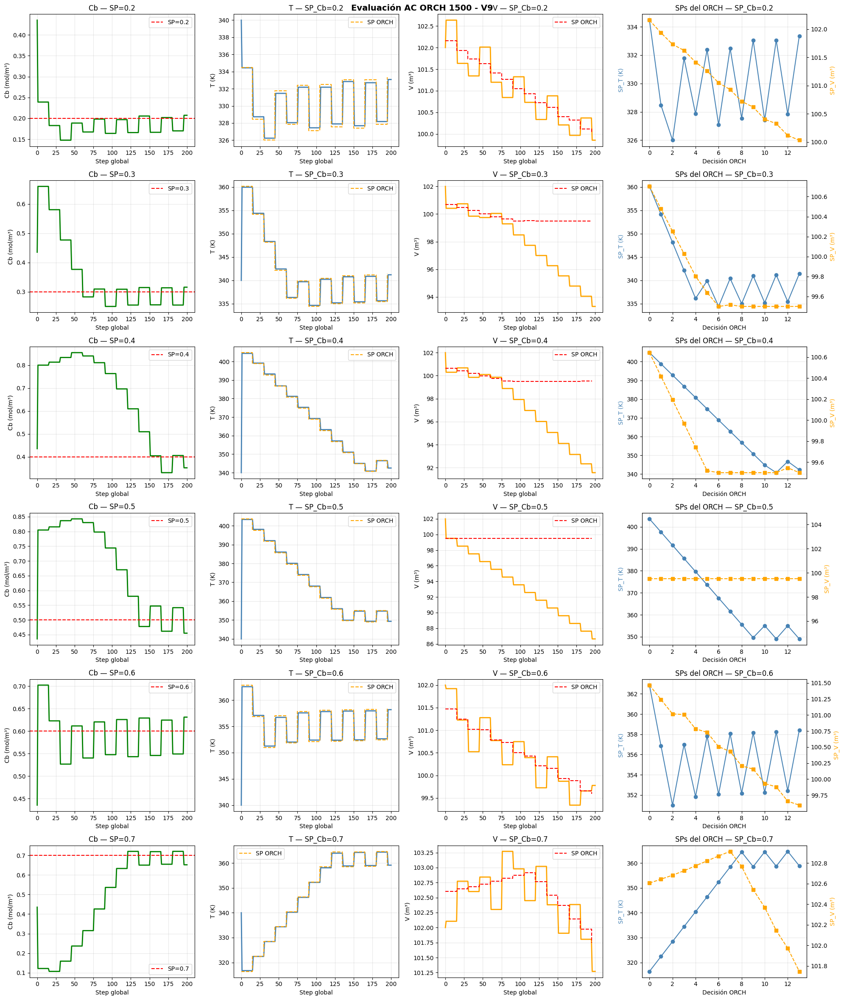

In [ ]:
# ============ GRILLA DE Cb Y GRAFICOS ============
Cb_setpoints = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7]

fig, axes = plt.subplots(len(Cb_setpoints), 4, figsize=(20, 4 * len(Cb_setpoints)))

for i, cb_sp in enumerate(Cb_setpoints):
    cb_traj, T_traj, V_traj, SP_T, SP_V = evaluar_cb(trainer_eval, cb_sp)
    steps = np.arange(len(cb_traj))

    # Cb
    axes[i, 0].plot(steps, cb_traj, color='green', linewidth=2)
    axes[i, 0].axhline(cb_sp, color='red', linestyle='--', linewidth=1.5, label=f'SP={cb_sp}')
    axes[i, 0].set_title(f'Cb — SP={cb_sp}')
    axes[i, 0].set_ylabel('Cb (mol/m³)')
    axes[i, 0].legend(); axes[i, 0].grid(True, alpha=0.3)

    # T con los SPs que pidió el ORCH marcados
    axes[i, 1].plot(steps, T_traj, color='steelblue', linewidth=2)
    if SP_T:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_T))]
        axes[i, 1].step(sp_steps, SP_T, color='orange', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 1].legend()
    axes[i, 1].set_title(f'T — SP_Cb={cb_sp}')
    axes[i, 1].set_ylabel('T (K)'); axes[i, 1].grid(True, alpha=0.3)

    # V con los SPs que pidió el ORCH marcados
    axes[i, 2].plot(steps, V_traj, color='orange', linewidth=2)
    if SP_V:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_V))]
        axes[i, 2].step(sp_steps, SP_V, color='red', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 2].legend()
    axes[i, 2].set_title(f'V — SP_Cb={cb_sp}')
    axes[i, 2].set_ylabel('V (m³)'); axes[i, 2].grid(True, alpha=0.3)

    # SPs del ORCH a lo largo del episodio
    if SP_T and SP_V:
        dec_idx = np.arange(len(SP_T))
        axes[i, 3].plot(dec_idx, SP_T, 'o-', color='steelblue', label='SP_T')
        ax2 = axes[i, 3].twinx()
        ax2.plot(dec_idx, SP_V, 's--', color='orange', label='SP_V')
        axes[i, 3].set_title(f'SPs del ORCH — SP_Cb={cb_sp}')
        axes[i, 3].set_xlabel('Decisión ORCH')
        axes[i, 3].set_ylabel('SP_T (K)', color='steelblue')
        ax2.set_ylabel('SP_V (m³)', color='orange')
        axes[i, 3].grid(True, alpha=0.3)

    for ax in axes[i, :3]:
        ax.set_xlabel('Step global')

plt.suptitle('Evaluación AC ORCH 1500 - V9', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('eval_ac_orch__15000_V9', dpi=150, bbox_inches='tight')
plt.show()

In [ ]:
 DEVICE             = 'cuda' if torch.cuda.is_available() else 'cpu'
MANIPULABLE_RANGES = [(300, 420), (99.5, 104)]
ORCH_FREQ          = 15
N_DEC_ORCH         = 8
MAX_STEPS          = 200

eval_config = {
    'env_config': {
        'architecture'             : 'jerarquica',
        'env_type'                 : 'simulation',
        'n_manipulable_vars'       : 2,
        'manipulable_ranges'       : MANIPULABLE_RANGES,
        'n_target_vars'            : 1,
        'target_ranges'            : [(0.1, 0.9)],
        'target_setpoints'         : [0.4],
        'target_working_ranges'    : [(0.0, 2.0)],
        'dt_usuario'               : 1.0,
        'max_steps'                : MAX_STEPS,
        'orch_freq'                : ORCH_FREQ,
        'max_time_detector'        : 200,
        'reward_dead_band'         : 0.02,
        'delta_percent_ctrl'       : 0.05,
        'delta_percent_orch'       : 0.05,
        'reward_weights'           : {'error': 1.0, 'tiempo': 0.001, 'overshoot': 0.3, 'energy': 0.001},
        'pid_limits'               : [(0.01, 5.0), (0.001, 1.0), (0.0, 1.0)],
        'agent_orchestrator_config': {'agent_type': 'continuous'},
        'env_type_config'          : {'dt': 1.0, 'control_limits': (MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1])},
        'stability_config'         : {
            'error_increase_tolerance': 2.0,
            'max_sign_changes_ratio'  : 0.2,
            'max_abrupt_change_ratio' : 0.05,
            'abrupt_change_threshold' : 0.5,
        },
    },
    'ctrl_checkpoint_path': f'{artifact_dir}/agent_ctrl_best.pt',
    'agent_ctrl_config': {
        'algorithm'  : 'ac',
        'state_dim'  : 10,
        'action_dim' : 6,
        'n_vars'     : 2,
        'action_type': 'continuous',
        'hidden_dims': (256, 128, 64),
        'device'     : DEVICE,
    },
    'agent_orch_config': {
        'algorithm'    : 'ac',
        'state_dim'    : 7,
        'action_dim'   : 2,
        'n_vars'       : 2,
        'action_type'  : 'continuous',
        'hidden_dims'  : (64, 32),
        'lr_actor'     : 2e-05,
        'lr_critic'    : 1e-03,
        'gamma'        : 0.9,
        'entropy_coef' : 0.15,
        'batch_size'   : 64,
        'buffer_size'  : 10000,
        'warmup_steps' : 200,
        'device'       : DEVICE,
        'seed'         : 42,
    },
    'n_episodes'                  : 1,
    'max_steps_per_episode'       : MAX_STEPS,
    'eval_frequency'              : 9999,
    'log_frequency'               : 1,
    'save_frequency'              : 9999,
    'checkpoint_dir'              : 'checkpoints/eval_tmp',
    'early_stopping_patience'     : 9999,
    'early_stopping_min_delta_pct': 0.01,
    'use_wandb'                   : False,
}

cstr = CSTRSimulator(dt=1.0, control_limits=(MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1]))
trainer_eval = ACTrainer(eval_config)
trainer_eval.env.proceso.connect_external_process(cstr)
trainer_eval.agent_orch.load('/content/artifacts/model_ac_orch_15k_run-v9:v12/agent_orch_ep2000.pt')
print('Agentes cargados')
print(f'orch_freq={ORCH_FREQ} | max_steps={MAX_STEPS} | decisiones ORCH/ep={N_DEC_ORCH}')

Cargando agente CTRL pre-entrenado desde: /content/artifacts/model_ac_orch_15k_run-v9:v12/agent_ctrl_best.pt
AC Estocástico creado | role=ctrl | state=10 | action=6 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-v9:v12/agent_ctrl_best.pt
AC Estocástico creado | role=orch | state=7 | action=2 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-v9:v12/agent_orch_ep2000.pt
Agentes cargados
orch_freq=15 | max_steps=200 | decisiones ORCH/ep=8



SP_Cb=0.2 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=388.7K  SP_V=102.73m³ | Cb=0.8554
  Step  15 | ORCH actúa → SP_T=382.7K  SP_V=102.53m³ | Cb=0.8435
  Step  30 | ORCH actúa → SP_T=376.7K  SP_V=102.33m³ | Cb=0.8279
  Step  45 | ORCH actúa → SP_T=370.7K  SP_V=102.13m³ | Cb=0.7899
  Step  60 | ORCH actúa → SP_T=364.7K  SP_V=101.93m³ | Cb=0.7261
  Step  75 | ORCH actúa → SP_T=358.7K  SP_V=101.74m³ | Cb=0.6560
  Step  90 | ORCH actúa → SP_T=352.7K  SP_V=101.55m³ | Cb=0.5586
  Step 105 | ORCH actúa → SP_T=346.7K  SP_V=101.36m³ | Cb=0.4578
  Step 120 | ORCH actúa → SP_T=340.8K  SP_V=101.17m³ | Cb=0.3598
  Step 135 | ORCH actúa → SP_T=334.8K  SP_V=100.99m³ | Cb=0.2649
  Step 150 | ORCH actúa → SP_T=328.9K  SP_V=100.85m³ | Cb=0.1869
  Step 165 | ORCH actúa → SP_T=327.1K  SP_V=100.82m³ | Cb=0.1568
  Step 180 | ORCH actúa → SP_T=330.0K  SP_V=100.84m³ | Cb=0.1739
  Step 195 | ORCH actúa → SP_T=330.5K  SP_V=100.84m³ | Cb=0.1803
  → Cb_final=0.1803 | Error=

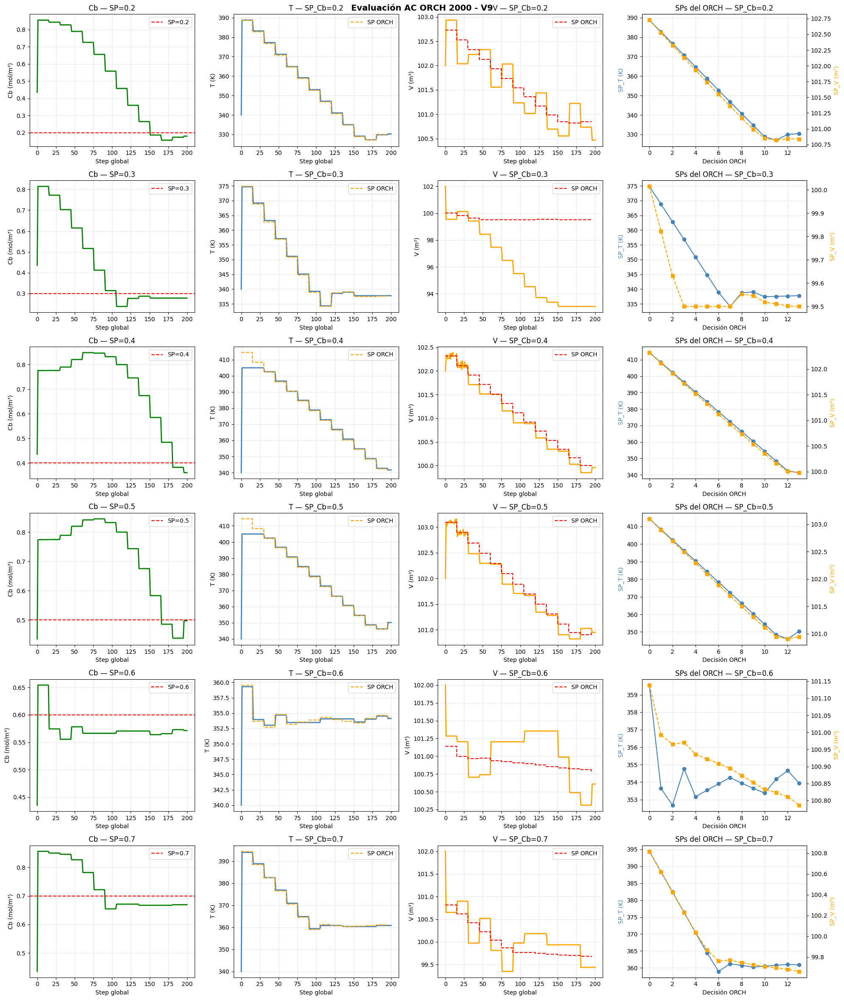

In [ ]:
# ============ GRILLA DE Cb Y GRAFICOS ============
Cb_setpoints = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7]

fig, axes = plt.subplots(len(Cb_setpoints), 4, figsize=(20, 4 * len(Cb_setpoints)))

for i, cb_sp in enumerate(Cb_setpoints):
    cb_traj, T_traj, V_traj, SP_T, SP_V = evaluar_cb(trainer_eval, cb_sp)
    steps = np.arange(len(cb_traj))

    # Cb
    axes[i, 0].plot(steps, cb_traj, color='green', linewidth=2)
    axes[i, 0].axhline(cb_sp, color='red', linestyle='--', linewidth=1.5, label=f'SP={cb_sp}')
    axes[i, 0].set_title(f'Cb — SP={cb_sp}')
    axes[i, 0].set_ylabel('Cb (mol/m³)')
    axes[i, 0].legend(); axes[i, 0].grid(True, alpha=0.3)

    # T con los SPs que pidió el ORCH marcados
    axes[i, 1].plot(steps, T_traj, color='steelblue', linewidth=2)
    if SP_T:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_T))]
        axes[i, 1].step(sp_steps, SP_T, color='orange', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 1].legend()
    axes[i, 1].set_title(f'T — SP_Cb={cb_sp}')
    axes[i, 1].set_ylabel('T (K)'); axes[i, 1].grid(True, alpha=0.3)

    # V con los SPs que pidió el ORCH marcados
    axes[i, 2].plot(steps, V_traj, color='orange', linewidth=2)
    if SP_V:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_V))]
        axes[i, 2].step(sp_steps, SP_V, color='red', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 2].legend()
    axes[i, 2].set_title(f'V — SP_Cb={cb_sp}')
    axes[i, 2].set_ylabel('V (m³)'); axes[i, 2].grid(True, alpha=0.3)

    # SPs del ORCH a lo largo del episodio
    if SP_T and SP_V:
        dec_idx = np.arange(len(SP_T))
        axes[i, 3].plot(dec_idx, SP_T, 'o-', color='steelblue', label='SP_T')
        ax2 = axes[i, 3].twinx()
        ax2.plot(dec_idx, SP_V, 's--', color='orange', label='SP_V')
        axes[i, 3].set_title(f'SPs del ORCH — SP_Cb={cb_sp}')
        axes[i, 3].set_xlabel('Decisión ORCH')
        axes[i, 3].set_ylabel('SP_T (K)', color='steelblue')
        ax2.set_ylabel('SP_V (m³)', color='orange')
        axes[i, 3].grid(True, alpha=0.3)

    for ax in axes[i, :3]:
        ax.set_xlabel('Step global')

plt.suptitle('Evaluación AC ORCH 2000 - V9', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('eval_ac_orch__2000_V9', dpi=150, bbox_inches='tight')
plt.show()

In [ ]:
 DEVICE             = 'cuda' if torch.cuda.is_available() else 'cpu'
MANIPULABLE_RANGES = [(300, 420), (99.5, 104)]
ORCH_FREQ          = 15
N_DEC_ORCH         = 8
MAX_STEPS          = 200

eval_config = {
    'env_config': {
        'architecture'             : 'jerarquica',
        'env_type'                 : 'simulation',
        'n_manipulable_vars'       : 2,
        'manipulable_ranges'       : MANIPULABLE_RANGES,
        'n_target_vars'            : 1,
        'target_ranges'            : [(0.1, 0.9)],
        'target_setpoints'         : [0.4],
        'target_working_ranges'    : [(0.0, 2.0)],
        'dt_usuario'               : 1.0,
        'max_steps'                : MAX_STEPS,
        'orch_freq'                : ORCH_FREQ,
        'max_time_detector'        : 200,
        'reward_dead_band'         : 0.02,
        'delta_percent_ctrl'       : 0.05,
        'delta_percent_orch'       : 0.05,
        'reward_weights'           : {'error': 1.0, 'tiempo': 0.001, 'overshoot': 0.3, 'energy': 0.001},
        'pid_limits'               : [(0.01, 5.0), (0.001, 1.0), (0.0, 1.0)],
        'agent_orchestrator_config': {'agent_type': 'continuous'},
        'env_type_config'          : {'dt': 1.0, 'control_limits': (MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1])},
        'stability_config'         : {
            'error_increase_tolerance': 2.0,
            'max_sign_changes_ratio'  : 0.2,
            'max_abrupt_change_ratio' : 0.05,
            'abrupt_change_threshold' : 0.5,
        },
    },
    'ctrl_checkpoint_path': f'{artifact_dir}/agent_ctrl_best.pt',
    'agent_ctrl_config': {
        'algorithm'  : 'ac',
        'state_dim'  : 10,
        'action_dim' : 6,
        'n_vars'     : 2,
        'action_type': 'continuous',
        'hidden_dims': (256, 128, 64),
        'device'     : DEVICE,
    },
    'agent_orch_config': {
        'algorithm'    : 'ac',
        'state_dim'    : 7,
        'action_dim'   : 2,
        'n_vars'       : 2,
        'action_type'  : 'continuous',
        'hidden_dims'  : (64, 32),
        'lr_actor'     : 2e-05,
        'lr_critic'    : 1e-03,
        'gamma'        : 0.9,
        'entropy_coef' : 0.15,
        'batch_size'   : 64,
        'buffer_size'  : 10000,
        'warmup_steps' : 200,
        'device'       : DEVICE,
        'seed'         : 42,
    },
    'n_episodes'                  : 1,
    'max_steps_per_episode'       : MAX_STEPS,
    'eval_frequency'              : 9999,
    'log_frequency'               : 1,
    'save_frequency'              : 9999,
    'checkpoint_dir'              : 'checkpoints/eval_tmp',
    'early_stopping_patience'     : 9999,
    'early_stopping_min_delta_pct': 0.01,
    'use_wandb'                   : False,
}

cstr = CSTRSimulator(dt=1.0, control_limits=(MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1]))
trainer_eval = ACTrainer(eval_config)
trainer_eval.env.proceso.connect_external_process(cstr)
trainer_eval.agent_orch.load('/content/artifacts/model_ac_orch_15k_run-v9:v12/agent_orch_ep8000.pt')
print('Agentes cargados')
print(f'orch_freq={ORCH_FREQ} | max_steps={MAX_STEPS} | decisiones ORCH/ep={N_DEC_ORCH}')

Cargando agente CTRL pre-entrenado desde: /content/artifacts/model_ac_orch_15k_run-v9:v12/agent_ctrl_best.pt
AC Estocástico creado | role=ctrl | state=10 | action=6 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-v9:v12/agent_ctrl_best.pt
AC Estocástico creado | role=orch | state=7 | action=2 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-v9:v12/agent_orch_ep8000.pt
Agentes cargados
orch_freq=15 | max_steps=200 | decisiones ORCH/ep=8



SP_Cb=0.2 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=327.6K  SP_V=102.46m³ | Cb=0.1553
  Step  15 | ORCH actúa → SP_T=331.8K  SP_V=102.28m³ | Cb=0.1915
  Step  30 | ORCH actúa → SP_T=326.5K  SP_V=102.06m³ | Cb=0.1582
  Step  45 | ORCH actúa → SP_T=331.0K  SP_V=101.89m³ | Cb=0.1835
  Step  60 | ORCH actúa → SP_T=327.6K  SP_V=101.68m³ | Cb=0.1639
  Step  75 | ORCH actúa → SP_T=331.9K  SP_V=101.51m³ | Cb=0.1929
  Step  90 | ORCH actúa → SP_T=326.8K  SP_V=101.30m³ | Cb=0.1610
  Step 105 | ORCH actúa → SP_T=332.1K  SP_V=101.16m³ | Cb=0.1923
  Step 120 | ORCH actúa → SP_T=327.5K  SP_V=100.95m³ | Cb=0.1645
  Step 135 | ORCH actúa → SP_T=332.7K  SP_V=100.82m³ | Cb=0.2021
  Step 150 | ORCH actúa → SP_T=327.1K  SP_V=100.61m³ | Cb=0.1636
  Step 165 | ORCH actúa → SP_T=332.7K  SP_V=100.51m³ | Cb=0.1983
  Step 180 | ORCH actúa → SP_T=327.7K  SP_V=100.30m³ | Cb=0.1681
  Step 195 | ORCH actúa → SP_T=333.2K  SP_V=100.20m³ | Cb=0.2049
  → Cb_final=0.2049 | Error=

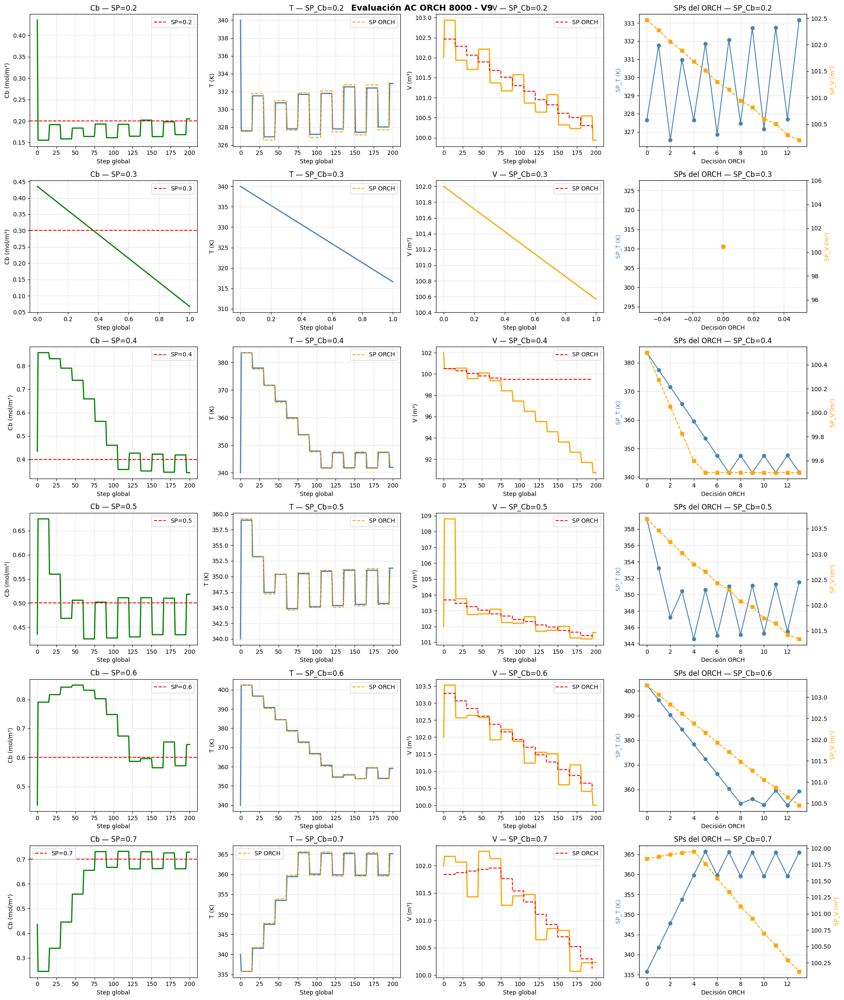

In [ ]:
# ============ GRILLA DE Cb Y GRAFICOS ============
Cb_setpoints = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7]

fig, axes = plt.subplots(len(Cb_setpoints), 4, figsize=(20, 4 * len(Cb_setpoints)))

for i, cb_sp in enumerate(Cb_setpoints):
    cb_traj, T_traj, V_traj, SP_T, SP_V = evaluar_cb(trainer_eval, cb_sp)
    steps = np.arange(len(cb_traj))

    # Cb
    axes[i, 0].plot(steps, cb_traj, color='green', linewidth=2)
    axes[i, 0].axhline(cb_sp, color='red', linestyle='--', linewidth=1.5, label=f'SP={cb_sp}')
    axes[i, 0].set_title(f'Cb — SP={cb_sp}')
    axes[i, 0].set_ylabel('Cb (mol/m³)')
    axes[i, 0].legend(); axes[i, 0].grid(True, alpha=0.3)

    # T con los SPs que pidió el ORCH marcados
    axes[i, 1].plot(steps, T_traj, color='steelblue', linewidth=2)
    if SP_T:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_T))]
        axes[i, 1].step(sp_steps, SP_T, color='orange', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 1].legend()
    axes[i, 1].set_title(f'T — SP_Cb={cb_sp}')
    axes[i, 1].set_ylabel('T (K)'); axes[i, 1].grid(True, alpha=0.3)

    # V con los SPs que pidió el ORCH marcados
    axes[i, 2].plot(steps, V_traj, color='orange', linewidth=2)
    if SP_V:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_V))]
        axes[i, 2].step(sp_steps, SP_V, color='red', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 2].legend()
    axes[i, 2].set_title(f'V — SP_Cb={cb_sp}')
    axes[i, 2].set_ylabel('V (m³)'); axes[i, 2].grid(True, alpha=0.3)

    # SPs del ORCH a lo largo del episodio
    if SP_T and SP_V:
        dec_idx = np.arange(len(SP_T))
        axes[i, 3].plot(dec_idx, SP_T, 'o-', color='steelblue', label='SP_T')
        ax2 = axes[i, 3].twinx()
        ax2.plot(dec_idx, SP_V, 's--', color='orange', label='SP_V')
        axes[i, 3].set_title(f'SPs del ORCH — SP_Cb={cb_sp}')
        axes[i, 3].set_xlabel('Decisión ORCH')
        axes[i, 3].set_ylabel('SP_T (K)', color='steelblue')
        ax2.set_ylabel('SP_V (m³)', color='orange')
        axes[i, 3].grid(True, alpha=0.3)

    for ax in axes[i, :3]:
        ax.set_xlabel('Step global')

plt.suptitle('Evaluación AC ORCH 8000 - V9', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('eval_ac_orch__8000_V9', dpi=150, bbox_inches='tight')
plt.show()

## Comparacion con el paper, agente de 2000 episodios de la version 9

In [ ]:
 DEVICE             = 'cuda' if torch.cuda.is_available() else 'cpu'
MANIPULABLE_RANGES = [(300, 420), (99.5, 104)]
ORCH_FREQ          = 15
N_DEC_ORCH         = 8
MAX_STEPS          = 200

eval_config = {
    'env_config': {
        'architecture'             : 'jerarquica',
        'env_type'                 : 'simulation',
        'n_manipulable_vars'       : 2,
        'manipulable_ranges'       : MANIPULABLE_RANGES,
        'n_target_vars'            : 1,
        'target_ranges'            : [(0.1, 0.9)],
        'target_setpoints'         : [0.4],
        'target_working_ranges'    : [(0.0, 2.0)],
        'dt_usuario'               : 1.0,
        'max_steps'                : MAX_STEPS,
        'orch_freq'                : ORCH_FREQ,
        'max_time_detector'        : 200,
        'reward_dead_band'         : 0.02,
        'delta_percent_ctrl'       : 0.05,
        'delta_percent_orch'       : 0.05,
        'reward_weights'           : {'error': 1.0, 'tiempo': 0.001, 'overshoot': 0.3, 'energy': 0.001},
        'pid_limits'               : [(0.01, 5.0), (0.001, 1.0), (0.0, 1.0)],
        'agent_orchestrator_config': {'agent_type': 'continuous'},
        'env_type_config'          : {'dt': 1.0, 'control_limits': (MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1])},
        'stability_config'         : {
            'error_increase_tolerance': 2.0,
            'max_sign_changes_ratio'  : 0.2,
            'max_abrupt_change_ratio' : 0.05,
            'abrupt_change_threshold' : 0.5,
        },
    },
    'ctrl_checkpoint_path': f'{artifact_dir}/agent_ctrl_best.pt',
    'agent_ctrl_config': {
        'algorithm'  : 'ac',
        'state_dim'  : 10,
        'action_dim' : 6,
        'n_vars'     : 2,
        'action_type': 'continuous',
        'hidden_dims': (256, 128, 64),
        'device'     : DEVICE,
    },
    'agent_orch_config': {
        'algorithm'    : 'ac',
        'state_dim'    : 7,
        'action_dim'   : 2,
        'n_vars'       : 2,
        'action_type'  : 'continuous',
        'hidden_dims'  : (64, 32),
        'lr_actor'     : 2e-05,
        'lr_critic'    : 1e-03,
        'gamma'        : 0.9,
        'entropy_coef' : 0.15,
        'batch_size'   : 64,
        'buffer_size'  : 10000,
        'warmup_steps' : 200,
        'device'       : DEVICE,
        'seed'         : 42,
    },
    'n_episodes'                  : 1,
    'max_steps_per_episode'       : MAX_STEPS,
    'eval_frequency'              : 9999,
    'log_frequency'               : 1,
    'save_frequency'              : 9999,
    'checkpoint_dir'              : 'checkpoints/eval_tmp',
    'early_stopping_patience'     : 9999,
    'early_stopping_min_delta_pct': 0.01,
    'use_wandb'                   : False,
}

cstr = CSTRSimulator(dt=1.0, control_limits=(MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1]))
trainer_eval = ACTrainer(eval_config)
trainer_eval.env.proceso.connect_external_process(cstr)
trainer_eval.agent_orch.load('/content/artifacts/model_ac_orch_15k_run-v9:v12/agent_orch_ep2000.pt')
print('Agentes cargados')
print(f'orch_freq={ORCH_FREQ} | max_steps={MAX_STEPS} | decisiones ORCH/ep={N_DEC_ORCH}')

Cargando agente CTRL pre-entrenado desde: /content/artifacts/model_ac_orch_15k_run-v9:v12/agent_ctrl_best.pt
AC Estocástico creado | role=ctrl | state=10 | action=6 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-v9:v12/agent_ctrl_best.pt
AC Estocástico creado | role=orch | state=7 | action=2 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-v9:v12/agent_orch_ep2000.pt
Agentes cargados
orch_freq=15 | max_steps=200 | decisiones ORCH/ep=8


=== OPCIÓN A: Con target_ranges normales (puede terminar antes) ===
Steps completados: 120/120
Cb final por SP:
  SP=0.075 → Cb=0.1239 | Error=0.0489
  SP=0.45 → Cb=0.2866 | Error=0.1634
  SP=0.75 → Cb=0.4962 | Error=0.2538

=== OPCIÓN B: Sin límite de rango (corre los 120 steps completos) ===
Steps completados: 120/120
Cb final por SP:
  SP=0.075 → Cb=0.1232 | Error=0.0482
  SP=0.45 → Cb=0.2864 | Error=0.1636
  SP=0.75 → Cb=0.4981 | Error=0.2519


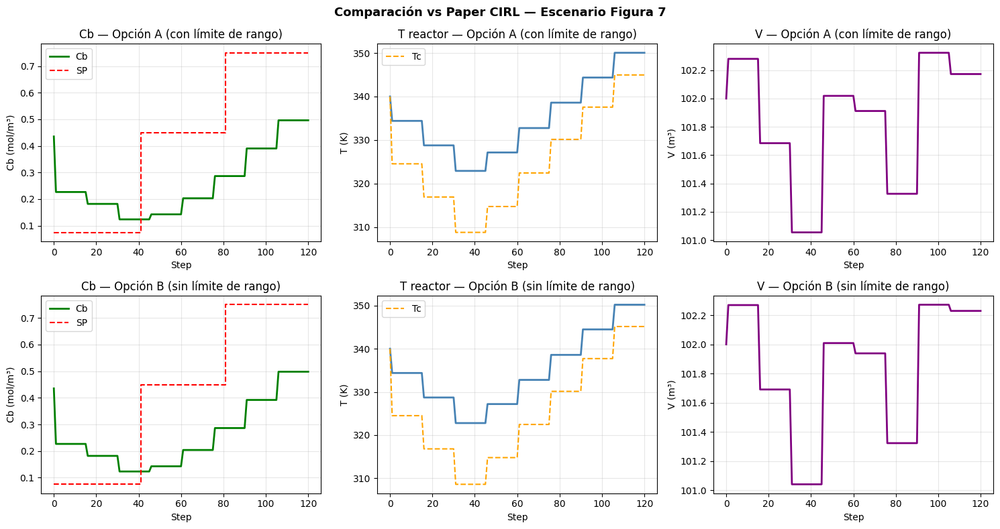

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# ============ FUNCIÓN DE EVALUACIÓN ESTILO PAPER ============
def evaluar_paper(trainer, sp_sequence=[0.075, 0.45, 0.75],
                  steps_per_sp=40, allow_out_of_range=False):
    """
    Replica el escenario de prueba de la Figura 7 del paper CIRL.
    allow_out_of_range=True → no termina el episodio si Cb sale de target_ranges
    allow_out_of_range=False → comportamiento normal con target_ranges
    """
    cstr = trainer.env.proceso.external_process

    # Estado inicial del paper: Cb=0, T=327K, V=102m³
    cstr.state = np.array([0.0, 0.0, 0.0, 327.0, 102.0])
    cstr.Tc_current = cstr.Tc_initial
    cstr.F_current = cstr.F_initial

    # Reset del ambiente y sobreescribir con estado del paper
    trainer.env.reset()
    trainer.env.manipulable_pvs = list(cstr.get_initial_pvs())
    trainer.env.proceso.manipulable_pvs = trainer.env.manipulable_pvs.copy()
    trainer.env.target_pvs = [float(cstr.state[1])]  # Cb=0
    trainer.env.target_setpoints = [sp_sequence[0]]
    trainer.env.current_SPs_manipulable = trainer.env.manipulable_pvs.copy()
    trainer.env.new_SP = trainer.env.manipulable_pvs.copy()
    trainer.env._update_errors()

    obs = trainer.env._get_observation()
    state_orch = obs['orch']
    state_ctrl = obs['ctrl']

    cb_traj  = [float(cstr.state[1])]
    T_traj   = [float(cstr.state[3])]
    V_traj   = [float(cstr.state[4])]
    sp_traj  = [sp_sequence[0]]
    Tc_traj  = [float(cstr.Tc_current)]

    total_steps = steps_per_sp * len(sp_sequence)
    step = 0

    while step < total_steps:
        # Actualizar SP según el step actual
        sp_idx = min(step // steps_per_sp, len(sp_sequence) - 1)
        trainer.env.target_setpoints = [sp_sequence[sp_idx]]

        action_orch = trainer.agent_orch.select_action(state_orch, training=False)
        action_ctrl = trainer.agent_ctrl.select_action(state_ctrl, training=False)

        next_obs, reward, terminated, truncated, info = trainer.env.step(
            {'ctrl': action_ctrl, 'orch': action_orch}
        )

        cb_traj.append(float(cstr.state[1]))
        T_traj.append(float(cstr.state[3]))
        V_traj.append(float(cstr.state[4]))
        sp_traj.append(sp_sequence[sp_idx])
        Tc_traj.append(float(cstr.Tc_current))

        state_orch = next_obs['orch']
        state_ctrl = next_obs['ctrl']
        step += 1

        # Opción A: terminar si sale de rango (comportamiento normal)
        if not allow_out_of_range and terminated:
            print(f"  Episodio terminado en step {step} — Cb fuera de rango")
            break
        # Opción B: ignorar terminated, solo truncar por steps

    return (np.array(cb_traj), np.array(T_traj), np.array(V_traj),
            np.array(sp_traj), np.array(Tc_traj))


# ============ CORRER AMBAS OPCIONES ============
sp_sequence   = [0.075, 0.45, 0.75]
steps_per_sp  = 40

print("=== OPCIÓN A: Con target_ranges normales (puede terminar antes) ===")
cb_a, T_a, V_a, sp_a, Tc_a = evaluar_paper(
    trainer_eval, sp_sequence, steps_per_sp, allow_out_of_range=False
)

print(f"Steps completados: {len(cb_a)-1}/120")
print(f"Cb final por SP:")
for i, sp in enumerate(sp_sequence):
    idx = min((i+1)*steps_per_sp, len(cb_a)-1)
    print(f"  SP={sp} → Cb={cb_a[idx]:.4f} | Error={abs(cb_a[idx]-sp):.4f}")

print("\n=== OPCIÓN B: Sin límite de rango (corre los 120 steps completos) ===")
cb_b, T_b, V_b, sp_b, Tc_b = evaluar_paper(
    trainer_eval, sp_sequence, steps_per_sp, allow_out_of_range=True
)

print(f"Steps completados: {len(cb_b)-1}/120")
print(f"Cb final por SP:")
for i, sp in enumerate(sp_sequence):
    idx = min((i+1)*steps_per_sp, len(cb_b)-1)
    print(f"  SP={sp} → Cb={cb_b[idx]:.4f} | Error={abs(cb_b[idx]-sp):.4f}")


# ============ GRAFICAR AMBAS OPCIONES ============
fig, axes = plt.subplots(2, 3, figsize=(15, 8))

for row, (cb, T, V, sp, Tc, label) in enumerate([
    (cb_a, T_a, V_a, sp_a, Tc_a, 'Opción A (con límite de rango)'),
    (cb_b, T_b, V_b, sp_b, Tc_b, 'Opción B (sin límite de rango)')
]):
    steps = np.arange(len(cb))

    # Cb
    axes[row, 0].plot(steps, cb, color='green', linewidth=2, label='Cb')
    axes[row, 0].step(steps, sp, color='red', linestyle='--', linewidth=1.5,
                      where='post', label='SP')
    axes[row, 0].set_title(f'Cb — {label}')
    axes[row, 0].set_ylabel('Cb (mol/m³)')
    axes[row, 0].set_xlabel('Step')
    axes[row, 0].legend(); axes[row, 0].grid(True, alpha=0.3)

    # T
    axes[row, 1].plot(steps, T, color='steelblue', linewidth=2)
    axes[row, 1].plot(steps, Tc, color='orange', linestyle='--', linewidth=1.5, label='Tc')
    axes[row, 1].set_title(f'T reactor — {label}')
    axes[row, 1].set_ylabel('T (K)')
    axes[row, 1].set_xlabel('Step')
    axes[row, 1].legend(); axes[row, 1].grid(True, alpha=0.3)

    # V
    axes[row, 2].plot(steps, V, color='purple', linewidth=2)
    axes[row, 2].set_title(f'V — {label}')
    axes[row, 2].set_ylabel('V (m³)')
    axes[row, 2].set_xlabel('Step')
    axes[row, 2].grid(True, alpha=0.3)

plt.suptitle('Comparación vs Paper CIRL — Escenario Figura 7', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('comparacion_paper_opciones.png', dpi=150, bbox_inches='tight')
plt.show()

Corriendo orch_freq=15...
  SP=0.075 → Cb=0.1216 | Error=0.0466
  SP=0.45 → Cb=0.3067 | Error=0.1433
  SP=0.75 → Cb=0.5215 | Error=0.2285
Corriendo orch_freq=10...
  SP=0.075 → Cb=0.0781 | Error=0.0031
  SP=0.45 → Cb=0.1799 | Error=0.2701
  SP=0.75 → Cb=0.5802 | Error=0.1698
Corriendo orch_freq=7...
  SP=0.075 → Cb=0.0682 | Error=0.0068
  SP=0.45 → Cb=0.4615 | Error=0.0115
  SP=0.75 → Cb=0.7700 | Error=0.0200
Corriendo orch_freq=5...
  SP=0.075 → Cb=0.0680 | Error=0.0070
  SP=0.45 → Cb=0.5003 | Error=0.0503
  SP=0.75 → Cb=0.7761 | Error=0.0261


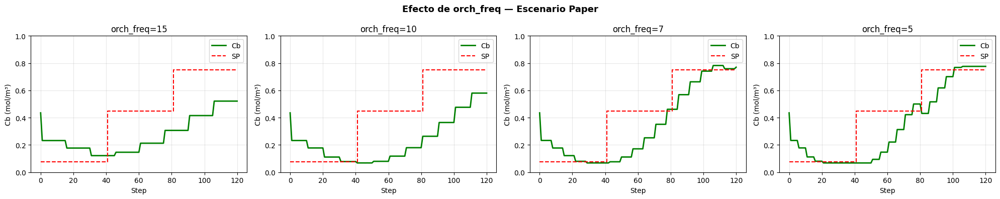

In [ ]:
# ============ EVALUACIÓN CON DISTINTOS ORCH_FREQ ============
def evaluar_paper_freq(trainer, sp_sequence=[0.075, 0.45, 0.75],
                       steps_per_sp=40, orch_freq=7):

    cstr = trainer.env.proceso.external_process

    # Estado inicial del paper
    cstr.state = np.array([0.0, 0.0, 0.0, 327.0, 102.0])
    cstr.Tc_current = cstr.Tc_initial
    cstr.F_current  = cstr.F_initial

    # Reset y sobreescribir con estado del paper
    trainer.env.reset()
    trainer.env.orch_freq = orch_freq  # sobreescribir frecuencia
    trainer.env._orch_step_count = 0
    trainer.env.manipulable_pvs = list(cstr.get_initial_pvs())
    trainer.env.proceso.manipulable_pvs = trainer.env.manipulable_pvs.copy()
    trainer.env.target_pvs = [float(cstr.state[1])]
    trainer.env.target_setpoints = [sp_sequence[0]]
    trainer.env.current_SPs_manipulable = trainer.env.manipulable_pvs.copy()
    trainer.env.new_SP = trainer.env.manipulable_pvs.copy()
    trainer.env._update_errors()

    obs = trainer.env._get_observation()
    state_orch = obs['orch']
    state_ctrl = obs['ctrl']

    cb_traj = [float(cstr.state[1])]
    T_traj  = [float(cstr.state[3])]
    V_traj  = [float(cstr.state[4])]
    sp_traj = [sp_sequence[0]]
    Tc_traj = [float(cstr.Tc_current)]

    total_steps = steps_per_sp * len(sp_sequence)

    for step in range(total_steps):
        sp_idx = min(step // steps_per_sp, len(sp_sequence) - 1)
        trainer.env.target_setpoints = [sp_sequence[sp_idx]]

        action_orch = trainer.agent_orch.select_action(state_orch, training=False)
        action_ctrl = trainer.agent_ctrl.select_action(state_ctrl, training=False)

        next_obs, reward, terminated, truncated, info = trainer.env.step(
            {'ctrl': action_ctrl, 'orch': action_orch}
        )

        cb_traj.append(float(cstr.state[1]))
        T_traj.append(float(cstr.state[3]))
        V_traj.append(float(cstr.state[4]))
        sp_traj.append(sp_sequence[sp_idx])
        Tc_traj.append(float(cstr.Tc_current))

        state_orch = next_obs['orch']
        state_ctrl = next_obs['ctrl']

    return (np.array(cb_traj), np.array(T_traj), np.array(V_traj),
            np.array(sp_traj), np.array(Tc_traj))


# ============ CORRER Y GRAFICAR DISTINTAS FRECUENCIAS ============
freqs_test = [15, 10, 7, 5]
sp_sequence  = [0.075, 0.45, 0.75]
steps_per_sp = 40

resultados = {}
for freq in freqs_test:
    print(f"Corriendo orch_freq={freq}...")
    cb, T, V, sp, Tc = evaluar_paper_freq(trainer_eval, sp_sequence, steps_per_sp, freq)
    resultados[freq] = {'cb': cb, 'T': T, 'V': V, 'sp': sp, 'Tc': Tc}
    for i, s in enumerate(sp_sequence):
        idx = min((i+1)*steps_per_sp, len(cb)-1)
        print(f"  SP={s} → Cb={cb[idx]:.4f} | Error={abs(cb[idx]-s):.4f}")

# Graficar Cb para todas las frecuencias
fig, axes = plt.subplots(1, len(freqs_test), figsize=(5*len(freqs_test), 4))
steps = np.arange(steps_per_sp * len(sp_sequence) + 1)

for ax, freq in zip(axes, freqs_test):
    r = resultados[freq]
    ax.plot(steps, r['cb'], color='green', linewidth=2, label='Cb')
    ax.step(steps, r['sp'], color='red', linestyle='--', linewidth=1.5,
            where='post', label='SP')
    ax.set_title(f'orch_freq={freq}')
    ax.set_ylabel('Cb (mol/m³)')
    ax.set_xlabel('Step')
    ax.legend(); ax.grid(True, alpha=0.3)
    ax.set_ylim(0, 1)

plt.suptitle('Efecto de orch_freq — Escenario Paper', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('comparacion_orch_freq.png', dpi=150, bbox_inches='tight')
plt.show()

## Pruebas con la version 10

In [ ]:
api = wandb.Api()
artifact = api.artifact('ve326684-universidad-ort-uruguay/Tesis_AC_ORCH_15K_V10/model_ac_orch_15k_run-v10:latest')
artifact_dir = artifact.download()

DEVICE             = 'cuda' if torch.cuda.is_available() else 'cpu'
MANIPULABLE_RANGES = [(300, 420), (99.5, 104)]
ORCH_FREQ          = 7
N_DEC_ORCH         = 8
MAX_STEPS          = 200

eval_config = {
    'env_config': {
        'architecture'             : 'jerarquica',
        'env_type'                 : 'simulation',
        'n_manipulable_vars'       : 2,
        'manipulable_ranges'       : MANIPULABLE_RANGES,
        'n_target_vars'            : 1,
        'target_ranges'            : [(0.05, 0.9)],
        'target_setpoints'         : [0.4],
        'target_working_ranges'    : [(0.0, 2.0)],
        'dt_usuario'               : 1.0,
        'max_steps'                : MAX_STEPS,
        'orch_freq'                : ORCH_FREQ,
        'max_time_detector'        : 200,
        'reward_dead_band'         : 0.02,
        'delta_percent_ctrl'       : 0.05,
        'delta_percent_orch'       : 0.05,
        'reward_weights'           : {'error': 1.0, 'tiempo': 0.001, 'overshoot': 0.3, 'energy': 0.001},
        'pid_limits'               : [(0.01, 5.0), (0.001, 1.0), (0.0, 1.0)],
        'agent_orchestrator_config': {'agent_type': 'continuous'},
        'env_type_config'          : {'dt': 1.0, 'control_limits': (MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1])},
        'stability_config'         : {
            'error_increase_tolerance': 2.0,
            'max_sign_changes_ratio'  : 0.2,
            'max_abrupt_change_ratio' : 0.05,
            'abrupt_change_threshold' : 0.5,
        },
    },
    'ctrl_checkpoint_path': f'{artifact_dir}/agent_ctrl_best.pt',
    'agent_ctrl_config': {
        'algorithm'  : 'ac',
        'state_dim'  : 10,
        'action_dim' : 6,
        'n_vars'     : 2,
        'action_type': 'continuous',
        'hidden_dims': (256, 128, 64),
        'device'     : DEVICE,
    },
    'agent_orch_config': {
        'algorithm'    : 'ac',
        'state_dim'    : 7,
        'action_dim'   : 2,
        'n_vars'       : 2,
        'action_type'  : 'continuous',
        'hidden_dims'  : (64, 32),
        'lr_actor'     : 2e-05,
        'lr_critic'    : 1e-03,
        'gamma'        : 0.9,
        'entropy_coef' : 0.15,
        'batch_size'   : 64,
        'buffer_size'  : 10000,
        'warmup_steps' : 200,
        'device'       : DEVICE,
        'seed'         : 42,
    },
    'n_episodes'                  : 1,
    'max_steps_per_episode'       : MAX_STEPS,
    'eval_frequency'              : 9999,
    'log_frequency'               : 1,
    'save_frequency'              : 9999,
    'checkpoint_dir'              : 'checkpoints/eval_tmp',
    'early_stopping_patience'     : 9999,
    'early_stopping_min_delta_pct': 0.01,
    'use_wandb'                   : False,
}

cstr = CSTRSimulator(dt=1.0, control_limits=(MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1]))
trainer_eval = ACTrainer(eval_config)
trainer_eval.env.proceso.connect_external_process(cstr)
trainer_eval.agent_orch.load(f'{artifact_dir}/agent_orch_best.pt')
print('Agentes cargados')
print(f'orch_freq={ORCH_FREQ} | max_steps={MAX_STEPS} | decisiones ORCH/ep={N_DEC_ORCH}')

wandb:   6 of 6 files downloaded.  


Cargando agente CTRL pre-entrenado desde: /content/artifacts/model_ac_orch_15k_run-v10:v7/agent_ctrl_best.pt
AC Estocástico creado | role=ctrl | state=10 | action=6 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-v10:v7/agent_ctrl_best.pt
AC Estocástico creado | role=orch | state=7 | action=2 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-v10:v7/agent_orch_best.pt
Agentes cargados
orch_freq=7 | max_steps=200 | decisiones ORCH/ep=8



SP_Cb=0.2 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=391.6K  SP_V=103.25m³ | Cb=0.8456
  Step   7 | ORCH actúa → SP_T=385.6K  SP_V=103.34m³ | Cb=0.8454
  Step  14 | ORCH actúa → SP_T=379.6K  SP_V=103.42m³ | Cb=0.8421
  Step  21 | ORCH actúa → SP_T=373.6K  SP_V=103.51m³ | Cb=0.8129
  Step  28 | ORCH actúa → SP_T=367.6K  SP_V=103.59m³ | Cb=0.7596
  Step  35 | ORCH actúa → SP_T=361.6K  SP_V=103.68m³ | Cb=0.7006
  Step  42 | ORCH actúa → SP_T=355.6K  SP_V=103.76m³ | Cb=0.6159
  Step  49 | ORCH actúa → SP_T=349.6K  SP_V=103.83m³ | Cb=0.5149
  Step  56 | ORCH actúa → SP_T=343.6K  SP_V=103.91m³ | Cb=0.4101
  Step  63 | ORCH actúa → SP_T=337.6K  SP_V=103.97m³ | Cb=0.3152
  Step  70 | ORCH actúa → SP_T=331.7K  SP_V=103.99m³ | Cb=0.2321
  Step  77 | ORCH actúa → SP_T=326.4K  SP_V=103.92m³ | Cb=0.1670
  Step  84 | ORCH actúa → SP_T=328.5K  SP_V=103.80m³ | Cb=0.1665
  Step  91 | ORCH actúa → SP_T=330.4K  SP_V=103.68m³ | Cb=0.1769
  Step  98 | ORCH actúa → SP

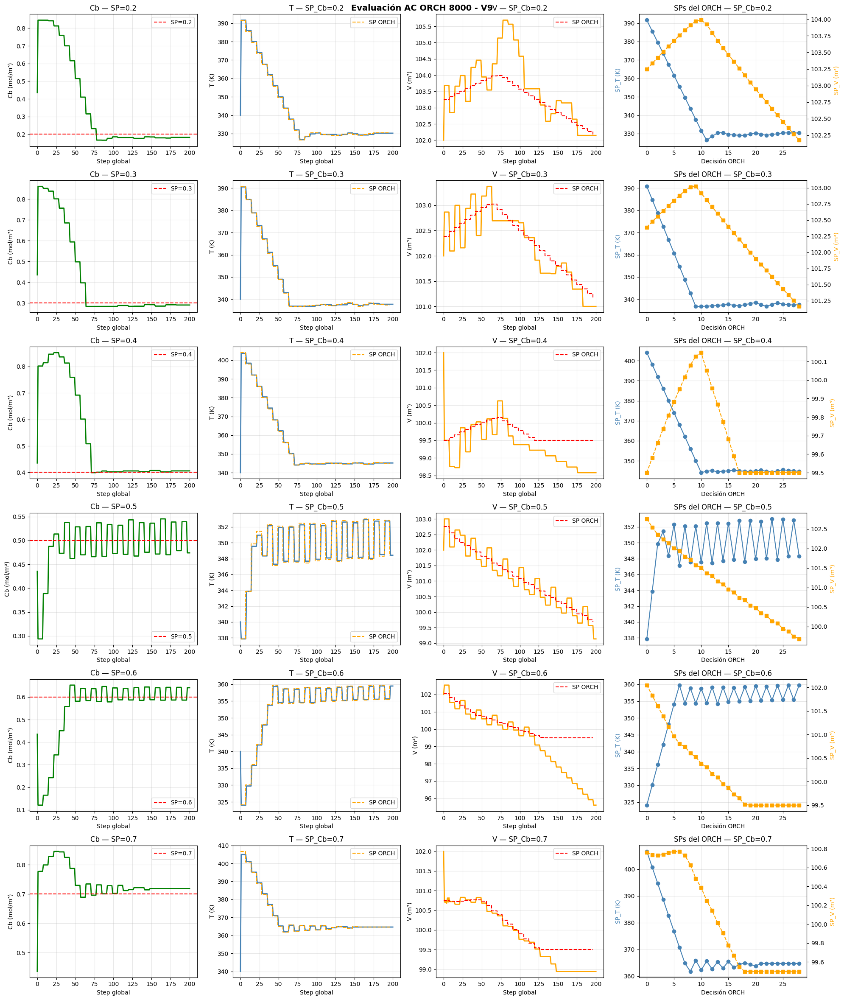

In [ ]:
# ============ GRILLA DE Cb Y GRAFICOS ============
Cb_setpoints = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7]

fig, axes = plt.subplots(len(Cb_setpoints), 4, figsize=(20, 4 * len(Cb_setpoints)))

for i, cb_sp in enumerate(Cb_setpoints):
    cb_traj, T_traj, V_traj, SP_T, SP_V = evaluar_cb(trainer_eval, cb_sp)
    steps = np.arange(len(cb_traj))

    # Cb
    axes[i, 0].plot(steps, cb_traj, color='green', linewidth=2)
    axes[i, 0].axhline(cb_sp, color='red', linestyle='--', linewidth=1.5, label=f'SP={cb_sp}')
    axes[i, 0].set_title(f'Cb — SP={cb_sp}')
    axes[i, 0].set_ylabel('Cb (mol/m³)')
    axes[i, 0].legend(); axes[i, 0].grid(True, alpha=0.3)

    # T con los SPs que pidió el ORCH marcados
    axes[i, 1].plot(steps, T_traj, color='steelblue', linewidth=2)
    if SP_T:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_T))]
        axes[i, 1].step(sp_steps, SP_T, color='orange', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 1].legend()
    axes[i, 1].set_title(f'T — SP_Cb={cb_sp}')
    axes[i, 1].set_ylabel('T (K)'); axes[i, 1].grid(True, alpha=0.3)

    # V con los SPs que pidió el ORCH marcados
    axes[i, 2].plot(steps, V_traj, color='orange', linewidth=2)
    if SP_V:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_V))]
        axes[i, 2].step(sp_steps, SP_V, color='red', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 2].legend()
    axes[i, 2].set_title(f'V — SP_Cb={cb_sp}')
    axes[i, 2].set_ylabel('V (m³)'); axes[i, 2].grid(True, alpha=0.3)

    # SPs del ORCH a lo largo del episodio
    if SP_T and SP_V:
        dec_idx = np.arange(len(SP_T))
        axes[i, 3].plot(dec_idx, SP_T, 'o-', color='steelblue', label='SP_T')
        ax2 = axes[i, 3].twinx()
        ax2.plot(dec_idx, SP_V, 's--', color='orange', label='SP_V')
        axes[i, 3].set_title(f'SPs del ORCH — SP_Cb={cb_sp}')
        axes[i, 3].set_xlabel('Decisión ORCH')
        axes[i, 3].set_ylabel('SP_T (K)', color='steelblue')
        ax2.set_ylabel('SP_V (m³)', color='orange')
        axes[i, 3].grid(True, alpha=0.3)

    for ax in axes[i, :3]:
        ax.set_xlabel('Step global')

plt.suptitle('Evaluación AC ORCH 8000 - V9', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('eval_ac_orch__8000_V9', dpi=150, bbox_inches='tight')
plt.show()

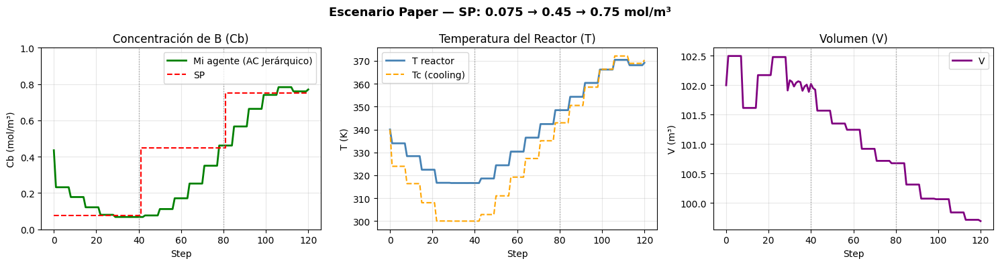


Errores por setpoint:
  SP=0.075 → Cb=0.0682 | Error=0.0068
  SP=0.45 → Cb=0.4616 | Error=0.0116
  SP=0.75 → Cb=0.7701 | Error=0.0201


In [ ]:
# ============ EVALUACIÓN ESCENARIO PAPER — FIGURA 7 ============
cb, T, V, sp, Tc = evaluar_paper_freq(
    trainer_eval,
    sp_sequence=[0.075, 0.45, 0.75],
    steps_per_sp=40,
    orch_freq=7
)

steps = np.arange(len(cb))

fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# --- Cb vs SP (el gráfico principal para comparar con el paper) ---
axes[0].plot(steps, cb, color='green', linewidth=2, label='Mi agente (AC Jerárquico)')
axes[0].step(steps, sp, color='red', linestyle='--', linewidth=1.5, where='post', label='SP')
axes[0].set_title('Concentración de B (Cb)')
axes[0].set_ylabel('Cb (mol/m³)')
axes[0].set_xlabel('Step')
axes[0].set_ylim(0, 1)
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# --- Temperatura del reactor ---
axes[1].plot(steps, T, color='steelblue', linewidth=2, label='T reactor')
axes[1].plot(steps, Tc, color='orange', linestyle='--', linewidth=1.5, label='Tc (cooling)')
axes[1].set_title('Temperatura del Reactor (T)')
axes[1].set_ylabel('T (K)')
axes[1].set_xlabel('Step')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

# --- Volumen ---
axes[2].plot(steps, V, color='purple', linewidth=2, label='V')
axes[2].set_title('Volumen (V)')
axes[2].set_ylabel('V (m³)')
axes[2].set_xlabel('Step')
axes[2].legend()
axes[2].grid(True, alpha=0.3)

# Líneas verticales marcando cambios de SP
for ax in axes:
    ax.axvline(x=40, color='gray', linestyle=':', linewidth=1, alpha=0.7)
    ax.axvline(x=80, color='gray', linestyle=':', linewidth=1, alpha=0.7)

plt.suptitle('Escenario Paper — SP: 0.075 → 0.45 → 0.75 mol/m³',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('eval_escenario_paper.png', dpi=150, bbox_inches='tight')
plt.show()

# --- Errores por SP ---
print("\nErrores por setpoint:")
for i, s in enumerate([0.075, 0.45, 0.75]):
    idx = min((i+1)*40, len(cb)-1)
    print(f"  SP={s} → Cb={cb[idx]:.4f} | Error={abs(cb[idx]-s):.4f}")

## Prueba V10 con 15000 episodios

In [ ]:
api = wandb.Api()
artifact = api.artifact('ve326684-universidad-ort-uruguay/Tesis_AC_ORCH_15K_V10/model_ac_orch_15k_run-v10:latest')
artifact_dir = artifact.download()

DEVICE             = 'cuda' if torch.cuda.is_available() else 'cpu'
MANIPULABLE_RANGES = [(300, 420), (99.5, 104)]
ORCH_FREQ          = 7
N_DEC_ORCH         = 8
MAX_STEPS          = 200

eval_config = {
    'env_config': {
        'architecture'             : 'jerarquica',
        'env_type'                 : 'simulation',
        'n_manipulable_vars'       : 2,
        'manipulable_ranges'       : MANIPULABLE_RANGES,
        'n_target_vars'            : 1,
        'target_ranges'            : [(0.05, 0.9)],
        'target_setpoints'         : [0.4],
        'target_working_ranges'    : [(0.0, 2.0)],
        'dt_usuario'               : 1.0,
        'max_steps'                : MAX_STEPS,
        'orch_freq'                : ORCH_FREQ,
        'max_time_detector'        : 200,
        'reward_dead_band'         : 0.02,
        'delta_percent_ctrl'       : 0.05,
        'delta_percent_orch'       : 0.05,
        'reward_weights'           : {'error': 1.0, 'tiempo': 0.001, 'overshoot': 0.3, 'energy': 0.001},
        'pid_limits'               : [(0.01, 5.0), (0.001, 1.0), (0.0, 1.0)],
        'agent_orchestrator_config': {'agent_type': 'continuous'},
        'env_type_config'          : {'dt': 1.0, 'control_limits': (MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1])},
        'stability_config'         : {
            'error_increase_tolerance': 2.0,
            'max_sign_changes_ratio'  : 0.2,
            'max_abrupt_change_ratio' : 0.05,
            'abrupt_change_threshold' : 0.5,
        },
    },
    'ctrl_checkpoint_path': f'{artifact_dir}/agent_ctrl_best.pt',
    'agent_ctrl_config': {
        'algorithm'  : 'ac',
        'state_dim'  : 10,
        'action_dim' : 6,
        'n_vars'     : 2,
        'action_type': 'continuous',
        'hidden_dims': (256, 128, 64),
        'device'     : DEVICE,
    },
    'agent_orch_config': {
        'algorithm'    : 'ac',
        'state_dim'    : 7,
        'action_dim'   : 2,
        'n_vars'       : 2,
        'action_type'  : 'continuous',
        'hidden_dims'  : (64, 32),
        'lr_actor'     : 2e-05,
        'lr_critic'    : 1e-03,
        'gamma'        : 0.9,
        'entropy_coef' : 0.15,
        'batch_size'   : 64,
        'buffer_size'  : 10000,
        'warmup_steps' : 200,
        'device'       : DEVICE,
        'seed'         : 42,
    },
    'n_episodes'                  : 1,
    'max_steps_per_episode'       : MAX_STEPS,
    'eval_frequency'              : 9999,
    'log_frequency'               : 1,
    'save_frequency'              : 9999,
    'checkpoint_dir'              : 'checkpoints/eval_tmp',
    'early_stopping_patience'     : 9999,
    'early_stopping_min_delta_pct': 0.01,
    'use_wandb'                   : False,
}

cstr = CSTRSimulator(dt=1.0, control_limits=(MANIPULABLE_RANGES[0], MANIPULABLE_RANGES[1]))
trainer_eval = ACTrainer(eval_config)
trainer_eval.env.proceso.connect_external_process(cstr)
trainer_eval.agent_orch.load(f'{artifact_dir}/agent_orch_best.pt')
print('Agentes cargados')
print(f'orch_freq={ORCH_FREQ} | max_steps={MAX_STEPS} | decisiones ORCH/ep={N_DEC_ORCH}')

wandb:   16 of 16 files downloaded.  


Cargando agente CTRL pre-entrenado desde: /content/artifacts/model_ac_orch_15k_run-v10:v12/agent_ctrl_best.pt
AC Estocástico creado | role=ctrl | state=10 | action=6 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-v10:v12/agent_ctrl_best.pt
AC Estocástico creado | role=orch | state=7 | action=2 | device=cpu
AC Agent cargado desde: /content/artifacts/model_ac_orch_15k_run-v10:v12/agent_orch_best.pt
Agentes cargados
orch_freq=7 | max_steps=200 | decisiones ORCH/ep=8



SP_Cb=0.2 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=387.7K  SP_V=101.78m³ | Cb=0.8654
  Step   7 | ORCH actúa → SP_T=381.7K  SP_V=101.86m³ | Cb=0.8436
  Step  14 | ORCH actúa → SP_T=375.7K  SP_V=101.95m³ | Cb=0.8231
  Step  21 | ORCH actúa → SP_T=369.7K  SP_V=102.03m³ | Cb=0.7835
  Step  28 | ORCH actúa → SP_T=363.7K  SP_V=102.11m³ | Cb=0.7184
  Step  35 | ORCH actúa → SP_T=357.7K  SP_V=102.18m³ | Cb=0.6404
  Step  42 | ORCH actúa → SP_T=351.7K  SP_V=102.26m³ | Cb=0.5490
  Step  49 | ORCH actúa → SP_T=345.7K  SP_V=102.33m³ | Cb=0.4432
  Step  56 | ORCH actúa → SP_T=339.7K  SP_V=102.39m³ | Cb=0.3444
  Step  63 | ORCH actúa → SP_T=333.8K  SP_V=102.44m³ | Cb=0.2561
  Step  70 | ORCH actúa → SP_T=327.9K  SP_V=102.43m³ | Cb=0.1797
  Step  77 | ORCH actúa → SP_T=328.7K  SP_V=102.33m³ | Cb=0.1797
  Step  84 | ORCH actúa → SP_T=329.3K  SP_V=102.23m³ | Cb=0.1714
  Step  91 | ORCH actúa → SP_T=331.2K  SP_V=102.13m³ | Cb=0.1911
  Step  98 | ORCH actúa → SP

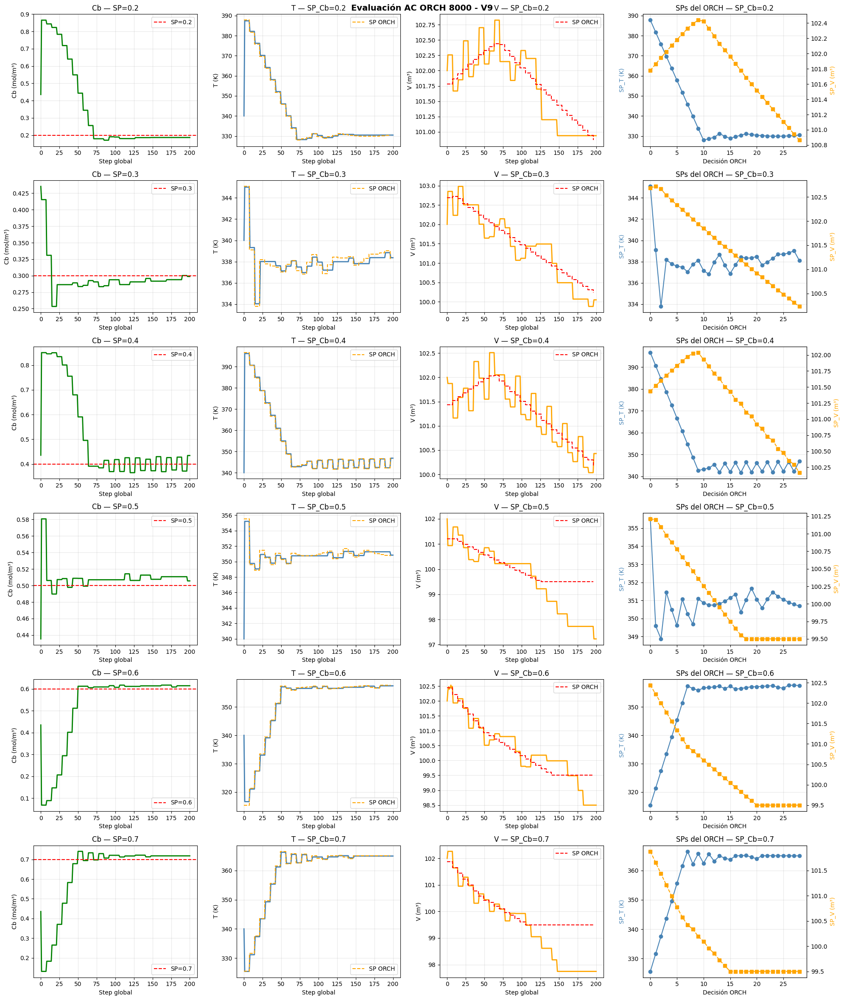

In [ ]:
# ============ GRILLA DE Cb Y GRAFICOS ============
Cb_setpoints = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7]

fig, axes = plt.subplots(len(Cb_setpoints), 4, figsize=(20, 4 * len(Cb_setpoints)))

for i, cb_sp in enumerate(Cb_setpoints):
    cb_traj, T_traj, V_traj, SP_T, SP_V = evaluar_cb(trainer_eval, cb_sp)
    steps = np.arange(len(cb_traj))

    # Cb
    axes[i, 0].plot(steps, cb_traj, color='green', linewidth=2)
    axes[i, 0].axhline(cb_sp, color='red', linestyle='--', linewidth=1.5, label=f'SP={cb_sp}')
    axes[i, 0].set_title(f'Cb — SP={cb_sp}')
    axes[i, 0].set_ylabel('Cb (mol/m³)')
    axes[i, 0].legend(); axes[i, 0].grid(True, alpha=0.3)

    # T con los SPs que pidió el ORCH marcados
    axes[i, 1].plot(steps, T_traj, color='steelblue', linewidth=2)
    if SP_T:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_T))]
        axes[i, 1].step(sp_steps, SP_T, color='orange', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 1].legend()
    axes[i, 1].set_title(f'T — SP_Cb={cb_sp}')
    axes[i, 1].set_ylabel('T (K)'); axes[i, 1].grid(True, alpha=0.3)

    # V con los SPs que pidió el ORCH marcados
    axes[i, 2].plot(steps, V_traj, color='orange', linewidth=2)
    if SP_V:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_V))]
        axes[i, 2].step(sp_steps, SP_V, color='red', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 2].legend()
    axes[i, 2].set_title(f'V — SP_Cb={cb_sp}')
    axes[i, 2].set_ylabel('V (m³)'); axes[i, 2].grid(True, alpha=0.3)

    # SPs del ORCH a lo largo del episodio
    if SP_T and SP_V:
        dec_idx = np.arange(len(SP_T))
        axes[i, 3].plot(dec_idx, SP_T, 'o-', color='steelblue', label='SP_T')
        ax2 = axes[i, 3].twinx()
        ax2.plot(dec_idx, SP_V, 's--', color='orange', label='SP_V')
        axes[i, 3].set_title(f'SPs del ORCH — SP_Cb={cb_sp}')
        axes[i, 3].set_xlabel('Decisión ORCH')
        axes[i, 3].set_ylabel('SP_T (K)', color='steelblue')
        ax2.set_ylabel('SP_V (m³)', color='orange')
        axes[i, 3].grid(True, alpha=0.3)

    for ax in axes[i, :3]:
        ax.set_xlabel('Step global')

plt.suptitle('Evaluación AC ORCH 15000 - V10', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('eval_ac_orch__15000_V10', dpi=150, bbox_inches='tight')
plt.show()


SP_Cb=0.2 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=339.8K  SP_V=100.08m³ | Cb=0.2994
  Step   7 | ORCH actúa → SP_T=333.8K  SP_V=100.11m³ | Cb=0.2463
  Step  14 | ORCH actúa → SP_T=328.1K  SP_V=100.11m³ | Cb=0.1789
  Step  21 | ORCH actúa → SP_T=331.3K  SP_V=100.01m³ | Cb=0.1879
  Step  28 | ORCH actúa → SP_T=332.4K  SP_V=99.93m³ | Cb=0.1978
  Step  35 | ORCH actúa → SP_T=331.4K  SP_V=99.86m³ | Cb=0.1993
  Step  42 | ORCH actúa → SP_T=330.4K  SP_V=99.80m³ | Cb=0.1934
  Step  49 | ORCH actúa → SP_T=330.9K  SP_V=99.72m³ | Cb=0.1934
  Step  56 | ORCH actúa → SP_T=331.4K  SP_V=99.64m³ | Cb=0.1932
  Step  63 | ORCH actúa → SP_T=331.8K  SP_V=99.57m³ | Cb=0.1972
  Step  70 | ORCH actúa → SP_T=331.5K  SP_V=99.50m³ | Cb=0.1972
  Step  77 | ORCH actúa → SP_T=331.2K  SP_V=99.50m³ | Cb=0.1972
  Step  84 | ORCH actúa → SP_T=331.1K  SP_V=99.50m³ | Cb=0.1958
  Step  91 | ORCH actúa → SP_T=331.2K  SP_V=99.50m³ | Cb=0.1958
  Step  98 | ORCH actúa → SP_T=331.3K 

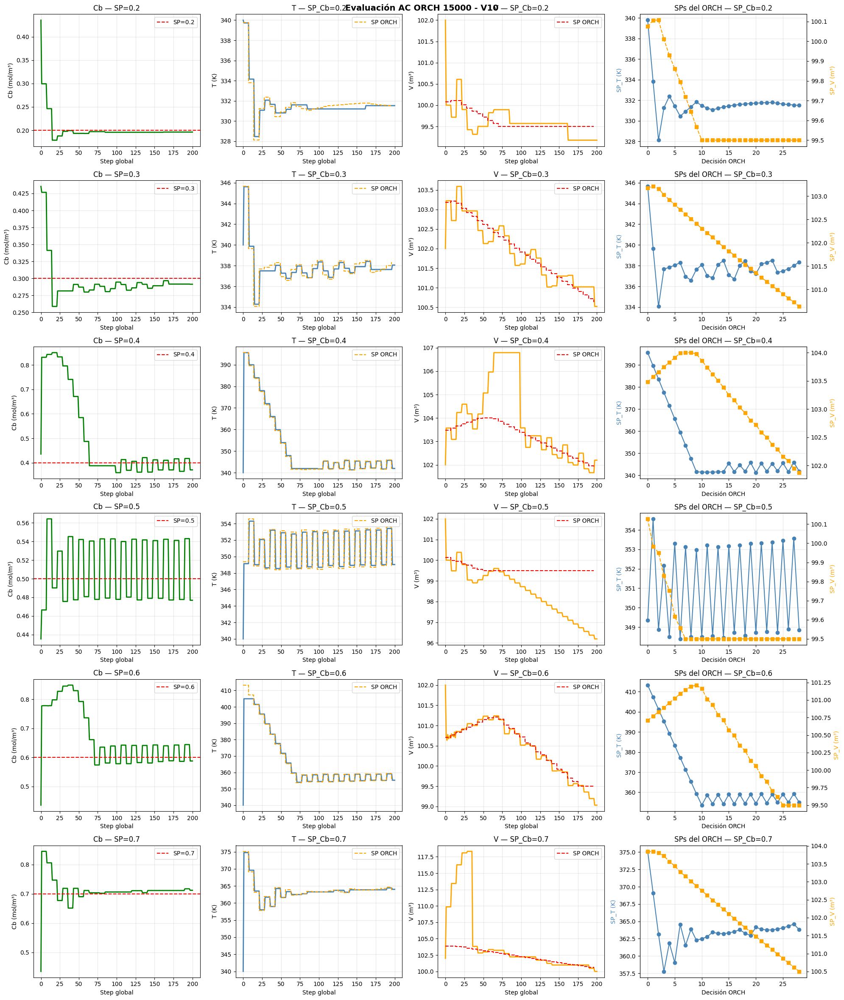

In [ ]:
# ============ GRILLA DE Cb Y GRAFICOS ============
Cb_setpoints = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7]

fig, axes = plt.subplots(len(Cb_setpoints), 4, figsize=(20, 4 * len(Cb_setpoints)))

for i, cb_sp in enumerate(Cb_setpoints):
    cb_traj, T_traj, V_traj, SP_T, SP_V = evaluar_cb(trainer_eval, cb_sp)
    steps = np.arange(len(cb_traj))

    # Cb
    axes[i, 0].plot(steps, cb_traj, color='green', linewidth=2)
    axes[i, 0].axhline(cb_sp, color='red', linestyle='--', linewidth=1.5, label=f'SP={cb_sp}')
    axes[i, 0].set_title(f'Cb — SP={cb_sp}')
    axes[i, 0].set_ylabel('Cb (mol/m³)')
    axes[i, 0].legend(); axes[i, 0].grid(True, alpha=0.3)

    # T con los SPs que pidió el ORCH marcados
    axes[i, 1].plot(steps, T_traj, color='steelblue', linewidth=2)
    if SP_T:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_T))]
        axes[i, 1].step(sp_steps, SP_T, color='orange', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 1].legend()
    axes[i, 1].set_title(f'T — SP_Cb={cb_sp}')
    axes[i, 1].set_ylabel('T (K)'); axes[i, 1].grid(True, alpha=0.3)

    # V con los SPs que pidió el ORCH marcados
    axes[i, 2].plot(steps, V_traj, color='orange', linewidth=2)
    if SP_V:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_V))]
        axes[i, 2].step(sp_steps, SP_V, color='red', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 2].legend()
    axes[i, 2].set_title(f'V — SP_Cb={cb_sp}')
    axes[i, 2].set_ylabel('V (m³)'); axes[i, 2].grid(True, alpha=0.3)

    # SPs del ORCH a lo largo del episodio
    if SP_T and SP_V:
        dec_idx = np.arange(len(SP_T))
        axes[i, 3].plot(dec_idx, SP_T, 'o-', color='steelblue', label='SP_T')
        ax2 = axes[i, 3].twinx()
        ax2.plot(dec_idx, SP_V, 's--', color='orange', label='SP_V')
        axes[i, 3].set_title(f'SPs del ORCH — SP_Cb={cb_sp}')
        axes[i, 3].set_xlabel('Decisión ORCH')
        axes[i, 3].set_ylabel('SP_T (K)', color='steelblue')
        ax2.set_ylabel('SP_V (m³)', color='orange')
        axes[i, 3].grid(True, alpha=0.3)

    for ax in axes[i, :3]:
        ax.set_xlabel('Step global')

plt.suptitle('Evaluación AC ORCH 15000 - V10', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('eval_ac_orch__15000_V10', dpi=150, bbox_inches='tight')
plt.show()

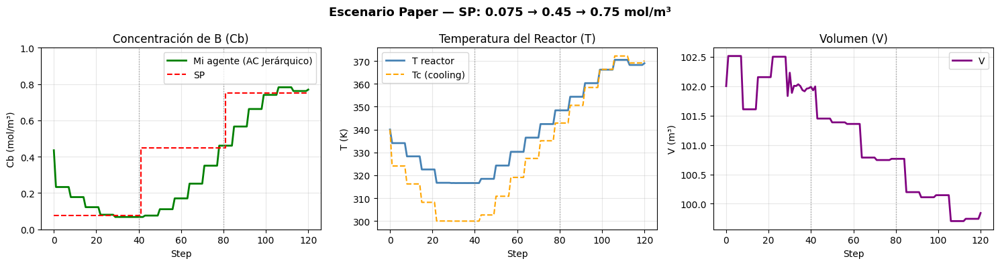


Errores por setpoint:
  SP=0.075 → Cb=0.0682 | Error=0.0068
  SP=0.45 → Cb=0.4608 | Error=0.0108
  SP=0.75 → Cb=0.7694 | Error=0.0194


In [ ]:
# ============ EVALUACIÓN ESCENARIO PAPER — FIGURA 7 ============
cb, T, V, sp, Tc = evaluar_paper_freq(
    trainer_eval,
    sp_sequence=[0.075, 0.45, 0.75],
    steps_per_sp=40,
    orch_freq=7
)

steps = np.arange(len(cb))

fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# --- Cb vs SP (el gráfico principal para comparar con el paper) ---
axes[0].plot(steps, cb, color='green', linewidth=2, label='Mi agente (AC Jerárquico)')
axes[0].step(steps, sp, color='red', linestyle='--', linewidth=1.5, where='post', label='SP')
axes[0].set_title('Concentración de B (Cb)')
axes[0].set_ylabel('Cb (mol/m³)')
axes[0].set_xlabel('Step')
axes[0].set_ylim(0, 1)
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# --- Temperatura del reactor ---
axes[1].plot(steps, T, color='steelblue', linewidth=2, label='T reactor')
axes[1].plot(steps, Tc, color='orange', linestyle='--', linewidth=1.5, label='Tc (cooling)')
axes[1].set_title('Temperatura del Reactor (T)')
axes[1].set_ylabel('T (K)')
axes[1].set_xlabel('Step')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

# --- Volumen ---
axes[2].plot(steps, V, color='purple', linewidth=2, label='V')
axes[2].set_title('Volumen (V)')
axes[2].set_ylabel('V (m³)')
axes[2].set_xlabel('Step')
axes[2].legend()
axes[2].grid(True, alpha=0.3)

# Líneas verticales marcando cambios de SP
for ax in axes:
    ax.axvline(x=40, color='gray', linestyle=':', linewidth=1, alpha=0.7)
    ax.axvline(x=80, color='gray', linestyle=':', linewidth=1, alpha=0.7)

plt.suptitle('Escenario Paper — SP: 0.075 → 0.45 → 0.75 mol/m³',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('eval_escenario_paper.png', dpi=150, bbox_inches='tight')
plt.show()

# --- Errores por SP ---
print("\nErrores por setpoint:")
for i, s in enumerate([0.075, 0.45, 0.75]):
    idx = min((i+1)*40, len(cb)-1)
    print(f"  SP={s} → Cb={cb[idx]:.4f} | Error={abs(cb[idx]-s):.4f}")

In [ ]:
import random
import numpy as np
import torch

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)



SP_Cb=0.2 | Estado inicial: Cb=0.435 | T=340.0K | V=102.00m³
  Step   0 | ORCH actúa → SP_T=371.6K  SP_V=99.56m³ | Cb=0.7874
  Step   7 | ORCH actúa → SP_T=365.6K  SP_V=99.63m³ | Cb=0.7337
  Step  14 | ORCH actúa → SP_T=359.6K  SP_V=99.71m³ | Cb=0.6615
  Step  21 | ORCH actúa → SP_T=353.6K  SP_V=99.77m³ | Cb=0.5744
  Step  28 | ORCH actúa → SP_T=347.6K  SP_V=99.84m³ | Cb=0.4722
  Step  35 | ORCH actúa → SP_T=341.6K  SP_V=99.90m³ | Cb=0.3674
  Step  42 | ORCH actúa → SP_T=335.6K  SP_V=99.94m³ | Cb=0.2767
  Step  49 | ORCH actúa → SP_T=329.7K  SP_V=99.97m³ | Cb=0.1977
  Step  56 | ORCH actúa → SP_T=329.2K  SP_V=99.90m³ | Cb=0.1809
  Step  63 | ORCH actúa → SP_T=332.1K  SP_V=99.80m³ | Cb=0.1979
  Step  70 | ORCH actúa → SP_T=331.4K  SP_V=99.73m³ | Cb=0.1993
  Step  77 | ORCH actúa → SP_T=330.5K  SP_V=99.67m³ | Cb=0.1938
  Step  84 | ORCH actúa → SP_T=331.0K  SP_V=99.59m³ | Cb=0.1938
  Step  91 | ORCH actúa → SP_T=331.5K  SP_V=99.52m³ | Cb=0.1940
  Step  98 | ORCH actúa → SP_T=331.9K  SP_

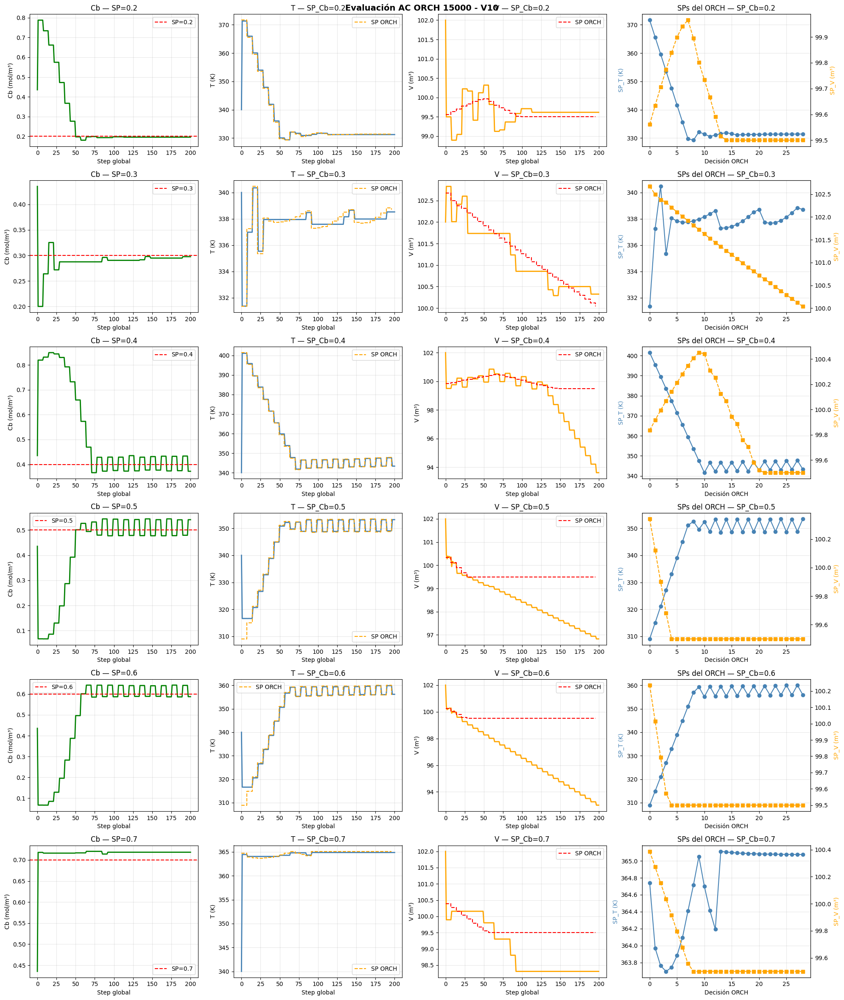

In [ ]:
# ============ GRILLA DE Cb Y GRAFICOS ============
Cb_setpoints = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7]

fig, axes = plt.subplots(len(Cb_setpoints), 4, figsize=(20, 4 * len(Cb_setpoints)))

for i, cb_sp in enumerate(Cb_setpoints):
    cb_traj, T_traj, V_traj, SP_T, SP_V = evaluar_cb(trainer_eval, cb_sp)
    steps = np.arange(len(cb_traj))

    # Cb
    axes[i, 0].plot(steps, cb_traj, color='green', linewidth=2)
    axes[i, 0].axhline(cb_sp, color='red', linestyle='--', linewidth=1.5, label=f'SP={cb_sp}')
    axes[i, 0].set_title(f'Cb — SP={cb_sp}')
    axes[i, 0].set_ylabel('Cb (mol/m³)')
    axes[i, 0].legend(); axes[i, 0].grid(True, alpha=0.3)

    # T con los SPs que pidió el ORCH marcados
    axes[i, 1].plot(steps, T_traj, color='steelblue', linewidth=2)
    if SP_T:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_T))]
        axes[i, 1].step(sp_steps, SP_T, color='orange', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 1].legend()
    axes[i, 1].set_title(f'T — SP_Cb={cb_sp}')
    axes[i, 1].set_ylabel('T (K)'); axes[i, 1].grid(True, alpha=0.3)

    # V con los SPs que pidió el ORCH marcados
    axes[i, 2].plot(steps, V_traj, color='orange', linewidth=2)
    if SP_V:
        sp_steps = [j * ORCH_FREQ for j in range(len(SP_V))]
        axes[i, 2].step(sp_steps, SP_V, color='red', linewidth=1.5,
                        linestyle='--', where='post', label='SP ORCH')
        axes[i, 2].legend()
    axes[i, 2].set_title(f'V — SP_Cb={cb_sp}')
    axes[i, 2].set_ylabel('V (m³)'); axes[i, 2].grid(True, alpha=0.3)

    # SPs del ORCH a lo largo del episodio
    if SP_T and SP_V:
        dec_idx = np.arange(len(SP_T))
        axes[i, 3].plot(dec_idx, SP_T, 'o-', color='steelblue', label='SP_T')
        ax2 = axes[i, 3].twinx()
        ax2.plot(dec_idx, SP_V, 's--', color='orange', label='SP_V')
        axes[i, 3].set_title(f'SPs del ORCH — SP_Cb={cb_sp}')
        axes[i, 3].set_xlabel('Decisión ORCH')
        axes[i, 3].set_ylabel('SP_T (K)', color='steelblue')
        ax2.set_ylabel('SP_V (m³)', color='orange')
        axes[i, 3].grid(True, alpha=0.3)

    for ax in axes[i, :3]:
        ax.set_xlabel('Step global')

plt.suptitle('Evaluación AC ORCH 15000 - V10', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('eval_ac_orch__15000_V10', dpi=150, bbox_inches='tight')
plt.show()